This code has been prepared for the master thesis "Extreme events and demand elasticity in energy system models with high renewable penetration and limited foresight" by Jonathan Gadfelt 

Copyright c2026 Jonathan Lybecker Gadfelt < jonathan@gadfelt.dk >
This work is licensed under a Creative Commons Attribution 4.0 International Licence (CC-BY).

# Initialisation

## - Setup, defining global parameters and loading data 

In [1]:
from functions_other import *
from functions_plots import *
from Classes import *
import locale

# Ensure english mdates for plotting
try:
    locale.setlocale(locale.LC_TIME, "en_US.UTF-8")
except locale.Error:
    locale.setlocale(locale.LC_TIME, "C")
    
print("Pypsa version:", pypsa.__version__)
print("Python version:", sys.version)

# Define the use technologies and regions(s)
region = 'ESP'  
setup_dispatch = {
    f'{region}': {
        'OCGT': True,
        'CCGT': False,
        'battery storage': False,
        'onwind': True,
        'offwind': False,
        'solar': True,
        'electrolysis': True,
        'fuel cell': True,
        'Hydrogen storage': True,
        'Reservoir hydro storage': False,
        'load shedding': True
    }
}

# Default weather, hydro and demand years
w_year_exp = 2009
h_year_exp = 2007
d_year_exp = 2018

# Default for Dispatch model settings
w_year_dispatch = 2009
h_year_dispatch = 2007
d_year_dispatch = 2018

weather_years = All_data['solar'].index.year.unique()[:31]

base_dir = os.getcwd()  # Gets the current working directory (where notebook is running)
N_results_path = os.path.join(base_dir, "Network_results")
Results_path = os.path.join(base_dir, "Results")
Figures_path = os.path.join(base_dir, "Figures")

sensitivity_analysis = False
save_plots = False

Figures_results_path = Figures_path
Figures_mdl_setup_path = Figures_path
Figures_appendix_path = Figures_path

default_figsize = (8, 6)

carrier_colors = {
    "electricity": "orange",
    "Hydrogen storage": "purple",
    "gas": "black",
    "onwind": "deepskyblue",
    "offwind": "dodgerblue",
    "solar": "yellow",
    "battery charge": "gold",
    "battery discharge": "darkorange",
    "battery storage": "goldenrod",
    "electrolysis": "limegreen",
    "fuel cell": "darkgreen",
    "hydrogen": "blue",
    "hydro": "slateblue",
    "load shedding": "red",
    "demand": "gray",
}

Pypsa version: 1.0.6
Python version: 3.11.13 | packaged by conda-forge | (main, Jun  4 2025, 14:39:58) [MSC v.1943 64 bit (AMD64)]


## - Loading networks and other results

### -- Capacity expansion model

#### --- Loading networks

In [3]:
# Load the EXP networks
Test_name_exp = "base_new"

folder_exp = f"N_EXP_d_{d_year_exp}_{Test_name_exp}"
networks_exp_base = load_networks(folder_name = folder_exp, weather_years = weather_years)

INFO:pypsa.network.io:New version 1.0.7 available! (Current: 1.0.6)
INFO:pypsa.network.io:Imported network 'Unnamed Network' has buses, carriers, generators, links, loads, stores, sub_networks
INFO:pypsa.network.io:New version 1.0.7 available! (Current: 1.0.6)


Loaded N_1979 from N_w-1979_d-2018_ESP_base_new.nc


INFO:pypsa.network.io:Imported network 'Unnamed Network' has buses, carriers, generators, links, loads, stores, sub_networks
INFO:pypsa.network.io:New version 1.0.7 available! (Current: 1.0.6)


Loaded N_1980 from N_w-1980_d-2018_ESP_base_new.nc


INFO:pypsa.network.io:Imported network 'Unnamed Network' has buses, carriers, generators, links, loads, stores, sub_networks
INFO:pypsa.network.io:New version 1.0.7 available! (Current: 1.0.6)


Loaded N_1981 from N_w-1981_d-2018_ESP_base_new.nc


INFO:pypsa.network.io:Imported network 'Unnamed Network' has buses, carriers, generators, links, loads, stores, sub_networks
INFO:pypsa.network.io:New version 1.0.7 available! (Current: 1.0.6)


Loaded N_1982 from N_w-1982_d-2018_ESP_base_new.nc


INFO:pypsa.network.io:Imported network 'Unnamed Network' has buses, carriers, generators, links, loads, stores, sub_networks
INFO:pypsa.network.io:New version 1.0.7 available! (Current: 1.0.6)


Loaded N_1983 from N_w-1983_d-2018_ESP_base_new.nc


INFO:pypsa.network.io:Imported network 'Unnamed Network' has buses, carriers, generators, links, loads, stores, sub_networks
INFO:pypsa.network.io:New version 1.0.7 available! (Current: 1.0.6)


Loaded N_1984 from N_w-1984_d-2018_ESP_base_new.nc


INFO:pypsa.network.io:Imported network 'Unnamed Network' has buses, carriers, generators, links, loads, stores, sub_networks
INFO:pypsa.network.io:New version 1.0.7 available! (Current: 1.0.6)


Loaded N_1985 from N_w-1985_d-2018_ESP_base_new.nc


INFO:pypsa.network.io:Imported network 'Unnamed Network' has buses, carriers, generators, links, loads, stores, sub_networks
INFO:pypsa.network.io:New version 1.0.7 available! (Current: 1.0.6)


Loaded N_1986 from N_w-1986_d-2018_ESP_base_new.nc


INFO:pypsa.network.io:Imported network 'Unnamed Network' has buses, carriers, generators, links, loads, stores, sub_networks
INFO:pypsa.network.io:New version 1.0.7 available! (Current: 1.0.6)


Loaded N_1987 from N_w-1987_d-2018_ESP_base_new.nc


INFO:pypsa.network.io:Imported network 'Unnamed Network' has buses, carriers, generators, links, loads, stores, sub_networks
INFO:pypsa.network.io:New version 1.0.7 available! (Current: 1.0.6)


Loaded N_1988 from N_w-1988_d-2018_ESP_base_new.nc


INFO:pypsa.network.io:Imported network 'Unnamed Network' has buses, carriers, generators, links, loads, stores, sub_networks
INFO:pypsa.network.io:New version 1.0.7 available! (Current: 1.0.6)


Loaded N_1989 from N_w-1989_d-2018_ESP_base_new.nc


INFO:pypsa.network.io:Imported network 'Unnamed Network' has buses, carriers, generators, links, loads, stores, sub_networks
INFO:pypsa.network.io:New version 1.0.7 available! (Current: 1.0.6)


Loaded N_1990 from N_w-1990_d-2018_ESP_base_new.nc


INFO:pypsa.network.io:Imported network 'Unnamed Network' has buses, carriers, generators, links, loads, stores, sub_networks
INFO:pypsa.network.io:New version 1.0.7 available! (Current: 1.0.6)


Loaded N_1991 from N_w-1991_d-2018_ESP_base_new.nc


INFO:pypsa.network.io:Imported network 'Unnamed Network' has buses, carriers, generators, links, loads, stores, sub_networks
INFO:pypsa.network.io:New version 1.0.7 available! (Current: 1.0.6)


Loaded N_1992 from N_w-1992_d-2018_ESP_base_new.nc


INFO:pypsa.network.io:Imported network 'Unnamed Network' has buses, carriers, generators, links, loads, stores, sub_networks
INFO:pypsa.network.io:New version 1.0.7 available! (Current: 1.0.6)


Loaded N_1993 from N_w-1993_d-2018_ESP_base_new.nc


INFO:pypsa.network.io:Imported network 'Unnamed Network' has buses, carriers, generators, links, loads, stores, sub_networks
INFO:pypsa.network.io:New version 1.0.7 available! (Current: 1.0.6)


Loaded N_1994 from N_w-1994_d-2018_ESP_base_new.nc


INFO:pypsa.network.io:Imported network 'Unnamed Network' has buses, carriers, generators, links, loads, stores, sub_networks
INFO:pypsa.network.io:New version 1.0.7 available! (Current: 1.0.6)


Loaded N_1995 from N_w-1995_d-2018_ESP_base_new.nc


INFO:pypsa.network.io:Imported network 'Unnamed Network' has buses, carriers, generators, links, loads, stores, sub_networks
INFO:pypsa.network.io:New version 1.0.7 available! (Current: 1.0.6)


Loaded N_1996 from N_w-1996_d-2018_ESP_base_new.nc


INFO:pypsa.network.io:Imported network 'Unnamed Network' has buses, carriers, generators, links, loads, stores, sub_networks
INFO:pypsa.network.io:New version 1.0.7 available! (Current: 1.0.6)


Loaded N_1997 from N_w-1997_d-2018_ESP_base_new.nc


INFO:pypsa.network.io:Imported network 'Unnamed Network' has buses, carriers, generators, links, loads, stores, sub_networks
INFO:pypsa.network.io:New version 1.0.7 available! (Current: 1.0.6)


Loaded N_1998 from N_w-1998_d-2018_ESP_base_new.nc


INFO:pypsa.network.io:Imported network 'Unnamed Network' has buses, carriers, generators, links, loads, stores, sub_networks
INFO:pypsa.network.io:New version 1.0.7 available! (Current: 1.0.6)


Loaded N_1999 from N_w-1999_d-2018_ESP_base_new.nc


INFO:pypsa.network.io:Imported network 'Unnamed Network' has buses, carriers, generators, links, loads, stores, sub_networks
INFO:pypsa.network.io:New version 1.0.7 available! (Current: 1.0.6)


Loaded N_2000 from N_w-2000_d-2018_ESP_base_new.nc


INFO:pypsa.network.io:Imported network 'Unnamed Network' has buses, carriers, generators, links, loads, stores, sub_networks
INFO:pypsa.network.io:New version 1.0.7 available! (Current: 1.0.6)


Loaded N_2001 from N_w-2001_d-2018_ESP_base_new.nc


INFO:pypsa.network.io:Imported network 'Unnamed Network' has buses, carriers, generators, links, loads, stores, sub_networks
INFO:pypsa.network.io:New version 1.0.7 available! (Current: 1.0.6)


Loaded N_2002 from N_w-2002_d-2018_ESP_base_new.nc


INFO:pypsa.network.io:Imported network 'Unnamed Network' has buses, carriers, generators, links, loads, stores, sub_networks
INFO:pypsa.network.io:New version 1.0.7 available! (Current: 1.0.6)


Loaded N_2003 from N_w-2003_d-2018_ESP_base_new.nc


INFO:pypsa.network.io:Imported network 'Unnamed Network' has buses, carriers, generators, links, loads, stores, sub_networks
INFO:pypsa.network.io:New version 1.0.7 available! (Current: 1.0.6)


Loaded N_2004 from N_w-2004_d-2018_ESP_base_new.nc


INFO:pypsa.network.io:Imported network 'Unnamed Network' has buses, carriers, generators, links, loads, stores, sub_networks
INFO:pypsa.network.io:New version 1.0.7 available! (Current: 1.0.6)


Loaded N_2005 from N_w-2005_d-2018_ESP_base_new.nc


INFO:pypsa.network.io:Imported network 'Unnamed Network' has buses, carriers, generators, links, loads, stores, sub_networks
INFO:pypsa.network.io:New version 1.0.7 available! (Current: 1.0.6)


Loaded N_2006 from N_w-2006_d-2018_ESP_base_new.nc


INFO:pypsa.network.io:Imported network 'Unnamed Network' has buses, carriers, generators, links, loads, stores, sub_networks
INFO:pypsa.network.io:New version 1.0.7 available! (Current: 1.0.6)


Loaded N_2007 from N_w-2007_d-2018_ESP_base_new.nc


INFO:pypsa.network.io:Imported network 'Unnamed Network' has buses, carriers, generators, links, loads, stores, sub_networks
INFO:pypsa.network.io:New version 1.0.7 available! (Current: 1.0.6)


Loaded N_2008 from N_w-2008_d-2018_ESP_base_new.nc


INFO:pypsa.network.io:Imported network 'Unnamed Network' has buses, carriers, generators, links, loads, stores, sub_networks


Loaded N_2009 from N_w-2009_d-2018_ESP_base_new.nc


#### --- Loading capacity results

In [4]:
opt_capacities_name = f"opt_cap_exp_model_d2018_{Test_name_exp}.csv"
opt_capacities_df = pd.read_csv(os.path.join(Results_path, opt_capacities_name), index_col=0)

### -- Dispatch results

#### --- Perfect foresight and rolling horizon models

In [5]:
Test_name_dispatch = "base_mean" 

folder_rh = f"N_RH_d_{d_year_dispatch}_{Test_name_dispatch}"
folder_pf = f"N_PF_d_{d_year_dispatch}_{Test_name_dispatch}"

networks_rh_base = load_networks(folder_name = folder_rh, weather_years = weather_years)
networks_pf_base = load_networks(folder_name = folder_pf, weather_years = weather_years)

INFO:pypsa.network.io:New version 1.0.7 available! (Current: 1.0.6)
INFO:pypsa.network.io:Imported network 'Unnamed Network' has buses, carriers, generators, links, loads, stores, sub_networks
INFO:pypsa.network.io:New version 1.0.7 available! (Current: 1.0.6)


Loaded N_1979 from N_RH_w-1979_d-2018_ESP_base_mean.nc


INFO:pypsa.network.io:Imported network 'Unnamed Network' has buses, carriers, generators, links, loads, stores, sub_networks
INFO:pypsa.network.io:New version 1.0.7 available! (Current: 1.0.6)


Loaded N_1980 from N_RH_w-1980_d-2018_ESP_base_mean.nc


INFO:pypsa.network.io:Imported network 'Unnamed Network' has buses, carriers, generators, links, loads, stores, sub_networks
INFO:pypsa.network.io:New version 1.0.7 available! (Current: 1.0.6)


Loaded N_1981 from N_RH_w-1981_d-2018_ESP_base_mean.nc


INFO:pypsa.network.io:Imported network 'Unnamed Network' has buses, carriers, generators, links, loads, stores, sub_networks
INFO:pypsa.network.io:New version 1.0.7 available! (Current: 1.0.6)


Loaded N_1982 from N_RH_w-1982_d-2018_ESP_base_mean.nc


INFO:pypsa.network.io:Imported network 'Unnamed Network' has buses, carriers, generators, links, loads, stores, sub_networks
INFO:pypsa.network.io:New version 1.0.7 available! (Current: 1.0.6)


Loaded N_1983 from N_RH_w-1983_d-2018_ESP_base_mean.nc


INFO:pypsa.network.io:Imported network 'Unnamed Network' has buses, carriers, generators, links, loads, stores, sub_networks
INFO:pypsa.network.io:New version 1.0.7 available! (Current: 1.0.6)


Loaded N_1984 from N_RH_w-1984_d-2018_ESP_base_mean.nc


INFO:pypsa.network.io:Imported network 'Unnamed Network' has buses, carriers, generators, links, loads, stores, sub_networks
INFO:pypsa.network.io:New version 1.0.7 available! (Current: 1.0.6)


Loaded N_1985 from N_RH_w-1985_d-2018_ESP_base_mean.nc


INFO:pypsa.network.io:Imported network 'Unnamed Network' has buses, carriers, generators, links, loads, stores, sub_networks
INFO:pypsa.network.io:New version 1.0.7 available! (Current: 1.0.6)


Loaded N_1986 from N_RH_w-1986_d-2018_ESP_base_mean.nc


INFO:pypsa.network.io:Imported network 'Unnamed Network' has buses, carriers, generators, links, loads, stores, sub_networks
INFO:pypsa.network.io:New version 1.0.7 available! (Current: 1.0.6)


Loaded N_1987 from N_RH_w-1987_d-2018_ESP_base_mean.nc


INFO:pypsa.network.io:Imported network 'Unnamed Network' has buses, carriers, generators, links, loads, stores, sub_networks
INFO:pypsa.network.io:New version 1.0.7 available! (Current: 1.0.6)


Loaded N_1988 from N_RH_w-1988_d-2018_ESP_base_mean.nc


INFO:pypsa.network.io:Imported network 'Unnamed Network' has buses, carriers, generators, links, loads, stores, sub_networks
INFO:pypsa.network.io:New version 1.0.7 available! (Current: 1.0.6)


Loaded N_1989 from N_RH_w-1989_d-2018_ESP_base_mean.nc


INFO:pypsa.network.io:Imported network 'Unnamed Network' has buses, carriers, generators, links, loads, stores, sub_networks
INFO:pypsa.network.io:New version 1.0.7 available! (Current: 1.0.6)


Loaded N_1990 from N_RH_w-1990_d-2018_ESP_base_mean.nc


INFO:pypsa.network.io:Imported network 'Unnamed Network' has buses, carriers, generators, links, loads, stores, sub_networks
INFO:pypsa.network.io:New version 1.0.7 available! (Current: 1.0.6)


Loaded N_1991 from N_RH_w-1991_d-2018_ESP_base_mean.nc


INFO:pypsa.network.io:Imported network 'Unnamed Network' has buses, carriers, generators, links, loads, stores, sub_networks


Loaded N_1992 from N_RH_w-1992_d-2018_ESP_base_mean.nc


INFO:pypsa.network.io:New version 1.0.7 available! (Current: 1.0.6)
INFO:pypsa.network.io:Imported network 'Unnamed Network' has buses, carriers, generators, links, loads, stores, sub_networks
INFO:pypsa.network.io:New version 1.0.7 available! (Current: 1.0.6)


Loaded N_1993 from N_RH_w-1993_d-2018_ESP_base_mean.nc


INFO:pypsa.network.io:Imported network 'Unnamed Network' has buses, carriers, generators, links, loads, stores, sub_networks
INFO:pypsa.network.io:New version 1.0.7 available! (Current: 1.0.6)


Loaded N_1994 from N_RH_w-1994_d-2018_ESP_base_mean.nc


INFO:pypsa.network.io:Imported network 'Unnamed Network' has buses, carriers, generators, links, loads, stores, sub_networks
INFO:pypsa.network.io:New version 1.0.7 available! (Current: 1.0.6)


Loaded N_1995 from N_RH_w-1995_d-2018_ESP_base_mean.nc


INFO:pypsa.network.io:Imported network 'Unnamed Network' has buses, carriers, generators, links, loads, stores, sub_networks
INFO:pypsa.network.io:New version 1.0.7 available! (Current: 1.0.6)


Loaded N_1996 from N_RH_w-1996_d-2018_ESP_base_mean.nc


INFO:pypsa.network.io:Imported network 'Unnamed Network' has buses, carriers, generators, links, loads, stores, sub_networks
INFO:pypsa.network.io:New version 1.0.7 available! (Current: 1.0.6)


Loaded N_1997 from N_RH_w-1997_d-2018_ESP_base_mean.nc


INFO:pypsa.network.io:Imported network 'Unnamed Network' has buses, carriers, generators, links, loads, stores, sub_networks
INFO:pypsa.network.io:New version 1.0.7 available! (Current: 1.0.6)


Loaded N_1998 from N_RH_w-1998_d-2018_ESP_base_mean.nc


INFO:pypsa.network.io:Imported network 'Unnamed Network' has buses, carriers, generators, links, loads, stores, sub_networks
INFO:pypsa.network.io:New version 1.0.7 available! (Current: 1.0.6)


Loaded N_1999 from N_RH_w-1999_d-2018_ESP_base_mean.nc


INFO:pypsa.network.io:Imported network 'Unnamed Network' has buses, carriers, generators, links, loads, stores, sub_networks
INFO:pypsa.network.io:New version 1.0.7 available! (Current: 1.0.6)


Loaded N_2000 from N_RH_w-2000_d-2018_ESP_base_mean.nc


INFO:pypsa.network.io:Imported network 'Unnamed Network' has buses, carriers, generators, links, loads, stores, sub_networks
INFO:pypsa.network.io:New version 1.0.7 available! (Current: 1.0.6)


Loaded N_2001 from N_RH_w-2001_d-2018_ESP_base_mean.nc


INFO:pypsa.network.io:Imported network 'Unnamed Network' has buses, carriers, generators, links, loads, stores, sub_networks
INFO:pypsa.network.io:New version 1.0.7 available! (Current: 1.0.6)


Loaded N_2002 from N_RH_w-2002_d-2018_ESP_base_mean.nc


INFO:pypsa.network.io:Imported network 'Unnamed Network' has buses, carriers, generators, links, loads, stores, sub_networks
INFO:pypsa.network.io:New version 1.0.7 available! (Current: 1.0.6)


Loaded N_2003 from N_RH_w-2003_d-2018_ESP_base_mean.nc


INFO:pypsa.network.io:Imported network 'Unnamed Network' has buses, carriers, generators, links, loads, stores, sub_networks
INFO:pypsa.network.io:New version 1.0.7 available! (Current: 1.0.6)


Loaded N_2004 from N_RH_w-2004_d-2018_ESP_base_mean.nc


INFO:pypsa.network.io:Imported network 'Unnamed Network' has buses, carriers, generators, links, loads, stores, sub_networks
INFO:pypsa.network.io:New version 1.0.7 available! (Current: 1.0.6)


Loaded N_2005 from N_RH_w-2005_d-2018_ESP_base_mean.nc


INFO:pypsa.network.io:Imported network 'Unnamed Network' has buses, carriers, generators, links, loads, stores, sub_networks
INFO:pypsa.network.io:New version 1.0.7 available! (Current: 1.0.6)


Loaded N_2006 from N_RH_w-2006_d-2018_ESP_base_mean.nc


INFO:pypsa.network.io:Imported network 'Unnamed Network' has buses, carriers, generators, links, loads, stores, sub_networks
INFO:pypsa.network.io:New version 1.0.7 available! (Current: 1.0.6)


Loaded N_2007 from N_RH_w-2007_d-2018_ESP_base_mean.nc


INFO:pypsa.network.io:Imported network 'Unnamed Network' has buses, carriers, generators, links, loads, stores, sub_networks
INFO:pypsa.network.io:New version 1.0.7 available! (Current: 1.0.6)


Loaded N_2008 from N_RH_w-2008_d-2018_ESP_base_mean.nc


INFO:pypsa.network.io:Imported network 'Unnamed Network' has buses, carriers, generators, links, loads, stores, sub_networks
INFO:pypsa.network.io:New version 1.0.7 available! (Current: 1.0.6)


Loaded N_2009 from N_RH_w-2009_d-2018_ESP_base_mean.nc


INFO:pypsa.network.io:Imported network 'Unnamed Network' has buses, carriers, generators, links, loads, stores, sub_networks
INFO:pypsa.network.io:New version 1.0.7 available! (Current: 1.0.6)


Loaded N_1979 from N_PF_w-1979_d-2018_ESP_base_mean.nc


INFO:pypsa.network.io:Imported network 'Unnamed Network' has buses, carriers, generators, links, loads, stores, sub_networks
INFO:pypsa.network.io:New version 1.0.7 available! (Current: 1.0.6)


Loaded N_1980 from N_PF_w-1980_d-2018_ESP_base_mean.nc


INFO:pypsa.network.io:Imported network 'Unnamed Network' has buses, carriers, generators, links, loads, stores, sub_networks
INFO:pypsa.network.io:New version 1.0.7 available! (Current: 1.0.6)


Loaded N_1981 from N_PF_w-1981_d-2018_ESP_base_mean.nc


INFO:pypsa.network.io:Imported network 'Unnamed Network' has buses, carriers, generators, links, loads, stores, sub_networks
INFO:pypsa.network.io:New version 1.0.7 available! (Current: 1.0.6)


Loaded N_1982 from N_PF_w-1982_d-2018_ESP_base_mean.nc


INFO:pypsa.network.io:Imported network 'Unnamed Network' has buses, carriers, generators, links, loads, stores, sub_networks
INFO:pypsa.network.io:New version 1.0.7 available! (Current: 1.0.6)


Loaded N_1983 from N_PF_w-1983_d-2018_ESP_base_mean.nc


INFO:pypsa.network.io:Imported network 'Unnamed Network' has buses, carriers, generators, links, loads, stores, sub_networks
INFO:pypsa.network.io:New version 1.0.7 available! (Current: 1.0.6)


Loaded N_1984 from N_PF_w-1984_d-2018_ESP_base_mean.nc


INFO:pypsa.network.io:Imported network 'Unnamed Network' has buses, carriers, generators, links, loads, stores, sub_networks
INFO:pypsa.network.io:New version 1.0.7 available! (Current: 1.0.6)


Loaded N_1985 from N_PF_w-1985_d-2018_ESP_base_mean.nc


INFO:pypsa.network.io:Imported network 'Unnamed Network' has buses, carriers, generators, links, loads, stores, sub_networks
INFO:pypsa.network.io:New version 1.0.7 available! (Current: 1.0.6)


Loaded N_1986 from N_PF_w-1986_d-2018_ESP_base_mean.nc


INFO:pypsa.network.io:Imported network 'Unnamed Network' has buses, carriers, generators, links, loads, stores, sub_networks
INFO:pypsa.network.io:New version 1.0.7 available! (Current: 1.0.6)


Loaded N_1987 from N_PF_w-1987_d-2018_ESP_base_mean.nc


INFO:pypsa.network.io:Imported network 'Unnamed Network' has buses, carriers, generators, links, loads, stores, sub_networks
INFO:pypsa.network.io:New version 1.0.7 available! (Current: 1.0.6)


Loaded N_1988 from N_PF_w-1988_d-2018_ESP_base_mean.nc


INFO:pypsa.network.io:Imported network 'Unnamed Network' has buses, carriers, generators, links, loads, stores, sub_networks
INFO:pypsa.network.io:New version 1.0.7 available! (Current: 1.0.6)


Loaded N_1989 from N_PF_w-1989_d-2018_ESP_base_mean.nc


INFO:pypsa.network.io:Imported network 'Unnamed Network' has buses, carriers, generators, links, loads, stores, sub_networks
INFO:pypsa.network.io:New version 1.0.7 available! (Current: 1.0.6)


Loaded N_1990 from N_PF_w-1990_d-2018_ESP_base_mean.nc


INFO:pypsa.network.io:Imported network 'Unnamed Network' has buses, carriers, generators, links, loads, stores, sub_networks
INFO:pypsa.network.io:New version 1.0.7 available! (Current: 1.0.6)


Loaded N_1991 from N_PF_w-1991_d-2018_ESP_base_mean.nc


INFO:pypsa.network.io:Imported network 'Unnamed Network' has buses, carriers, generators, links, loads, stores, sub_networks
INFO:pypsa.network.io:New version 1.0.7 available! (Current: 1.0.6)


Loaded N_1992 from N_PF_w-1992_d-2018_ESP_base_mean.nc


INFO:pypsa.network.io:Imported network 'Unnamed Network' has buses, carriers, generators, links, loads, stores, sub_networks
INFO:pypsa.network.io:New version 1.0.7 available! (Current: 1.0.6)


Loaded N_1993 from N_PF_w-1993_d-2018_ESP_base_mean.nc


INFO:pypsa.network.io:Imported network 'Unnamed Network' has buses, carriers, generators, links, loads, stores, sub_networks
INFO:pypsa.network.io:New version 1.0.7 available! (Current: 1.0.6)


Loaded N_1994 from N_PF_w-1994_d-2018_ESP_base_mean.nc


INFO:pypsa.network.io:Imported network 'Unnamed Network' has buses, carriers, generators, links, loads, stores, sub_networks
INFO:pypsa.network.io:New version 1.0.7 available! (Current: 1.0.6)


Loaded N_1995 from N_PF_w-1995_d-2018_ESP_base_mean.nc


INFO:pypsa.network.io:Imported network 'Unnamed Network' has buses, carriers, generators, links, loads, stores, sub_networks
INFO:pypsa.network.io:New version 1.0.7 available! (Current: 1.0.6)


Loaded N_1996 from N_PF_w-1996_d-2018_ESP_base_mean.nc


INFO:pypsa.network.io:Imported network 'Unnamed Network' has buses, carriers, generators, links, loads, stores, sub_networks
INFO:pypsa.network.io:New version 1.0.7 available! (Current: 1.0.6)


Loaded N_1997 from N_PF_w-1997_d-2018_ESP_base_mean.nc


INFO:pypsa.network.io:Imported network 'Unnamed Network' has buses, carriers, generators, links, loads, stores, sub_networks
INFO:pypsa.network.io:New version 1.0.7 available! (Current: 1.0.6)


Loaded N_1998 from N_PF_w-1998_d-2018_ESP_base_mean.nc


INFO:pypsa.network.io:Imported network 'Unnamed Network' has buses, carriers, generators, links, loads, stores, sub_networks
INFO:pypsa.network.io:New version 1.0.7 available! (Current: 1.0.6)


Loaded N_1999 from N_PF_w-1999_d-2018_ESP_base_mean.nc


INFO:pypsa.network.io:Imported network 'Unnamed Network' has buses, carriers, generators, links, loads, stores, sub_networks
INFO:pypsa.network.io:New version 1.0.7 available! (Current: 1.0.6)


Loaded N_2000 from N_PF_w-2000_d-2018_ESP_base_mean.nc


INFO:pypsa.network.io:Imported network 'Unnamed Network' has buses, carriers, generators, links, loads, stores, sub_networks
INFO:pypsa.network.io:New version 1.0.7 available! (Current: 1.0.6)


Loaded N_2001 from N_PF_w-2001_d-2018_ESP_base_mean.nc


INFO:pypsa.network.io:Imported network 'Unnamed Network' has buses, carriers, generators, links, loads, stores, sub_networks
INFO:pypsa.network.io:New version 1.0.7 available! (Current: 1.0.6)


Loaded N_2002 from N_PF_w-2002_d-2018_ESP_base_mean.nc


INFO:pypsa.network.io:Imported network 'Unnamed Network' has buses, carriers, generators, links, loads, stores, sub_networks
INFO:pypsa.network.io:New version 1.0.7 available! (Current: 1.0.6)


Loaded N_2003 from N_PF_w-2003_d-2018_ESP_base_mean.nc


INFO:pypsa.network.io:Imported network 'Unnamed Network' has buses, carriers, generators, links, loads, stores, sub_networks
INFO:pypsa.network.io:New version 1.0.7 available! (Current: 1.0.6)


Loaded N_2004 from N_PF_w-2004_d-2018_ESP_base_mean.nc


INFO:pypsa.network.io:Imported network 'Unnamed Network' has buses, carriers, generators, links, loads, stores, sub_networks
INFO:pypsa.network.io:New version 1.0.7 available! (Current: 1.0.6)


Loaded N_2005 from N_PF_w-2005_d-2018_ESP_base_mean.nc


INFO:pypsa.network.io:Imported network 'Unnamed Network' has buses, carriers, generators, links, loads, stores, sub_networks
INFO:pypsa.network.io:New version 1.0.7 available! (Current: 1.0.6)


Loaded N_2006 from N_PF_w-2006_d-2018_ESP_base_mean.nc


INFO:pypsa.network.io:Imported network 'Unnamed Network' has buses, carriers, generators, links, loads, stores, sub_networks
INFO:pypsa.network.io:New version 1.0.7 available! (Current: 1.0.6)


Loaded N_2007 from N_PF_w-2007_d-2018_ESP_base_mean.nc


INFO:pypsa.network.io:Imported network 'Unnamed Network' has buses, carriers, generators, links, loads, stores, sub_networks
INFO:pypsa.network.io:New version 1.0.7 available! (Current: 1.0.6)


Loaded N_2008 from N_PF_w-2008_d-2018_ESP_base_mean.nc


INFO:pypsa.network.io:Imported network 'Unnamed Network' has buses, carriers, generators, links, loads, stores, sub_networks


Loaded N_2009 from N_PF_w-2009_d-2018_ESP_base_mean.nc


#### --- Piece-wise linear models

In [6]:
# Flexible demand events
Test_name_dispatch_PWL = "base_PWL_1_mean" 

folder_rh_PWL = f"N_RH_d_{d_year_dispatch}_{Test_name_dispatch_PWL}"
folder_pf_PWL = f"N_PF_d_{d_year_dispatch}_{Test_name_dispatch_PWL}"

networks_pf_base_PWL = load_networks(folder_name = folder_pf_PWL, weather_years = weather_years)
networks_rh_base_PWL = load_networks(folder_name = folder_rh_PWL, weather_years = weather_years)

INFO:pypsa.network.io:New version 1.0.7 available! (Current: 1.0.6)
INFO:pypsa.network.io:Imported network 'Unnamed Network' has buses, carriers, generators, links, loads, stores, sub_networks
INFO:pypsa.network.io:New version 1.0.7 available! (Current: 1.0.6)


Loaded N_1979 from N_PF_w-1979_d-2018_ESP_base_PWL_1_mean.nc


INFO:pypsa.network.io:Imported network 'Unnamed Network' has buses, carriers, generators, links, loads, stores, sub_networks
INFO:pypsa.network.io:New version 1.0.7 available! (Current: 1.0.6)


Loaded N_1980 from N_PF_w-1980_d-2018_ESP_base_PWL_1_mean.nc


INFO:pypsa.network.io:Imported network 'Unnamed Network' has buses, carriers, generators, links, loads, stores, sub_networks
INFO:pypsa.network.io:New version 1.0.7 available! (Current: 1.0.6)


Loaded N_1981 from N_PF_w-1981_d-2018_ESP_base_PWL_1_mean.nc


INFO:pypsa.network.io:Imported network 'Unnamed Network' has buses, carriers, generators, links, loads, stores, sub_networks
INFO:pypsa.network.io:New version 1.0.7 available! (Current: 1.0.6)


Loaded N_1982 from N_PF_w-1982_d-2018_ESP_base_PWL_1_mean.nc


INFO:pypsa.network.io:Imported network 'Unnamed Network' has buses, carriers, generators, links, loads, stores, sub_networks
INFO:pypsa.network.io:New version 1.0.7 available! (Current: 1.0.6)


Loaded N_1983 from N_PF_w-1983_d-2018_ESP_base_PWL_1_mean.nc


INFO:pypsa.network.io:Imported network 'Unnamed Network' has buses, carriers, generators, links, loads, stores, sub_networks
INFO:pypsa.network.io:New version 1.0.7 available! (Current: 1.0.6)


Loaded N_1984 from N_PF_w-1984_d-2018_ESP_base_PWL_1_mean.nc


INFO:pypsa.network.io:Imported network 'Unnamed Network' has buses, carriers, generators, links, loads, stores, sub_networks
INFO:pypsa.network.io:New version 1.0.7 available! (Current: 1.0.6)


Loaded N_1985 from N_PF_w-1985_d-2018_ESP_base_PWL_1_mean.nc


INFO:pypsa.network.io:Imported network 'Unnamed Network' has buses, carriers, generators, links, loads, stores, sub_networks
INFO:pypsa.network.io:New version 1.0.7 available! (Current: 1.0.6)


Loaded N_1986 from N_PF_w-1986_d-2018_ESP_base_PWL_1_mean.nc


INFO:pypsa.network.io:Imported network 'Unnamed Network' has buses, carriers, generators, links, loads, stores, sub_networks
INFO:pypsa.network.io:New version 1.0.7 available! (Current: 1.0.6)


Loaded N_1987 from N_PF_w-1987_d-2018_ESP_base_PWL_1_mean.nc


INFO:pypsa.network.io:Imported network 'Unnamed Network' has buses, carriers, generators, links, loads, stores, sub_networks
INFO:pypsa.network.io:New version 1.0.7 available! (Current: 1.0.6)


Loaded N_1988 from N_PF_w-1988_d-2018_ESP_base_PWL_1_mean.nc


INFO:pypsa.network.io:Imported network 'Unnamed Network' has buses, carriers, generators, links, loads, stores, sub_networks
INFO:pypsa.network.io:New version 1.0.7 available! (Current: 1.0.6)


Loaded N_1989 from N_PF_w-1989_d-2018_ESP_base_PWL_1_mean.nc


INFO:pypsa.network.io:Imported network 'Unnamed Network' has buses, carriers, generators, links, loads, stores, sub_networks
INFO:pypsa.network.io:New version 1.0.7 available! (Current: 1.0.6)


Loaded N_1990 from N_PF_w-1990_d-2018_ESP_base_PWL_1_mean.nc


INFO:pypsa.network.io:Imported network 'Unnamed Network' has buses, carriers, generators, links, loads, stores, sub_networks
INFO:pypsa.network.io:New version 1.0.7 available! (Current: 1.0.6)


Loaded N_1991 from N_PF_w-1991_d-2018_ESP_base_PWL_1_mean.nc


INFO:pypsa.network.io:Imported network 'Unnamed Network' has buses, carriers, generators, links, loads, stores, sub_networks
INFO:pypsa.network.io:New version 1.0.7 available! (Current: 1.0.6)


Loaded N_1992 from N_PF_w-1992_d-2018_ESP_base_PWL_1_mean.nc


INFO:pypsa.network.io:Imported network 'Unnamed Network' has buses, carriers, generators, links, loads, stores, sub_networks
INFO:pypsa.network.io:New version 1.0.7 available! (Current: 1.0.6)


Loaded N_1993 from N_PF_w-1993_d-2018_ESP_base_PWL_1_mean.nc


INFO:pypsa.network.io:Imported network 'Unnamed Network' has buses, carriers, generators, links, loads, stores, sub_networks
INFO:pypsa.network.io:New version 1.0.7 available! (Current: 1.0.6)


Loaded N_1994 from N_PF_w-1994_d-2018_ESP_base_PWL_1_mean.nc


INFO:pypsa.network.io:Imported network 'Unnamed Network' has buses, carriers, generators, links, loads, stores, sub_networks
INFO:pypsa.network.io:New version 1.0.7 available! (Current: 1.0.6)


Loaded N_1995 from N_PF_w-1995_d-2018_ESP_base_PWL_1_mean.nc


INFO:pypsa.network.io:Imported network 'Unnamed Network' has buses, carriers, generators, links, loads, stores, sub_networks
INFO:pypsa.network.io:New version 1.0.7 available! (Current: 1.0.6)


Loaded N_1996 from N_PF_w-1996_d-2018_ESP_base_PWL_1_mean.nc


INFO:pypsa.network.io:Imported network 'Unnamed Network' has buses, carriers, generators, links, loads, stores, sub_networks
INFO:pypsa.network.io:New version 1.0.7 available! (Current: 1.0.6)


Loaded N_1997 from N_PF_w-1997_d-2018_ESP_base_PWL_1_mean.nc


INFO:pypsa.network.io:Imported network 'Unnamed Network' has buses, carriers, generators, links, loads, stores, sub_networks
INFO:pypsa.network.io:New version 1.0.7 available! (Current: 1.0.6)


Loaded N_1998 from N_PF_w-1998_d-2018_ESP_base_PWL_1_mean.nc


INFO:pypsa.network.io:Imported network 'Unnamed Network' has buses, carriers, generators, links, loads, stores, sub_networks
INFO:pypsa.network.io:New version 1.0.7 available! (Current: 1.0.6)


Loaded N_1999 from N_PF_w-1999_d-2018_ESP_base_PWL_1_mean.nc


INFO:pypsa.network.io:Imported network 'Unnamed Network' has buses, carriers, generators, links, loads, stores, sub_networks
INFO:pypsa.network.io:New version 1.0.7 available! (Current: 1.0.6)


Loaded N_2000 from N_PF_w-2000_d-2018_ESP_base_PWL_1_mean.nc


INFO:pypsa.network.io:Imported network 'Unnamed Network' has buses, carriers, generators, links, loads, stores, sub_networks
INFO:pypsa.network.io:New version 1.0.7 available! (Current: 1.0.6)


Loaded N_2001 from N_PF_w-2001_d-2018_ESP_base_PWL_1_mean.nc


INFO:pypsa.network.io:Imported network 'Unnamed Network' has buses, carriers, generators, links, loads, stores, sub_networks
INFO:pypsa.network.io:New version 1.0.7 available! (Current: 1.0.6)


Loaded N_2002 from N_PF_w-2002_d-2018_ESP_base_PWL_1_mean.nc


INFO:pypsa.network.io:Imported network 'Unnamed Network' has buses, carriers, generators, links, loads, stores, sub_networks
INFO:pypsa.network.io:New version 1.0.7 available! (Current: 1.0.6)


Loaded N_2003 from N_PF_w-2003_d-2018_ESP_base_PWL_1_mean.nc


INFO:pypsa.network.io:Imported network 'Unnamed Network' has buses, carriers, generators, links, loads, stores, sub_networks
INFO:pypsa.network.io:New version 1.0.7 available! (Current: 1.0.6)


Loaded N_2004 from N_PF_w-2004_d-2018_ESP_base_PWL_1_mean.nc


INFO:pypsa.network.io:Imported network 'Unnamed Network' has buses, carriers, generators, links, loads, stores, sub_networks
INFO:pypsa.network.io:New version 1.0.7 available! (Current: 1.0.6)


Loaded N_2005 from N_PF_w-2005_d-2018_ESP_base_PWL_1_mean.nc


INFO:pypsa.network.io:Imported network 'Unnamed Network' has buses, carriers, generators, links, loads, stores, sub_networks
INFO:pypsa.network.io:New version 1.0.7 available! (Current: 1.0.6)


Loaded N_2006 from N_PF_w-2006_d-2018_ESP_base_PWL_1_mean.nc


INFO:pypsa.network.io:Imported network 'Unnamed Network' has buses, carriers, generators, links, loads, stores, sub_networks
INFO:pypsa.network.io:New version 1.0.7 available! (Current: 1.0.6)


Loaded N_2007 from N_PF_w-2007_d-2018_ESP_base_PWL_1_mean.nc


INFO:pypsa.network.io:Imported network 'Unnamed Network' has buses, carriers, generators, links, loads, stores, sub_networks
INFO:pypsa.network.io:New version 1.0.7 available! (Current: 1.0.6)


Loaded N_2008 from N_PF_w-2008_d-2018_ESP_base_PWL_1_mean.nc


INFO:pypsa.network.io:Imported network 'Unnamed Network' has buses, carriers, generators, links, loads, stores, sub_networks
INFO:pypsa.network.io:New version 1.0.7 available! (Current: 1.0.6)


Loaded N_2009 from N_PF_w-2009_d-2018_ESP_base_PWL_1_mean.nc


INFO:pypsa.network.io:Imported network 'Unnamed Network' has buses, carriers, generators, links, loads, stores, sub_networks
INFO:pypsa.network.io:New version 1.0.7 available! (Current: 1.0.6)


Loaded N_1979 from N_RH_w-1979_d-2018_ESP_base_PWL_1_mean.nc


INFO:pypsa.network.io:Imported network 'Unnamed Network' has buses, carriers, generators, links, loads, stores, sub_networks
INFO:pypsa.network.io:New version 1.0.7 available! (Current: 1.0.6)


Loaded N_1980 from N_RH_w-1980_d-2018_ESP_base_PWL_1_mean.nc


INFO:pypsa.network.io:Imported network 'Unnamed Network' has buses, carriers, generators, links, loads, stores, sub_networks
INFO:pypsa.network.io:New version 1.0.7 available! (Current: 1.0.6)


Loaded N_1981 from N_RH_w-1981_d-2018_ESP_base_PWL_1_mean.nc


INFO:pypsa.network.io:Imported network 'Unnamed Network' has buses, carriers, generators, links, loads, stores, sub_networks
INFO:pypsa.network.io:New version 1.0.7 available! (Current: 1.0.6)


Loaded N_1982 from N_RH_w-1982_d-2018_ESP_base_PWL_1_mean.nc


INFO:pypsa.network.io:Imported network 'Unnamed Network' has buses, carriers, generators, links, loads, stores, sub_networks
INFO:pypsa.network.io:New version 1.0.7 available! (Current: 1.0.6)


Loaded N_1983 from N_RH_w-1983_d-2018_ESP_base_PWL_1_mean.nc


INFO:pypsa.network.io:Imported network 'Unnamed Network' has buses, carriers, generators, links, loads, stores, sub_networks


Loaded N_1984 from N_RH_w-1984_d-2018_ESP_base_PWL_1_mean.nc


INFO:pypsa.network.io:New version 1.0.7 available! (Current: 1.0.6)
INFO:pypsa.network.io:Imported network 'Unnamed Network' has buses, carriers, generators, links, loads, stores, sub_networks
INFO:pypsa.network.io:New version 1.0.7 available! (Current: 1.0.6)


Loaded N_1985 from N_RH_w-1985_d-2018_ESP_base_PWL_1_mean.nc


INFO:pypsa.network.io:Imported network 'Unnamed Network' has buses, carriers, generators, links, loads, stores, sub_networks
INFO:pypsa.network.io:New version 1.0.7 available! (Current: 1.0.6)


Loaded N_1986 from N_RH_w-1986_d-2018_ESP_base_PWL_1_mean.nc


INFO:pypsa.network.io:Imported network 'Unnamed Network' has buses, carriers, generators, links, loads, stores, sub_networks
INFO:pypsa.network.io:New version 1.0.7 available! (Current: 1.0.6)


Loaded N_1987 from N_RH_w-1987_d-2018_ESP_base_PWL_1_mean.nc


INFO:pypsa.network.io:Imported network 'Unnamed Network' has buses, carriers, generators, links, loads, stores, sub_networks
INFO:pypsa.network.io:New version 1.0.7 available! (Current: 1.0.6)


Loaded N_1988 from N_RH_w-1988_d-2018_ESP_base_PWL_1_mean.nc


INFO:pypsa.network.io:Imported network 'Unnamed Network' has buses, carriers, generators, links, loads, stores, sub_networks
INFO:pypsa.network.io:New version 1.0.7 available! (Current: 1.0.6)


Loaded N_1989 from N_RH_w-1989_d-2018_ESP_base_PWL_1_mean.nc


INFO:pypsa.network.io:Imported network 'Unnamed Network' has buses, carriers, generators, links, loads, stores, sub_networks
INFO:pypsa.network.io:New version 1.0.7 available! (Current: 1.0.6)


Loaded N_1990 from N_RH_w-1990_d-2018_ESP_base_PWL_1_mean.nc


INFO:pypsa.network.io:Imported network 'Unnamed Network' has buses, carriers, generators, links, loads, stores, sub_networks
INFO:pypsa.network.io:New version 1.0.7 available! (Current: 1.0.6)


Loaded N_1991 from N_RH_w-1991_d-2018_ESP_base_PWL_1_mean.nc


INFO:pypsa.network.io:Imported network 'Unnamed Network' has buses, carriers, generators, links, loads, stores, sub_networks
INFO:pypsa.network.io:New version 1.0.7 available! (Current: 1.0.6)


Loaded N_1992 from N_RH_w-1992_d-2018_ESP_base_PWL_1_mean.nc


INFO:pypsa.network.io:Imported network 'Unnamed Network' has buses, carriers, generators, links, loads, stores, sub_networks
INFO:pypsa.network.io:New version 1.0.7 available! (Current: 1.0.6)


Loaded N_1993 from N_RH_w-1993_d-2018_ESP_base_PWL_1_mean.nc


INFO:pypsa.network.io:Imported network 'Unnamed Network' has buses, carriers, generators, links, loads, stores, sub_networks
INFO:pypsa.network.io:New version 1.0.7 available! (Current: 1.0.6)


Loaded N_1994 from N_RH_w-1994_d-2018_ESP_base_PWL_1_mean.nc


INFO:pypsa.network.io:Imported network 'Unnamed Network' has buses, carriers, generators, links, loads, stores, sub_networks
INFO:pypsa.network.io:New version 1.0.7 available! (Current: 1.0.6)


Loaded N_1995 from N_RH_w-1995_d-2018_ESP_base_PWL_1_mean.nc


INFO:pypsa.network.io:Imported network 'Unnamed Network' has buses, carriers, generators, links, loads, stores, sub_networks
INFO:pypsa.network.io:New version 1.0.7 available! (Current: 1.0.6)


Loaded N_1996 from N_RH_w-1996_d-2018_ESP_base_PWL_1_mean.nc


INFO:pypsa.network.io:Imported network 'Unnamed Network' has buses, carriers, generators, links, loads, stores, sub_networks
INFO:pypsa.network.io:New version 1.0.7 available! (Current: 1.0.6)


Loaded N_1997 from N_RH_w-1997_d-2018_ESP_base_PWL_1_mean.nc


INFO:pypsa.network.io:Imported network 'Unnamed Network' has buses, carriers, generators, links, loads, stores, sub_networks
INFO:pypsa.network.io:New version 1.0.7 available! (Current: 1.0.6)


Loaded N_1998 from N_RH_w-1998_d-2018_ESP_base_PWL_1_mean.nc


INFO:pypsa.network.io:Imported network 'Unnamed Network' has buses, carriers, generators, links, loads, stores, sub_networks
INFO:pypsa.network.io:New version 1.0.7 available! (Current: 1.0.6)


Loaded N_1999 from N_RH_w-1999_d-2018_ESP_base_PWL_1_mean.nc


INFO:pypsa.network.io:Imported network 'Unnamed Network' has buses, carriers, generators, links, loads, stores, sub_networks
INFO:pypsa.network.io:New version 1.0.7 available! (Current: 1.0.6)


Loaded N_2000 from N_RH_w-2000_d-2018_ESP_base_PWL_1_mean.nc


INFO:pypsa.network.io:Imported network 'Unnamed Network' has buses, carriers, generators, links, loads, stores, sub_networks
INFO:pypsa.network.io:New version 1.0.7 available! (Current: 1.0.6)


Loaded N_2001 from N_RH_w-2001_d-2018_ESP_base_PWL_1_mean.nc


INFO:pypsa.network.io:Imported network 'Unnamed Network' has buses, carriers, generators, links, loads, stores, sub_networks
INFO:pypsa.network.io:New version 1.0.7 available! (Current: 1.0.6)


Loaded N_2002 from N_RH_w-2002_d-2018_ESP_base_PWL_1_mean.nc


INFO:pypsa.network.io:Imported network 'Unnamed Network' has buses, carriers, generators, links, loads, stores, sub_networks
INFO:pypsa.network.io:New version 1.0.7 available! (Current: 1.0.6)


Loaded N_2003 from N_RH_w-2003_d-2018_ESP_base_PWL_1_mean.nc


INFO:pypsa.network.io:Imported network 'Unnamed Network' has buses, carriers, generators, links, loads, stores, sub_networks
INFO:pypsa.network.io:New version 1.0.7 available! (Current: 1.0.6)


Loaded N_2004 from N_RH_w-2004_d-2018_ESP_base_PWL_1_mean.nc


INFO:pypsa.network.io:Imported network 'Unnamed Network' has buses, carriers, generators, links, loads, stores, sub_networks
INFO:pypsa.network.io:New version 1.0.7 available! (Current: 1.0.6)


Loaded N_2005 from N_RH_w-2005_d-2018_ESP_base_PWL_1_mean.nc


INFO:pypsa.network.io:Imported network 'Unnamed Network' has buses, carriers, generators, links, loads, stores, sub_networks
INFO:pypsa.network.io:New version 1.0.7 available! (Current: 1.0.6)


Loaded N_2006 from N_RH_w-2006_d-2018_ESP_base_PWL_1_mean.nc


INFO:pypsa.network.io:Imported network 'Unnamed Network' has buses, carriers, generators, links, loads, stores, sub_networks
INFO:pypsa.network.io:New version 1.0.7 available! (Current: 1.0.6)


Loaded N_2007 from N_RH_w-2007_d-2018_ESP_base_PWL_1_mean.nc


INFO:pypsa.network.io:Imported network 'Unnamed Network' has buses, carriers, generators, links, loads, stores, sub_networks
INFO:pypsa.network.io:New version 1.0.7 available! (Current: 1.0.6)


Loaded N_2008 from N_RH_w-2008_d-2018_ESP_base_PWL_1_mean.nc


INFO:pypsa.network.io:Imported network 'Unnamed Network' has buses, carriers, generators, links, loads, stores, sub_networks


Loaded N_2009 from N_RH_w-2009_d-2018_ESP_base_PWL_1_mean.nc


#### --- Sensitivity

In [7]:
if sensitivity_analysis:
    Test_name_dispatch_q75 = "base_new" 

    folder_rh_q75 = f"N_RH_d_{d_year_dispatch}_{Test_name_dispatch_q75}"
    folder_pf_q75 = f"N_PF_d_{d_year_dispatch}_{Test_name_dispatch_q75}"
    networks_rh_base_q75 = load_networks(folder_name = folder_rh_q75, weather_years = weather_years)
    networks_pf_base_q75 = load_networks(folder_name = folder_pf_q75, weather_years = weather_years)

    # Flexible demand events
    Test_name_dispatch_PWL_q75 = "base_PWL_1" 

    folder_rh_PWL_q75 = f"N_RH_d_{d_year_dispatch}_{Test_name_dispatch_PWL_q75}"
    folder_pf_PWL_q75 = f"N_PF_d_{d_year_dispatch}_{Test_name_dispatch_PWL_q75}"

    networks_pf_base_PWL_q75 = load_networks(folder_name = folder_pf_PWL_q75, weather_years = weather_years)
    networks_rh_base_PWL_q75 = load_networks(folder_name = folder_rh_PWL_q75, weather_years = weather_years)


    Test_name_dispatch_q35 = "base_q35" 

    folder_rh_q35 = f"N_RH_d_{d_year_dispatch}_{Test_name_dispatch_q35}"
    folder_pf_q35 = f"N_PF_d_{d_year_dispatch}_{Test_name_dispatch_q35}"

    networks_rh_base_q35 = load_networks(folder_name = folder_rh_q35, weather_years = weather_years)
    networks_pf_base_q35 = load_networks(folder_name = folder_pf_q35, weather_years = weather_years)
    
    # Flexible demand events
    Test_name_dispatch_PWL_q35 = "base_PWL_1_q35" 

    folder_rh_PWL_q35 = f"N_RH_d_{d_year_dispatch}_{Test_name_dispatch_PWL_q35}"
    folder_pf_PWL_q35 = f"N_PF_d_{d_year_dispatch}_{Test_name_dispatch_PWL_q35}"

    networks_pf_base_PWL_q35 = load_networks(folder_name = folder_pf_PWL_q35, weather_years = weather_years)
    networks_rh_base_PWL_q35 = load_networks(folder_name = folder_rh_PWL_q35, weather_years = weather_years)

## - Loading events

In [8]:
# Select networks used for event identification
selected_networks_pf = networks_pf_base
selected_networks_rh = networks_rh_base
selected_networks_exp = networks_exp_base
selected_networks_pf_PWL = networks_pf_base_PWL
selected_networks_rh_PWL = networks_rh_base_PWL

# Setup default parameters for extreme event identification
length = [2,14] # min and max length of extreme periods in days

### -- Base events (fixed T)

#### --- define get_events function

In [9]:
# FUNCTION TO LOAD OR BUILD EVENTS - USING THE DIFFERENT METHODS DEFINED BELOW AND ABOVE
def get_events(
    model_type: str,
    test_name: str,
    event_type: str,
    networks: Dict[int, "pypsa.Network"],
    years: List[int],
    event_dir_root: Path = Path("Event_results"),
    force: bool = False,
    **kwargs
) -> Dict[int, list]:
    """
    Unified event loader/builder.
    event_type: "SP", "NL", "LS", "FLEX"

    kwargs per event_type:
      SP: threshold (float), length (tuple/list [min_days, max_days])
      NL/LS/FLEX: method ("rolling"|"calendar"|"dynamic"),
                  window_days (int) OR window_hours (int)
    """
    event_dir = event_dir_root / model_type
    event_dir.mkdir(parents=True, exist_ok=True)

    et = event_type.upper()

    if et == "SP":
        threshold = float(kwargs["threshold"])
        length = kwargs["length"]
        min_d, max_d = int(length[0]), int(length[1])

        fname = f"{model_type}_events_{test_name}_SP_T{int(threshold*100)}_L{min_d}_{max_d}days"
        path = event_dir / fname

        return load_or_build_events(
            path=path,
            build_func=lambda: extreme_periods_identification(
                networks, years, threshold=threshold, length=(min_d, max_d)
            ),
            force=force,
        )

    if et in ("NL", "LS", "FLEX", "DE_FLEX", "DE"):
        method = kwargs.get("method", "dynamic")
        if method not in ("rolling", "calendar", "dynamic"):
            raise ValueError("method must be 'rolling', 'calendar', or 'dynamic'")

        window_hours = kwargs.get("window_hours", None)
        if window_hours is None:
            window_days = kwargs.get("window_days", None)
            if window_days is None:
                window_hours = 24 * 7
            else:
                window_hours = int(window_days) * 24
        window_hours = int(window_hours)

        if et == "NL":
            fname = f"{model_type}_events_{test_name}_NL_{method}_{int(window_hours/24)}days"
            path = event_dir / fname
            builder = lambda: find_netload_events_from_networks(
                networks, years, method=method, window_hours=window_hours
            )

        elif et == "LS":
            fname = f"{model_type}_events_{test_name}_LS_{method}_{int(window_hours/24)}days_T{int(T_LS*10000)}"
            path = event_dir / fname
            builder = lambda: find_ls_events_by_year(
                networks, years, method=method, window_hours=window_hours, alpha=T_LS
            )

        else:  # FLEX
            fname = f"{model_type}_events_{test_name}_FLEX_{method}_{int(window_hours/24)}days"
            path = event_dir / fname
            builder = lambda: find_flex_activated_events_by_year(
                networks, years, method=method, window_hours=window_hours
            )

        return load_or_build_events(path=path, build_func=builder, force=force)

    raise ValueError("event_type must be one of: 'SP', 'NL', 'LS', 'FLEX'")


#### --- load events

In [10]:
T_LS = 0.0025  # Threshhold for load shedding events
beta = 0.2 # threshhold at 20% of total cost
event_horizon = 7  # days
years = weather_years

ce_events_SP = get_events(
    model_type="EXP",
    test_name=Test_name_exp,
    event_type="SP",
    networks=selected_networks_exp,
    years=years,
    threshold=beta,
    length=length,
    force=False
)

ce_events_NL = get_events(
    model_type="EXP",
    test_name=Test_name_exp,
    event_type="NL",
    networks=selected_networks_exp,
    years=years,
    method="dynamic",
    window_hours=event_horizon*24,
    force=False
)

pf_events_SP = get_events(
    model_type="PF",
    test_name=Test_name_dispatch,
    event_type="SP",
    networks=selected_networks_pf,
    years=years,
    threshold=beta,
    length=length,
    force=False
)

dispatch_events_NL = get_events(
    model_type="PF",
    test_name=Test_name_dispatch,
    event_type="NL",
    networks=selected_networks_pf,
    years=years,
    method="dynamic",
    window_hours=event_horizon*24,
    force=False
)

pf_events_LS = get_events(
    model_type="PF",
    test_name=Test_name_dispatch,
    event_type="LS",
    networks=selected_networks_pf,
    years=years,
    method="dynamic",
    window_hours=event_horizon*24,
    alpha=T_LS,
    force=False
)

rh_events_SP = get_events(
    model_type="RH",
    test_name=Test_name_dispatch,
    event_type="SP",
    networks=selected_networks_rh,
    years=years,
    threshold=beta,
    length=length,
    force=False
)

rh_events_LS = get_events(
    model_type="RH",
    test_name=Test_name_dispatch,
    event_type="LS",
    networks=selected_networks_rh,
    years=years,
    method="dynamic",
    window_hours=event_horizon*24,
    alpha=T_LS,
    force=False
)

### -- PWL events and flex activation

#### --- Normal events but with PWL included

In [11]:
pf_events_SP_PWL = get_events(
    model_type="PF",
    test_name=Test_name_dispatch_PWL,
    event_type="SP",
    networks=selected_networks_pf_PWL,
    threshold=beta,
    length=length,
    years=years,
    force=False,
)

pf_events_LS_PWL = get_events(
    model_type="PF",
    test_name=Test_name_dispatch_PWL,
    event_type="LS",
    networks=selected_networks_pf_PWL,
    years=years,
    method="dynamic",
    window_hours=event_horizon*24,
    alpha=T_LS,
    force=False,
)

rh_events_SP_PWL = get_events(
    model_type="RH",
    test_name=Test_name_dispatch_PWL,
    event_type="SP",
    networks=selected_networks_rh_PWL,
    threshold=beta,
    length=length,
    years=years,
    force=False,
)

rh_events_LS_PWL = get_events(
    model_type="RH",
    test_name=Test_name_dispatch_PWL,
    event_type="LS",
    networks=selected_networks_rh_PWL,
    years=years,
    method="dynamic",
    window_hours=event_horizon*24,
    alpha=T_LS,
    force=False,
)

In [12]:
# 3% threshhold for flexible demand activation
T_flex_act = 0.03 

pf_events_PWL_FlexAct = get_events(
    model_type="PF",
    test_name=Test_name_dispatch_PWL,
    event_type="FLEX",
    networks=selected_networks_pf_PWL,
    years=years,
    method="dynamic",
    window_hours=event_horizon*24,
    force=True,
)

rh_events_PWL_FlexAct = get_events(
    model_type="RH",
    test_name=Test_name_dispatch_PWL,
    event_type="FLEX",
    networks=selected_networks_rh_PWL,
    years=years,
    method="dynamic",
    window_hours=event_horizon*24,
    force=True,
)


### -- Aligned events (varying T)

In [13]:
new_events = False
CE_events_SP_alligned = get_events(
    model_type="EXP",
    test_name=Test_name_exp,
    event_type="SP",
    networks=selected_networks_exp,
    years=years, 
    threshold=0.35,
    length=length,
    force=new_events
)

CE_events_NL_alligned = get_events(
    model_type="EXP",
    test_name=Test_name_exp,
    event_type="NL",
    networks=selected_networks_exp,
    years=years,
    method="dynamic",
    window_hours=event_horizon*24,
    force=new_events
)

PF_events_SP_PWL_alligned = get_events(
    model_type="PF",
    test_name=Test_name_dispatch_PWL,
    event_type="SP",
    networks=selected_networks_pf_PWL,
    years=years,
    threshold=0.15,
    length=length,
    force=new_events
)

PF_events_SP_alligned = get_events(
    model_type="PF",
    test_name=Test_name_dispatch,
    event_type="SP",
    networks=selected_networks_pf,
    years=years,
    threshold=0.15,
    length=length,
    force=new_events
)

RH_events_SP_alligned = get_events(
    model_type="RH",
    test_name=Test_name_dispatch,
    event_type="SP",
    networks=selected_networks_rh,
    years=years,
    threshold=0.35,
    length=length,
    force=new_events
)

RH_events_LS_alligned = get_events(
    model_type="RH",
    test_name=Test_name_dispatch,
    event_type="LS",
    networks=selected_networks_rh,
    years=years,
    method="dynamic",
    window_hours=event_horizon*24,
    force=new_events,
    alpha = T_LS,
)  

RH_events_SP_PWL_alligned = get_events(
    model_type="RH",
    test_name=Test_name_dispatch_PWL,
    event_type="SP",
    networks=selected_networks_rh_PWL,
    years=years,
    threshold=0.35,
    length=length,
    force=new_events
)


### -- Filtering events (by year)

In [14]:
filter_years=[1998,2006,2009]

In [15]:
ce_events_SP_filtered = filter_events_by_years(ce_events_SP, filter_years)
ce_events_NL_filtered = filter_events_by_years(ce_events_NL, filter_years)

pf_events_SP_filtered = filter_events_by_years(pf_events_SP, filter_years)
pf_events_LS_filtered = filter_events_by_years(pf_events_LS, filter_years)
pf_events_PWL_FlexAct_filtered = filter_events_by_years(pf_events_PWL_FlexAct, filter_years)

rh_events_SP_filtered = filter_events_by_years(rh_events_SP, filter_years)
rh_events_LS_filtered = filter_events_by_years(rh_events_LS, filter_years)
rh_events_SP_PWL_filtered = filter_events_by_years(rh_events_SP_PWL, filter_years)
rh_events_PWL_FlexAct_filtered = filter_events_by_years(rh_events_PWL_FlexAct, filter_years)

# Results Capacity Expansion model 

## - Capacity results

### -- Installed capacities by year

#### --- Capacity tables

In [16]:
results_exp = capacities_exp_per_year(networks_exp_base, flatten_columns=False) 
results_exp

generators                  links                     stores
             onwind     solar electrolysis fuel cell Hydrogen storage
utc_time                                                             
1979      142518.31  29015.16     11771.01  50253.80      10936069.54
1980      144201.09  25796.23     12297.29  54485.85       9505566.61
1981      143180.56  27365.23     11597.58  54093.06      12604000.49
1982      147515.67  26286.27     13710.48  56181.40       5130176.27
1983      152370.85  24664.60     11143.31  51457.02      10466736.74
1984      140656.25  24768.95     11367.56  51599.94       9115840.54
1985      145545.52  26277.40     10867.11  54080.85      10769543.62
1986      146206.21  24066.23     11164.51  55228.55      11703401.55
1987      147707.14  16280.58     12004.27  57447.10       6093542.30
1988      156364.29  30723.56     12961.43  58090.29       9613210.49
1989      148842.96  24456.40     11910.76  52470.30      10563543.93
1990      143509.43  24814.09     11459.71  53776.64      12201175.16
1991      148619.52  27284.94     13201.42  62172.43       9534090.82
1992      152266.67  30624.73     13255.00  54383.77       6414590.77
1993      132894.63  27483.18     13045.46  64579.38       9337394.31
1994      139717.69  31150.81     11923.31  58094.54      15637770.19
1995      141274.43  23815.32     10848.45  57147.07       7788086.47
1996      141170.59  29964.99     13240.60  59190.31       7615736.86
1997      141283.77  24938.89     10517.50  52897.95      12754582.18
1998      136857.19  20072.02     10276.01  53577.99       3290148.50
1999      140571.73  26010.63     12919.52  57863.69       7512154.15
2000      129483.15  20766.29      9721.67  64144.52      12756271.29
2001      143397.96  24570.90     12619.67  49885.10       4933746.42
2002      134907.57  27926.69     11923.95  65579.76      11900894.62
2003      148583.76  24424.04     11440.34  52618.11      12195871.72
2004      141858.12  27894.05     13130.15  54082.74       8785595.73
2005      144414.45  24274.09     10969.66  56367.00       9542112.32
2006      145839.41  28736.09     13972.23  61026.06       7500370.78
2007      141196.98  31059.92     12692.78  61113.00       9283882.38
2008      147040.66  19763.14     10830.03  52035.01       8347616.92
2009      141436.89  19581.40     10484.47  58070.58       9849560.63

In [17]:
# print(df_to_latex_table(
#     df = capacities_exp_per_year(networks_exp_base, flatten_columns=True), 
#     caption="Optimal capacities for EXP scenario with 31 weather years.", 
#     label="tab:exp_capacities",
#     float_fmt = lambda x: f"{x:,.0f}"))

#### --- Optimised capacities stat table

In [18]:
opt_capa_df = stats_exp_nets(results_exp, as_columns=True) #,save_path=f"Results/opt_cap_exp_model_d2018_{Test_name_exp}.csv")
print(opt_capa_df)

        onwind    solar  electrolysis  fuel cell  Hydrogen storage
mean  143594.6  25640.5       11911.8    56257.9         9473654.3
std     5634.8   3645.4        1104.4     4228.4         2681196.4
min   129483.2  16280.6        9721.7    49885.1         3290148.5
25%   141183.8  24349.1       11056.5    53238.0         7701911.7
45%   142849.4  24876.5       11684.3    54434.8         9421480.5
50%   143398.0  25796.2       11910.8    55228.6         9534090.8
55%   143855.3  26144.0       11923.6    56274.2         9577661.4
60%   144414.4  26286.3       12004.3    57147.1         9849560.6
65%   145692.5  27325.1       12458.5    57655.4        10515140.3
70%   146206.2  27483.2       12692.8    58070.6        10769543.6
75%   147278.2  27910.4       12940.5    58092.4        11319735.5
max   156364.3  31150.8       13972.2    65579.8        15637770.2


## - Plots 

#### --- Pie chart (mean capacity mix)

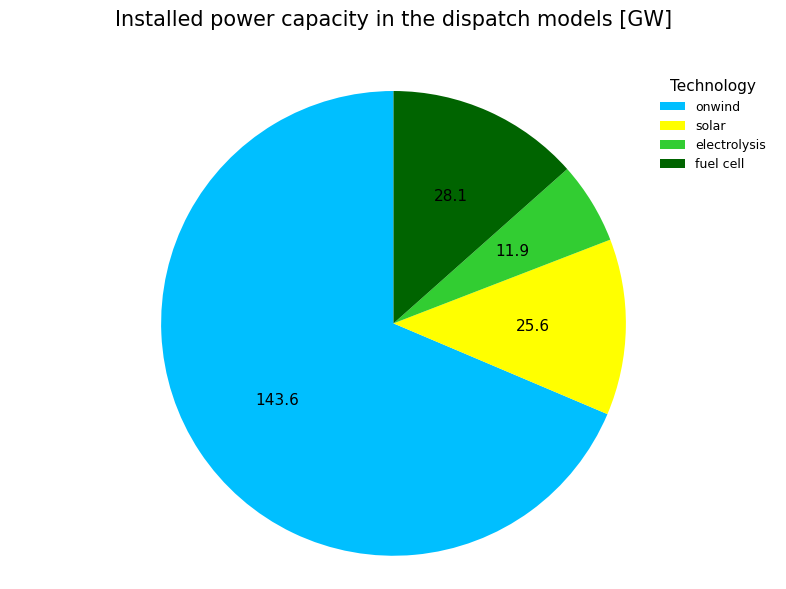

In [19]:
# convert fuel cell capacities to electricit capacity (efficiency 50%) 
opt_capacities_half_fc_df = opt_capacities_df.copy()
opt_capacities_half_fc_df["fuel cell"] = opt_capacities_half_fc_df["fuel cell"] / 2

plot_capacity_mix_pie(
    opt_capacities_half_fc_df,
    stat="mean",
    plot_title="Installed power capacity in the dispatch models [GW]",
    show="values",     # percent or values
    colors=carrier_colors,
    save_plots=False
)

#### --- Stacked power capacities

c:\Users\jonat\OneDrive - Danmarks Tekniske Universitet\Skrivebord\Speciale\Master-Thesis-Jonathan-Gadfelt\functions_plots.py:1622: FutureWarning:

DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.



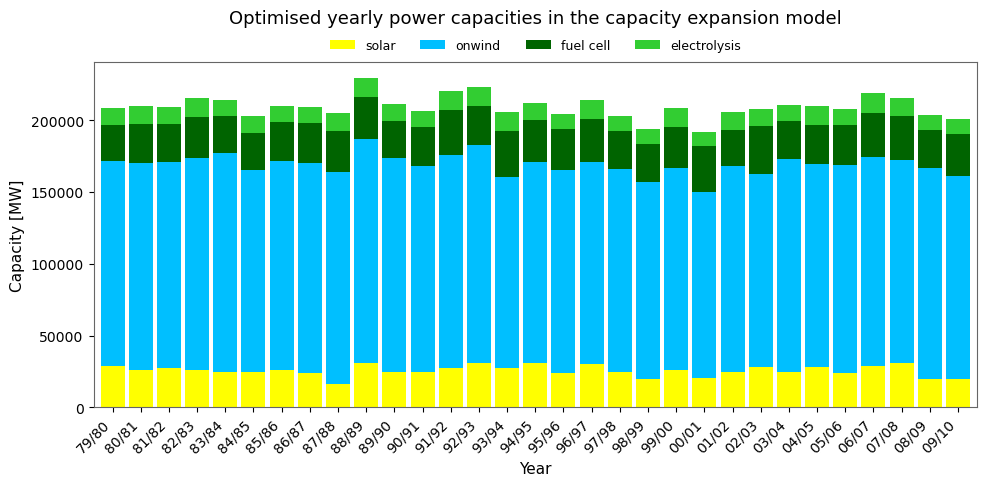

<Axes: title={'center': 'Optimised yearly power capacities in the capacity expansion model'}, xlabel='Year', ylabel='Capacity [MW]'>

In [20]:
results_exp_half_fc = results_exp.copy()
results_exp_half_fc[("links", "fuel cell")] = results_exp_half_fc[("links", "fuel cell")] / 2

techs = ["solar", "onwind", "fuel cell", "electrolysis"]
plot_stacked_generator_capacities(
    results_exp_half_fc,
    techs,
    colors=carrier_colors,
    title = "Optimised yearly power capacities in the capacity expansion model",
    save_plots=False
)

##### ---- including the mean demand in the plot 

c:\Users\jonat\OneDrive - Danmarks Tekniske Universitet\Skrivebord\Speciale\Master-Thesis-Jonathan-Gadfelt\functions_plots.py:1688: FutureWarning:

DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.



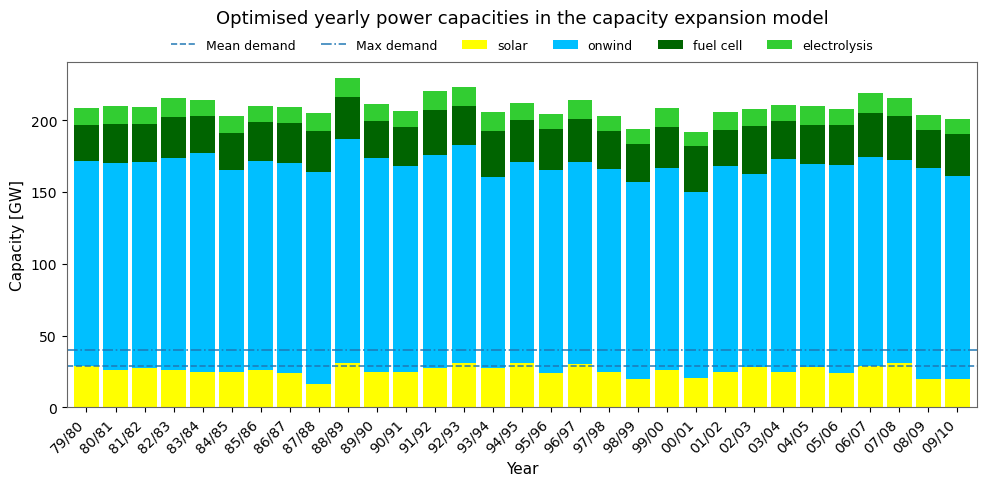

<Axes: title={'center': 'Optimised yearly power capacities in the capacity expansion model'}, xlabel='Year', ylabel='Capacity [GW]'>

In [34]:
demand = networks_exp_base[2005].loads_t.p_set['load']
results_exp_half_fc = results_exp.copy()
results_exp_half_fc[("links", "fuel cell")] = results_exp_half_fc[("links", "fuel cell")] / 2
de_stats = demand.describe(percentiles=[0.25, 0.50, 0.85])

techs = ["solar", "onwind", "fuel cell", "electrolysis"]

plot_stacked_generator_capacities_w_demand(
    results_exp_half_fc,
    techs,
    colors=carrier_colors,
    title = "Optimised yearly power capacities in the capacity expansion model",
    save_plots=False,
    stats=de_stats
)

#### --- Capacities pr generator

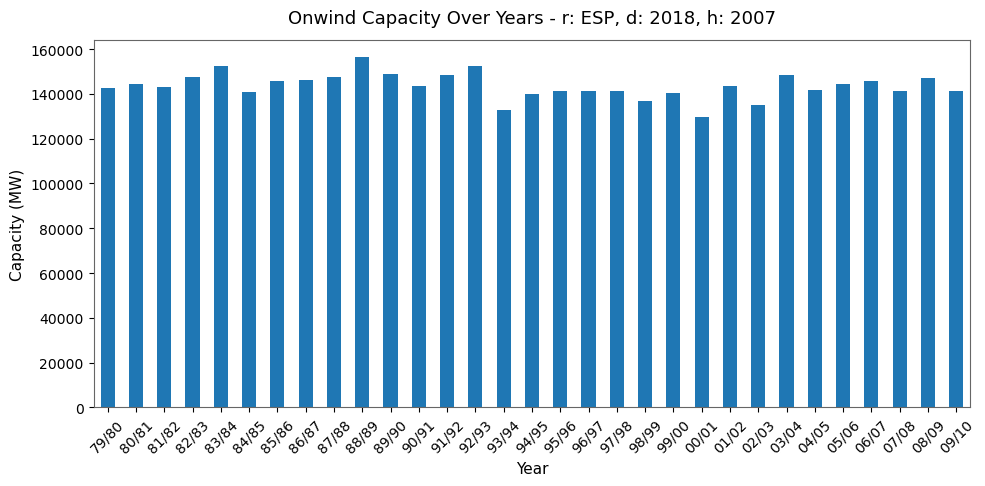

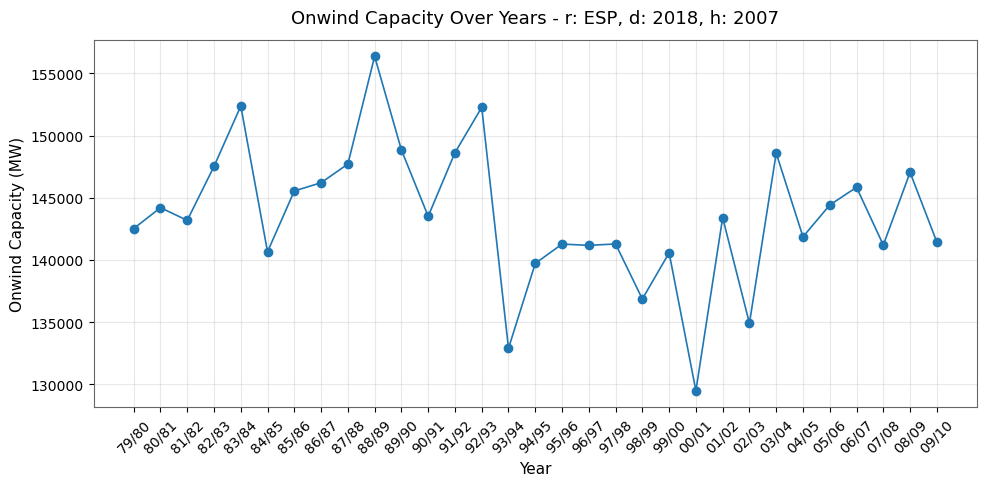

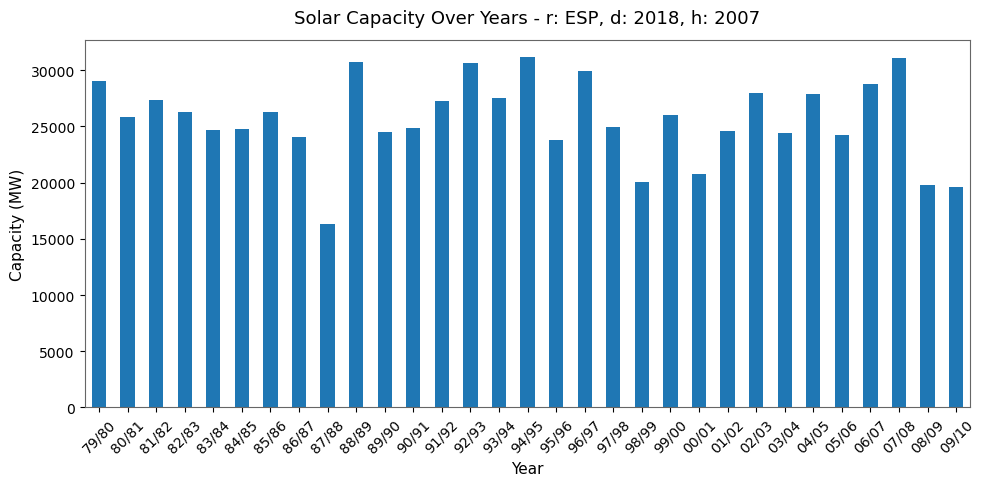

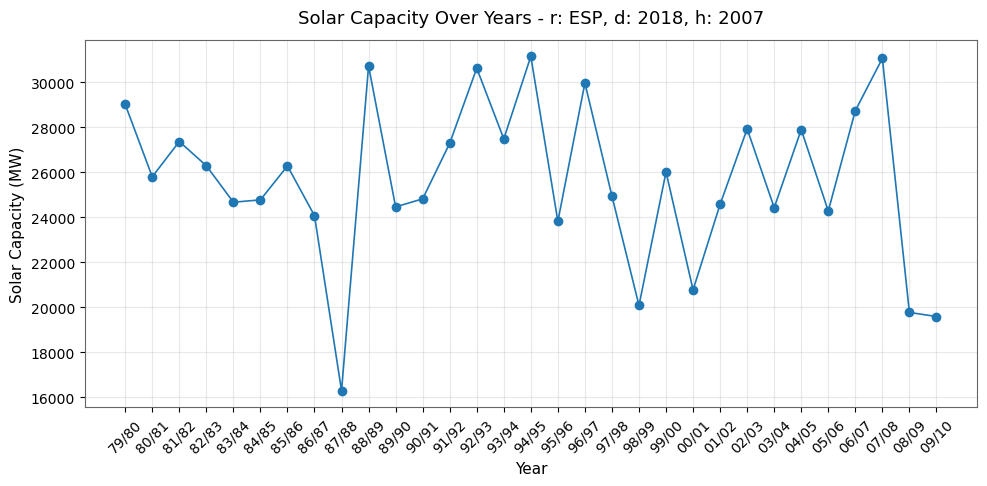

In [35]:
plot_generator_capacity(results_exp, "onwind", 'generators', region, d_year_exp, h_year_exp)
plot_generator_capacity(results_exp, "solar", 'generators', region, d_year_exp, h_year_exp)

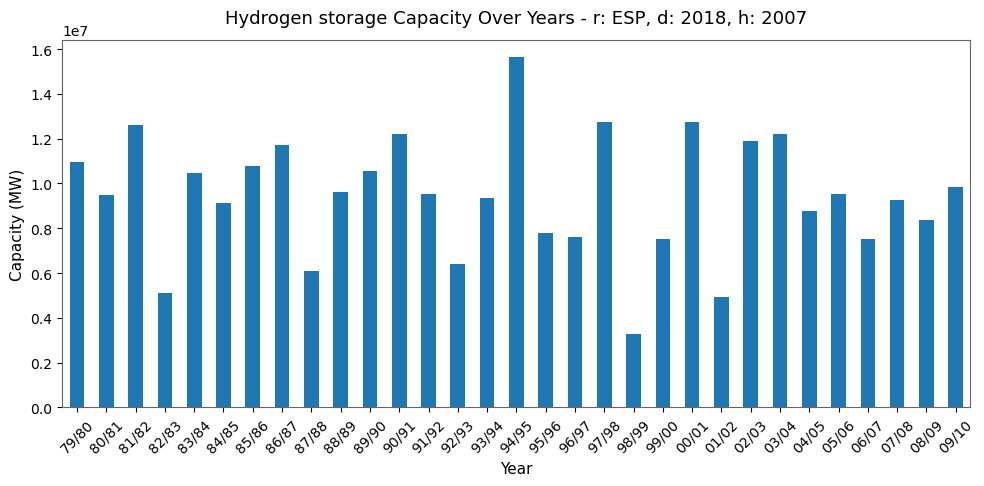

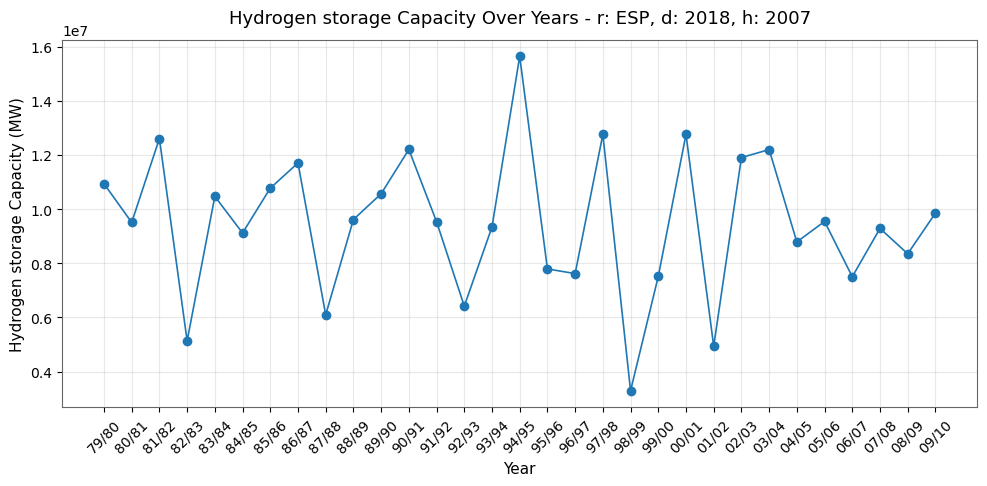

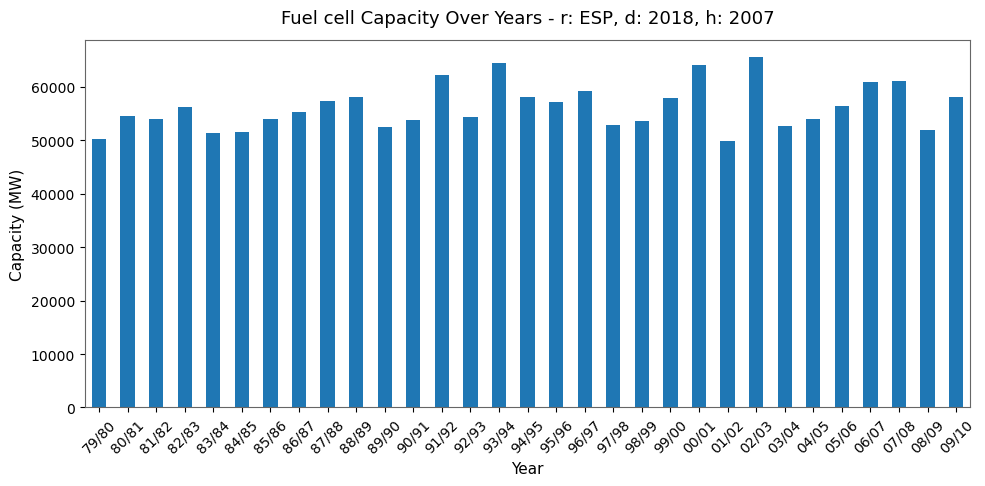

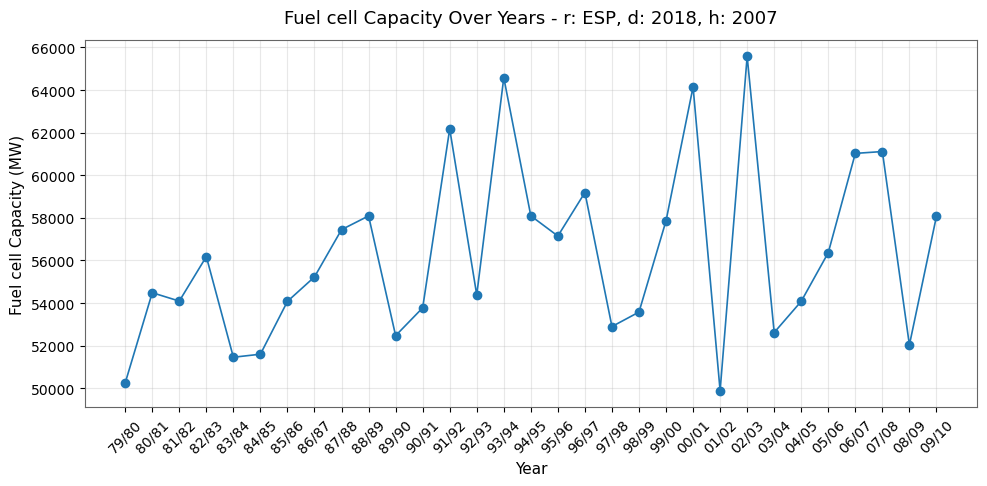

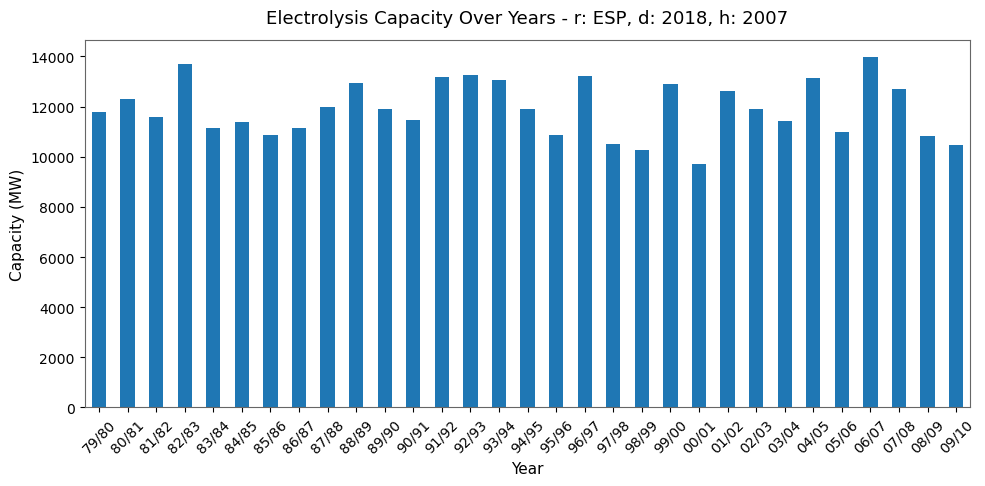

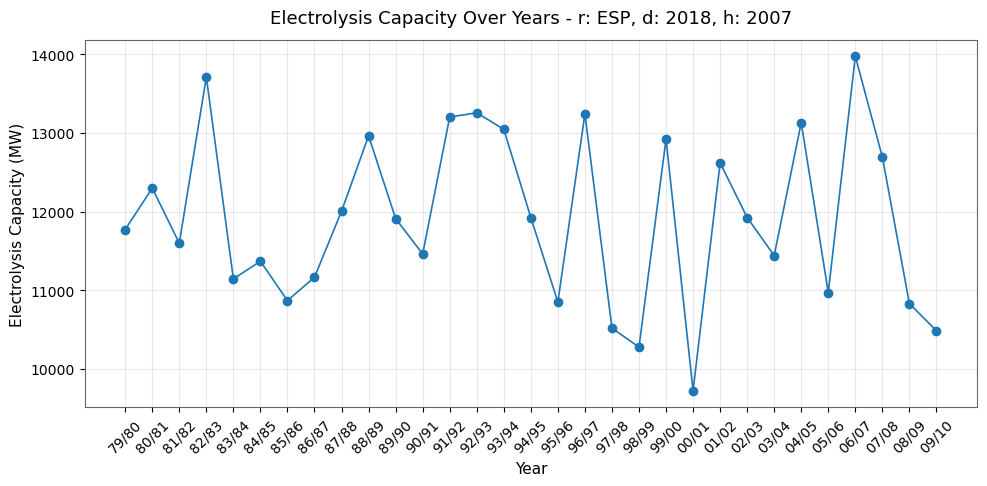

In [36]:
plot_generator_capacity(results_exp, "Hydrogen storage", 'stores', region, d_year_exp, h_year_exp)
plot_generator_capacity(results_exp, "fuel cell", 'links', region, d_year_exp, h_year_exp)
plot_generator_capacity(results_exp, "electrolysis", 'links', region, d_year_exp, h_year_exp)

## - Price formation

### -- Mean prices 


In [37]:
mean_price = []
for i in range(len(weather_years)-1):
    net = networks_exp_base[weather_years[i]]
    mean_price.append(net.buses_t.marginal_price["electricity bus"].mean())
print("mean of mean prices over years:", np.mean(mean_price))
mean_price

mean of mean prices over years: 98.6838146509904


[100.31221247158793,
 97.03534878128033,
 101.06285454344005,
 98.37399427055254,
 102.6500446392553,
 98.32644663029055,
 100.35161187942381,
 101.34894758473322,
 95.0484276104379,
 102.82748434735991,
 100.88712418178307,
 99.45171724178206,
 101.13757875732786,
 98.35446292605867,
 99.12373518242434,
 103.59194600227252,
 96.58259438610068,
 98.57364948030263,
 98.46512632289205,
 89.60529981368317,
 99.67199908827966,
 96.05089380845442,
 94.29333568257357,
 100.86550254408222,
 101.80067532616165,
 97.41591387966493,
 93.22720834958075,
 99.27180453981016,
 100.86159259583103,
 93.94490666228502]

In [38]:
# alternativ udregning
marginal_prices = []
for i in range(len(weather_years)-1):
    net = networks_exp_base[weather_years[i]]
    marginal_prices.append(net.buses_t.marginal_price["electricity bus"])
print("mean of prices over years:", round(np.mean(marginal_prices), 2))


mean of prices over years: 98.68


### -- Margial prices overview 

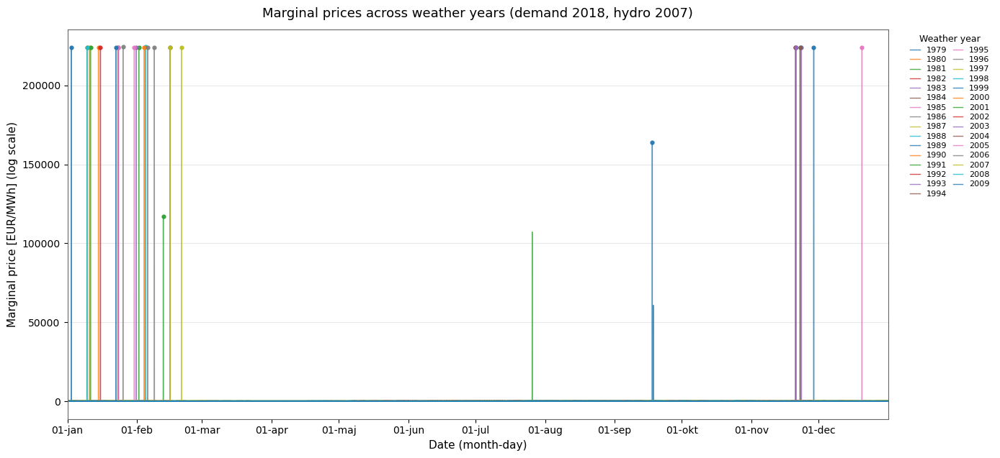

In [39]:
max_MP_list = []
max_MP_time_list = []

selected_network = networks_exp_base

fig, ax = plt.subplots(figsize=(14, 6.5))

for year in weather_years:
    if year not in selected_network:
        continue

    net = selected_network[year]
    price = net.buses_t.marginal_price["electricity bus"]

    x = price.index.map(lambda ts: pd.Timestamp(2000, ts.month, ts.day, ts.hour))

    ax.plot(x, price.values, label=str(year), linewidth=1.0, alpha=0.8)

    max_idx = int(price.values.argmax())
    max_val = float(price.values[max_idx])
    max_time = x[max_idx]

    max_MP_list.append(max_val)
    max_MP_time_list.append(max_time.strftime("%d-%b %H:%M"))

    ax.plot(
        max_time,
        max_val,
        marker="o",
        markersize=3.5,
        linestyle="None",
        color=ax.lines[-1].get_color(),
        alpha=0.9,
    )

ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter("%d-%b"))
ax.set_xlim(pd.Timestamp(2000, 1, 1), pd.Timestamp(2000, 12, 31, 23))

ax.set_xlabel("Date (month-day)")
ax.set_ylabel("Marginal price [EUR/MWh] (log scale)")

ax.grid(True, axis="y", alpha=0.3)
ax.grid(False, axis="x")

ax.set_title(
    f"Marginal prices across weather years (demand {d_year_exp}, hydro {h_year_exp})"
)

ax.legend(
    title="Weather year",
    bbox_to_anchor=(1.02, 1),
    loc="upper left",
    ncol=2,
    fontsize=8,
    title_fontsize=9,
    handlelength=1.2,
    columnspacing=0.8,
    labelspacing=0.3,
    borderaxespad=0.3,
    frameon=False,
)

fig.tight_layout()

if save_plots:
    plt.savefig(
        Figures_results_path / f"exp_marginal_prices_d{d_year_exp}_{Test_name_exp}.pdf",
        bbox_inches="tight",
    )

plt.show()


In [40]:
np.unique(np.round(max_MP_list))

array([117026., 163759., 223940., 223942., 223946., 223965., 223983.,
       224002., 224003., 224005., 224022., 224031., 224036., 224061.,
       224148., 224239., 224241., 224253., 224254., 224257., 224258.,
       224270., 224272., 224362., 224374.])

In [41]:
max(np.unique(np.round(max_MP_list)))

224374.0

In [42]:
np.mean(np.unique(np.round(max_MP_list))[2:])

224124.52173913043

#### --- counting marginal price occurrences

In [43]:
count_unique_prices(networks_exp_base[1997])

electricity bus
1.43         4741
21.39        1114
44.31           1
68.83        1047
87.91           1
114.06        573
366.92       1282
224004.67       1
Name: count, dtype: int64

### -- Price duration curves

(<Figure size 700x500 with 1 Axes>,
 <Axes: title={'center': 'Price duration curves – Limited foresight'}, xlabel='Fraction of Time [%]', ylabel='Price [€/MWh]'>)

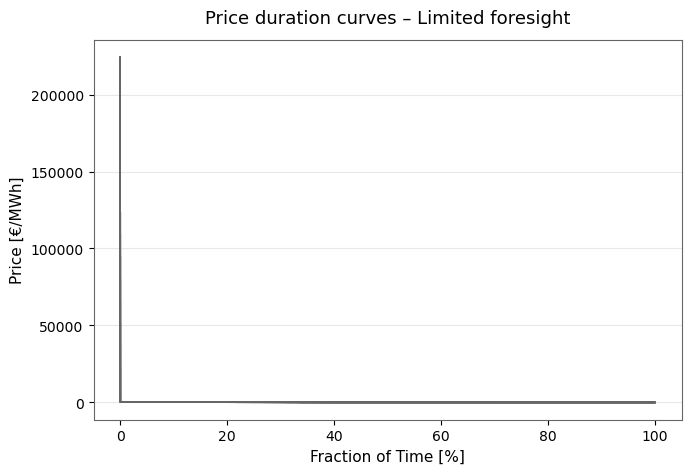

In [44]:
#save_plots = False

plot_price_duration_curves_all_years_new(
    networks_exp_base,
    weather_years,
    title="Price duration curves – Limited foresight",
    log_y=False,
    alpha=0.5,
    linewidth=1.0,
    save=False,
    save_path=Figures_results_path,
    save_name=f"PDC_all_years_EXP_{Test_name_exp}.pdf",
)

(<Figure size 600x450 with 1 Axes>,
 <Axes: title={'center': 'Price duration curves pr year - Capacity expansion'}, xlabel='Fraction of Time [%]', ylabel='Price [€/MWh] (log scale)'>)

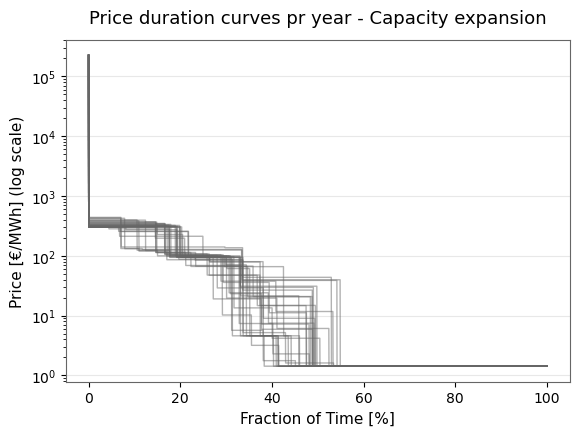

In [45]:
#save_plots = False

plot_price_duration_curves_all_years_new(
    networks_exp_base,
    weather_years,
    title="Price duration curves pr year - Capacity expansion",
    log_y=True,
    alpha=0.5,
    linewidth=1.0,
    save=save_plots,
    save_path=Figures_results_path,
    save_name=f"PDC_all_years_EXP_log_{Test_name_exp}.pdf",
    figure_size=(6,4.5),
)

(<Figure size 600x450 with 1 Axes>,
 <Axes: title={'center': 'Price duration curves pr year - Capacity expansion (clipped at 500)'}, xlabel='Fraction of Time [%]', ylabel='Price [€/MWh]'>)

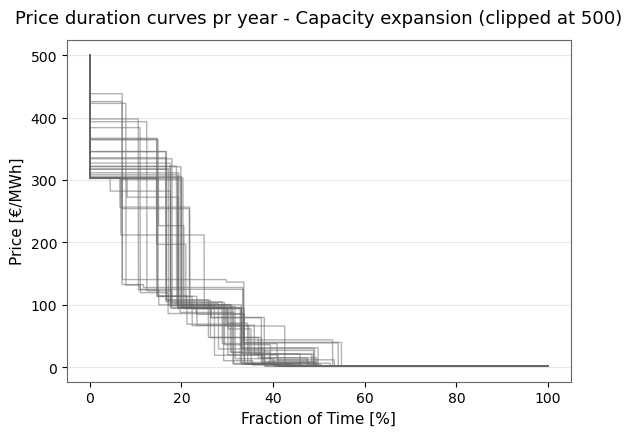

In [46]:
plot_price_duration_curves_all_years_new(
    networks_exp_base,
    weather_years,
    title="Price duration curves pr year - Capacity expansion (clipped at 500)",
    log_y=False,
    alpha=0.5,
    linewidth=1.0,
    clip_upper=500,
    save=save_plots,
    save_path=Figures_results_path,
    save_name=f"PDC_all_years_EXP_clipped_{Test_name_exp}.pdf",
    figure_size=(6,4.5),
)

#### --- old

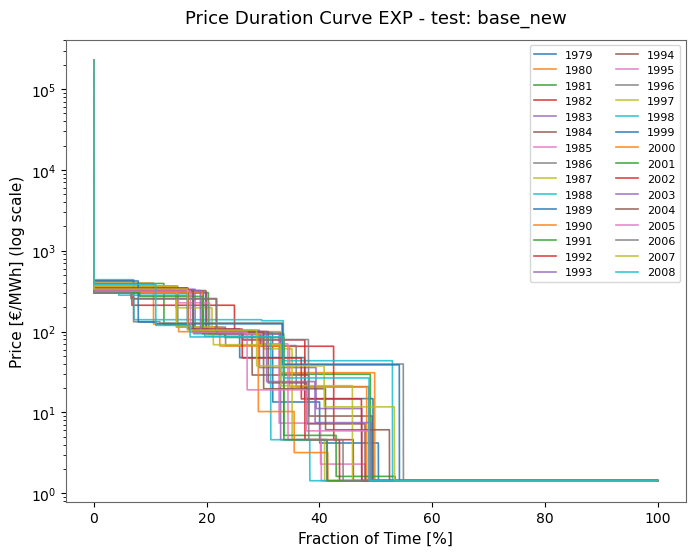

In [47]:
# All in one plot
fig, ax = plt.subplots(figsize=(8, 6))
for i in weather_years[:-1]:
    # if i == 2002: # Skip problematic year to better see general trend
    #     continue
    get_price_duration(networks_exp_base[i]).plot(
        ax=ax,
        ylabel="Price [€/MWh]",
        xlabel="Fraction of Time [%]",
        label=f"{i}",
        legend=True,
        alpha=0.85
    )
Model_run = f"test: {Test_name_exp}"
ax.set_yscale("log")
ax.set_ylabel("Price [€/MWh] (log scale)")
ax.set_title("Price Duration Curve EXP - "+ Model_run)
ax.legend(loc='best',ncol=2, fontsize=8)

if save_plots:
    fig.savefig(FIGURES_DIR / f"PDC_all_years_EXP_{Test_name_exp}.pdf", bbox_inches='tight')

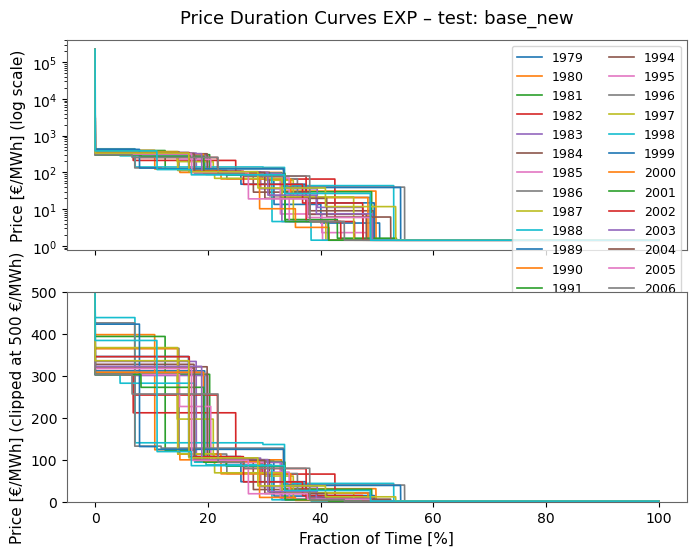

In [48]:
# DOUBLE PDC PLOT LOG AND CLIPPED 
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(8, 6), sharex=True)
price_lim_2 = 500  # upper limit for second plot
for i in weather_years[:-1]:
    pdc = get_price_duration(networks_exp_base[i])
    pdc.plot(ax=ax1, label=str(i))
    pdc.clip(upper=price_lim_2).plot(ax=ax2)

ax1.set_yscale("log")
ax1.set_ylabel("Price [€/MWh] (log scale)")
ax1.set_title(f"Price Duration Curves EXP – {Model_run}")

ax2.set_ylabel(f"Price [€/MWh] (clipped at {price_lim_2} €/MWh)")
ax2.set_xlabel("Fraction of Time [%]")
ax2.set_ylim(0, price_lim_2)

ax1.legend(ncol=2)

### -- Marginal storage value

In [49]:
mean_MSV_yearly = []
for net in networks_exp_base.values():
    mean_MSV_yearly.append(net.buses_t.marginal_price["hydrogen bus"].mean())
print(f"Mean of mean MSV for all years (with d_year: {d_year_exp}): {np.mean(mean_MSV_yearly):.2f}")

# now the mean median
median_MSV_yearly = []
for net in networks_exp_base.values():
    median_MSV_yearly.append(net.buses_t.marginal_price["hydrogen bus"].median())
print(f"Mean of MSV median for all years (with d_year: {d_year_exp}): {np.mean(median_MSV_yearly):.2f}")

Mean of mean MSV for all years (with d_year: 2018): 85.50
Mean of MSV median for all years (with d_year: 2018): 90.12


In [50]:
print("min mean MSV", min(mean_MSV_yearly))
print("max mean MSV", max(mean_MSV_yearly))

min mean MSV 81.00359782574306
max mean MSV 89.2229550875653


In [51]:
# charging and dicharging price bid of the electrolyzer and fuel cell
MSV = 85.5

charge_eff = Cost.costs.at['electrolysis', 'efficiency']
discharge_eff = Cost.costs.at['fuel cell', 'efficiency']

bid_charge = MSV * charge_eff
bid_discharge = MSV / discharge_eff

print(f"Electrolyzer bid price for charging: {bid_charge:.2f} EUR/MWh")
print(f"Fuel cell bid price for discharging: {bid_discharge:.2f} EUR/MWh")

Electrolyzer bid price for charging: 53.16 EUR/MWh
Fuel cell bid price for discharging: 171.00 EUR/MWh


#### --- analysing price of the storage in the perfect foresight model. 

In [52]:
#charging bid to avoid LS
(10000*discharge_eff)*charge_eff

3108.5

In [53]:
count_unique_prices(networks_pf_base[1997])

electricity bus
1.43        5993
4.60        1159
3108.50      529
10000.00    1079
Name: count, dtype: int64

### -- Table for report 

In [54]:
# Summary table for capacity expansion model results
years_list = sorted(networks_exp_base.keys())

summary_data = []
for year in years_list:
    net = networks_exp_base[year]
    mean_msv = net.buses_t.marginal_price["hydrogen bus"].mean()
    mean_shadow_price = net.buses_t.marginal_price["electricity bus"].mean()
    objective_meur = round(net.objective / 1e6, 2)
    
    summary_data.append({
        'Year': f"{year % 100:02d}/{(year + 1) % 100:02d}",
        'Mean MSV': mean_msv,
        'Mean Shadow Price': mean_shadow_price,
        'Objective': objective_meur
    })

summary_df = pd.DataFrame(summary_data)
summary_df = summary_df.set_index('Year')

# Display with 2 decimal places
summary_df_display = summary_df.copy()
summary_df_display['Mean MSV'] = summary_df_display['Mean MSV'].round(2)
summary_df_display['Mean Shadow Price'] = summary_df_display['Mean Shadow Price'].round(2)

summary_df_display
units = pd.Series(
    ["[EUR/MWh]", "[EUR/MWh]", "[MEUR]"],
    index=summary_df_display.columns,
    name="Unit"
)

summary_df_display = pd.concat(
    [units.to_frame().T, summary_df_display]
)
print(df_to_latex_table(
    df = summary_df_display,
    caption="Summary of key results from the capacity expansion model across weather years.", 
    label="tab:exp_summary_results", 
    ))

\begin{table}[ht]
\centering
\small
\caption{Summary of key results from the capacity expansion model across weather years.}
\label{tab:exp_summary_results}
\begin{threeparttable}
\begin{tabular}{llll}
\toprule
 & Mean MSV & Mean Shadow Price & Objective \\
\midrule
Unit & [EUR/MWh] & [EUR/MWh] & [MEUR] \\
79/80 & 86.46 & 100.31 & 25817.23 \\
80/81 & 83.04 & 97.04 & 26189.19 \\
81/82 & 85.75 & 101.06 & 26447.49 \\
82/83 & 86.22 & 98.37 & 26355.10 \\
83/84 & 88.17 & 102.65 & 26549.72 \\
84/85 & 84.79 & 98.33 & 25220.90 \\
85/86 & 86.58 & 100.35 & 26219.96 \\
86/87 & 87.01 & 101.35 & 26502.24 \\
87/88 & 83.33 & 95.05 & 25841.94 \\
88/89 & 89.22 & 102.83 & 28213.30 \\
89/90 & 86.15 & 100.89 & 26455.27 \\
90/91 & 85.17 & 99.45 & 26235.09 \\
91/92 & 87.32 & 101.14 & 27749.39 \\
92/93 & 86.48 & 98.35 & 26951.98 \\
93/94 & 86.05 & 99.12 & 26372.66 \\
94/95 & 87.55 & 103.59 & 27242.87 \\
95/96 & 84.42 & 96.58 & 25556.39 \\
96/97 & 88.20 & 98.57 & 26512.46 \\
97/98 & 83.26 & 98.47 & 25818.63 \\

## - Cost recovery analysis

In [55]:
df_cost_recovery = calculate_cost_recovery(networks_exp_base[1995])
df_cost_recovery

# print(df_to_latex_table(
#     df_cost_recovery, 
#     index=False,
#     caption="Cost recovery for all components in the EXP model for weather year 1995.",
#     label="tab:exp_cost_recovery_1995",
#     float_fmt = lambda x: f"{x:,.1f}"),
#     )

,Model,name,carrier,revenue [MEUR],variable cost [MEUR],capital cost [MEUR],total cost [MEUR],profit [MEUR],cost recovery [-]
0,exp,onwind,onwind,14726.485,366.769,14359.716,14726.485,0.0,1.0
1,exp,solar,solar,1223.197,0.356,1222.841,1223.197,-0.0,1.0
2,exp,electrolysis,electrolysis,2680.553,633.280,2047.273,2680.553,0.0,1.0
3,exp,fuel cell,fuel cell,10239.988,3841.350,6398.638,10239.988,0.0,1.0
4,exp,Hydrogen storage,Hydrogen storage,3841.350,2680.553,1160.797,3841.350,0.0,1.0


## - SOC across the years

### -- Load old networks (jan-dec configuration)

In [56]:
plot_init_store_SOC = False
if plot_init_store_SOC:    
    test_name_exp_old = "base_h2_cyclic_FC_C"

    folder_exp_old = f"N_EXP_d_{d_year_exp}_{test_name_exp_old}"
    networks_exp_old = load_networks(folder_name = folder_exp_old, weather_years = weather_years)

### -- Plots 

In [57]:
if plot_init_store_SOC:
    # original resolution
    plot_h2_soc_all_years(networks_exp_old, carrier="hydrogen storage", mode="standard", figure_size=(10,6)) #, save_name="yearly_h2_soc_exp_standard.pdf")

    # weekly average
    plot_h2_soc_all_years(networks_exp_old, carrier="hydrogen storage", mode="weekly", figure_size=(10,5))

    # monthly average
    plot_h2_soc_all_years(networks_exp_old, carrier="hydrogen storage", mode="monthly", title="Monthly Avg. H2 Storage SOC in the capacity expansion model (calendar year)", figure_size=(10,5))#, save_name="yearly_h2_soc_exp_monthly_avg.pdf")

### -- Analysing SOC at specific dates 

In [58]:
h2_SOC_on_date(networks_exp_base, "06-01", threshold_full=0.65)


Hydrogen SOC statistics for 06-01:
Years included:                 31
Mean SOC:                     0.801
Median SOC:                   0.808
P25 SOC:                      0.729
P50 SOC:                      0.808
P90 SOC:                      0.957
Min SOC:                      0.366
Max SOC:                      1.000
Share SOC > 0.65:        0.867


{'date': '06-01',
 'mean_soc': 0.800645886692312,
 'median_soc': 0.8078806709479276,
 'p25': 0.7293593243917081,
 'p50': 0.8078806709479276,
 'p90': 0.9566335906661028,
 'min_soc': 0.3661173909585804,
 'max_soc': 1.0,
 'share_soc_above_threshold': 0.8669354838709677,
 'years_count': 31}

In [59]:
h2_SOC_on_date(networks_exp_base, "07-01", threshold_full=0.65)



Hydrogen SOC statistics for 07-01:
Years included:                 31
Mean SOC:                     0.787
Median SOC:                   0.812
P25 SOC:                      0.722
P50 SOC:                      0.812
P90 SOC:                      0.915
Min SOC:                      0.455
Max SOC:                      0.960
Share SOC > 0.65:        0.828


{'date': '07-01',
 'mean_soc': 0.7871938430585943,
 'median_soc': 0.8120078751732365,
 'p25': 0.7220527863403552,
 'p50': 0.8120078751732365,
 'p90': 0.9146276416679772,
 'min_soc': 0.4549794291182695,
 'max_soc': 0.9600873652453593,
 'share_soc_above_threshold': 0.8279569892473119,
 'years_count': 31}

# Results Dispatch models

## - Cost and objective value tables

In [60]:
results_df = build_cost_objective_comparison_df(weather_years, networks_pf_base, networks_rh_base)
results_df

,Diff cost_MEUR,Diff_obj_MEUR,Objective PF value MEUR,Objective RH value MEUR,PF_cost_MEUR,PF_load_shedding_cost_MEUR,RH_cost_MEUR,RH_load_shedding_cost_MEUR
year,,,,,,,,
1979,-413786.0,13968.78,9169.56,23138.34,580339.0,8803.4,166553.0,23015.2
1980,-802099.9,4439.36,8758.26,13197.62,883025.6,8391.8,80925.7,12908.4
1981,-243704.6,-42.77,16524.60,16481.83,351385.7,16163.1,107681.1,16163.1
1982,-658836.4,8635.64,16468.16,25103.80,899270.7,16101.1,240434.3,24887.0
1983,-640392.2,9167.19,26509.73,35676.92,923015.4,26143.8,282623.2,35470.5
1984,13154.3,-114.06,365.67,251.61,566.6,0.0,13720.9,0.0
1985,-374792.6,16295.40,8019.35,24314.75,492402.7,7653.8,117610.1,24232.7
1986,-319819.6,-216.68,12680.51,12463.83,435594.4,12317.1,115774.7,12317.1
1987,12582.2,-138.83,381.58,242.75,1358.2,13.2,13940.4,13.2


## - Plots

### -- Random Dispatch plots 

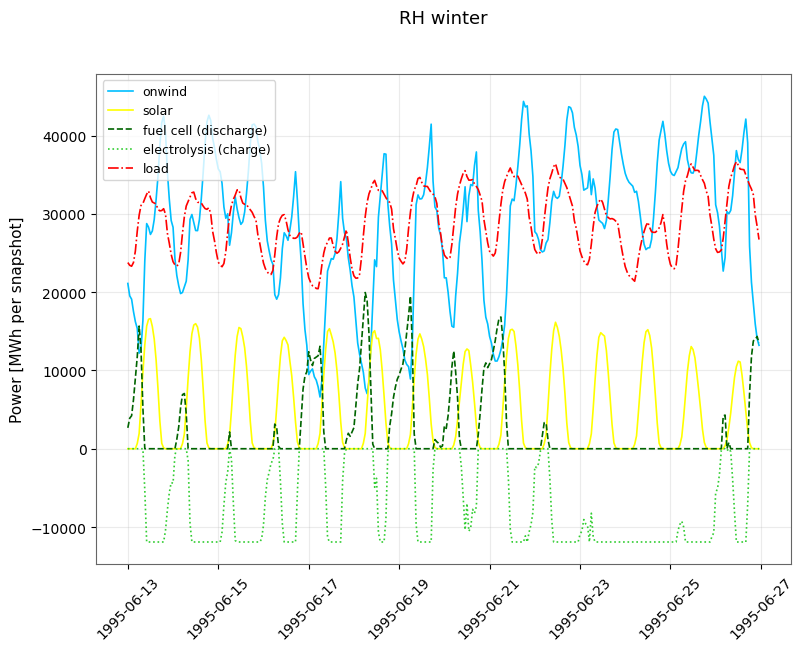

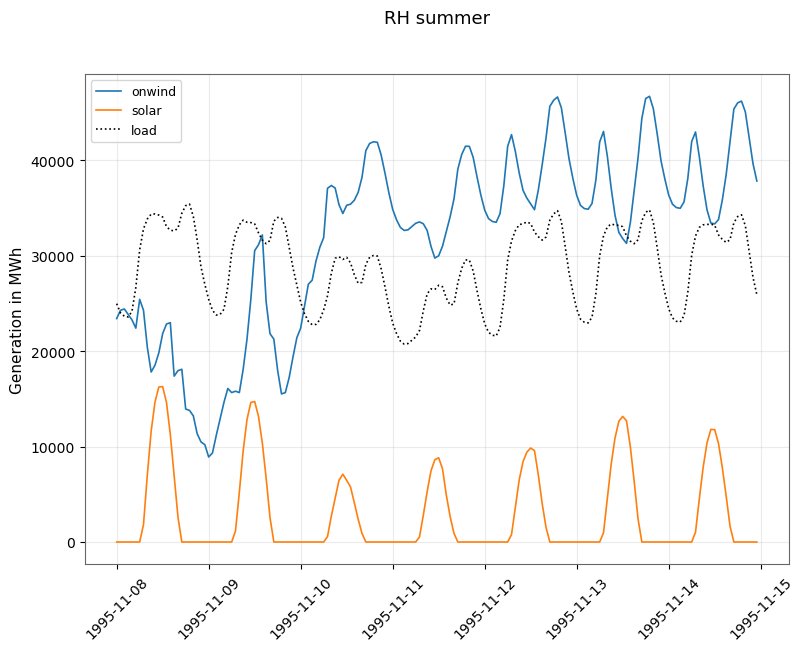

In [61]:
#plot_dispatch_elec_h2(networks_pf_base[1995], start_hour=24*12, duration_hours=24*14, title="PF winter")
plot_dispatch_elec_h2(networks_rh_base[1995], start_hour=24*12, duration_hours=24*14, title="RH winter")
#plot_dispatch(networks_pf_base[1995], start_hour=24*160, duration_hours=24*7, title="PF summer")
plot_dispatch(networks_rh_base[1995], start_hour=24*160, duration_hours=24*7, title="RH summer")

### -- Price duration curves

#### --- Base case 

(<Figure size 600x450 with 1 Axes>,
 <Axes: title={'center': 'Price duration curve pr year - Perfect foresight vs Limited foresight'}, xlabel='Fraction of Time [%]', ylabel='Price [€/MWh]'>)

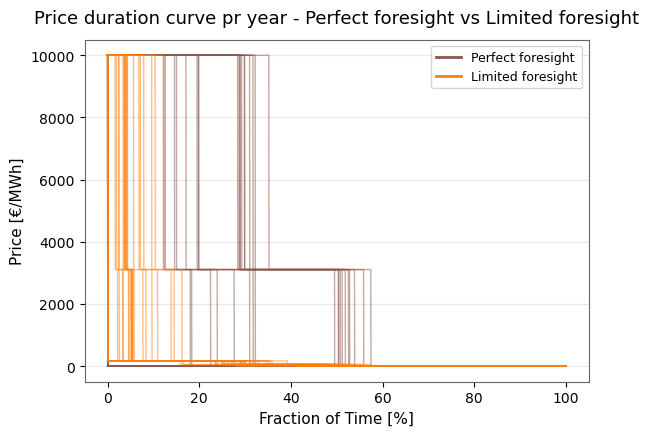

In [62]:
plot_price_duration_curves_two_models(
    networks_a=networks_pf_base,
    networks_b=networks_rh_base,
    weather_years=weather_years,
    label_a="Perfect foresight",
    label_b="Limited foresight",
    title="Price duration curve pr year - Perfect foresight vs Limited foresight",
    log_y=False,
    color_a="tab:brown",
    color_b="tab:orange",
    alpha=0.5,
    linewidth = 1,
    save=save_plots,
    save_path=Figures_results_path,
    save_name=f"PDC_dispatch_models_all_years_{Test_name_dispatch}.pdf",
    figure_size=(6,4.5)
)

(<Figure size 700x500 with 1 Axes>,
 <Axes: title={'center': 'Price duration curve pr year - Perfect foresight vs Limited foresight'}, xlabel='Fraction of Time [%]', ylabel='Price [€/MWh]'>)

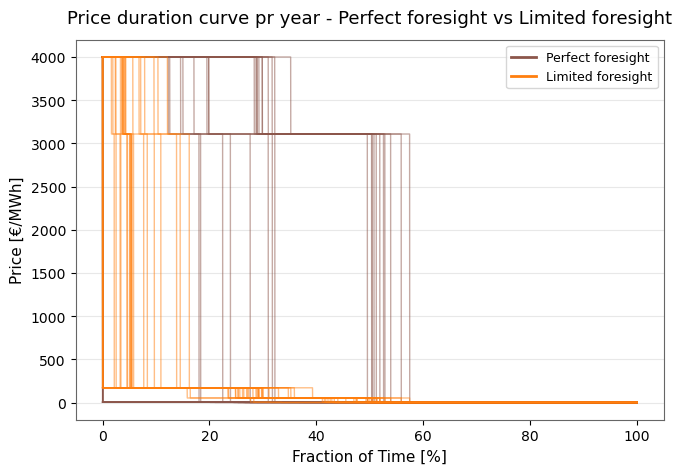

In [63]:
plot_price_duration_curves_two_models(
    networks_a=networks_pf_base,
    networks_b=networks_rh_base,
    weather_years=weather_years,
    label_a="Perfect foresight",
    label_b="Limited foresight",
    title="Price duration curve pr year - Perfect foresight vs Limited foresight",
    log_y=False,
    clip_upper=4000,
    color_a="tab:brown",
    color_b="tab:orange",
    alpha=0.5,
    linewidth = 1,
    save=False,
    save_path=Figures_results_path,
    save_name=f"PDC_dispatch_models_all_years_{Test_name_dispatch}.pdf",
)

(<Figure size 700x500 with 1 Axes>,
 <Axes: title={'center': 'Price duration curves – Perfect foresight'}, xlabel='Fraction of Time [%]', ylabel='Price [€/MWh]'>)

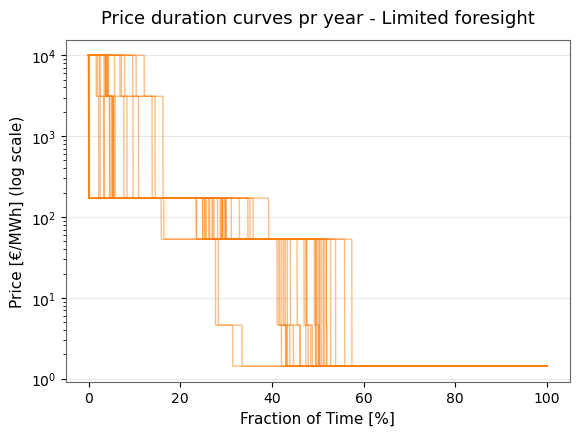

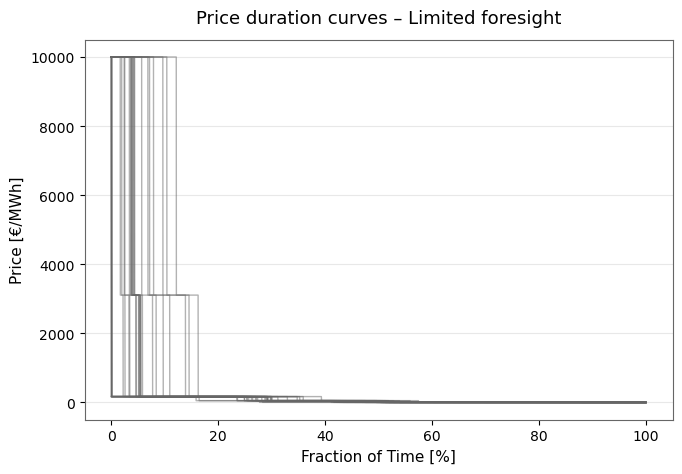

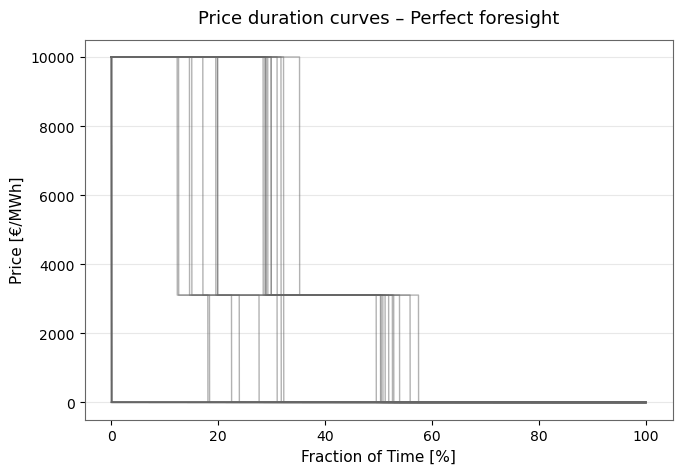

In [64]:
plot_price_duration_curves_all_years_new(
    networks_rh_base,
    weather_years,
    title="Price duration curves pr year - Limited foresight",
    log_y=True,
    alpha=0.5,
    linewidth=1.0,
    save=save_plots,
    color = "tab:orange",
    save_path=Figures_results_path,
    save_name=f"PDC_RH_all_years_log_{Test_name_dispatch}.pdf",
    figure_size=(6,4.5)
)

plot_price_duration_curves_all_years_new(
    networks_rh_base,
    weather_years,
    title="Price duration curves – Limited foresight",
    log_y=False,
    alpha=0.5,
    linewidth=1.0,
    save=False,
    save_path=Figures_results_path,
    save_name=f"PDC_RH_all_years_{Test_name_dispatch}.pdf",
)
plot_price_duration_curves_all_years_new(
    networks_pf_base,
    weather_years,
    title="Price duration curves – Perfect foresight",
    log_y=False,
    alpha=0.5,
    linewidth=1.0,
    save=False,
    save_path=Figures_results_path,
    save_name=f"PDC_PF_all_years_{Test_name_dispatch}.pdf",
)

# Flexible demand PWL 

## - Defining flexible demand segments

Step 1: initial a_d, b_d
seg1: d_ref=23034.80, p_ref=2000.00, eps=-0.0250  ->  a=82000.00, b=3.473006
seg2: d_ref=25914.15, p_ref=1000.00, eps=-0.3000  ->  a=4333.33, b=0.128630
seg3: d_ref=28793.50, p_ref=98.00, eps=-0.0100  ->  a=9898.00, b=0.340355

Step 2: continuity-enforced p_ref and updated a_d, b_d
seg1: D_end=23034.80, p_ref=1479.63, eps=-0.0250  ->  a=60664.81, b=2.569381
seg2: D_end=25914.15, p_ref=1079.00, eps=-0.3000  ->  a=4675.67, b=0.138792
seg3: D_end=28793.50, p_ref=98.00, eps=-0.0100  ->  a=9898.00, b=0.340355

Segment price ranges:
seg1: D ∈ [0, 23034.80] MW, price ∈ [60664.8, 1479.6]
seg2: D ∈ [23034.80, 25914.15] MW, price ∈ [1478.6, 1079.0]
seg3: D ∈ [25914.15, 28793.50] MW, price ∈ [1078.0, 98.0]

Step 3: LS intersection for seg0 at p=10000: D_ls = 19718.68 MW

Step 4: final segment parameters (demand and LS generator)

Load shedding
  interval D: [0.00, 19718.68]  width=19718.68
  a_d=10000.00, b_d=0.000000
  a_gen=10000.00, b_gen=0.000000

Segment_1
  interval

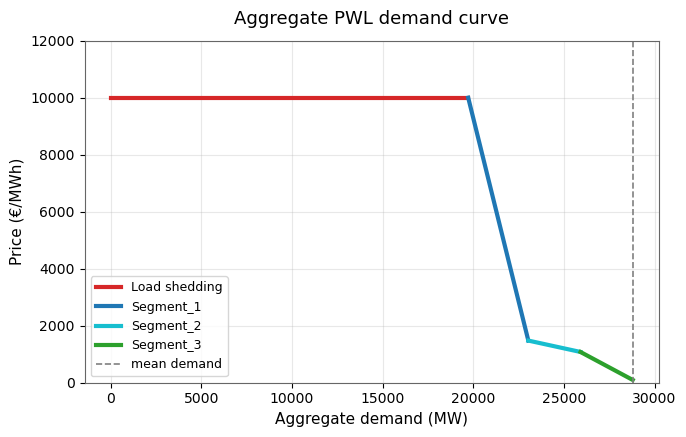


Shares (width on x-axis, % of D_base):
seg0 (LS cap): 0.68%
seg1:          0.12%
seg2:          0.10%
seg3:          0.10%

new p_ref:  [1479.62962963 1079.           98.        ]
p_nom_quantity =  [0.115, 0.1, 0.1]


In [67]:
demand = networks_exp_base[2005].loads_t.p_set['load']
D_base = round(demand.values.mean(),1)

p_ref_init = np.array([2000, 1000, 98])  
shares = np.array([0.80, 0.10, 0.10])
eps    = np.array([-0.025, -0.3, -0.01])

segments, p_ref_updated, shares_pct = build_aggregate_pwl_with_ls(
    D_base=D_base,
    shares=shares,
    p_ref_init=p_ref_init,
    eps=eps,
    p_ls=10000,
    p_terminal=98,
    price_step=1.0,
    #save_plot = True,
    file_name = "pwl_agg_demand_curve_v1"
)
print("\nnew p_ref: ",p_ref_updated)
print("p_nom_quantity = ", shares_pct[1:])

## - Plots, energy balance etc. 

### -- Price duration curves 

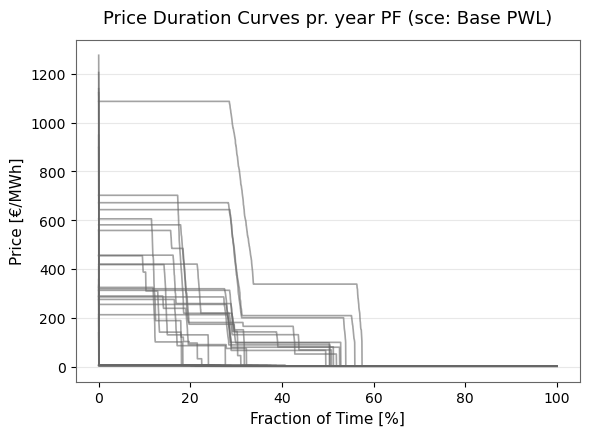

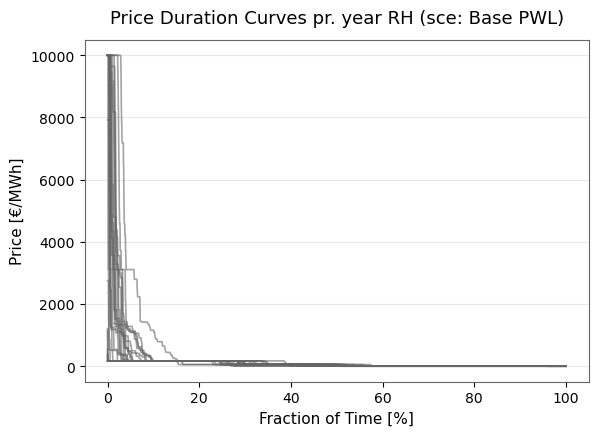

In [69]:
PWL = True
Figure_size_PDC = (6,4.5)
if PWL:
    plot_price_duration_curves_all_years_new(
        networks=networks_pf_base_PWL,
        weather_years=weather_years,
        title="Price Duration Curves pr. year PF (sce: Base PWL)",
        figure_size=Figure_size_PDC,
        save=save_plots,
        save_path=Figures_results_path,
        #save_name=f"PDC_PF_all_years_{Test_name_dispatch}.pdf",
    )

    plot_price_duration_curves_all_years_new(
        networks=networks_rh_base_PWL,
        weather_years=weather_years,
        title="Price Duration Curves pr. year RH (sce: Base PWL)",
        figure_size=Figure_size_PDC,
        save=save_plots,
        save_path=Figures_results_path,
        #save_name=f"PDC_RH_all_years_{Test_name_dispatch}.pdf",
    )

(<Figure size 600x450 with 1 Axes>,
 <Axes: title={'center': 'Price Duration Curves pr. year - Limited foresight PWL (clipped)'}, xlabel='Fraction of Time [%]', ylabel='Price [€/MWh]'>)

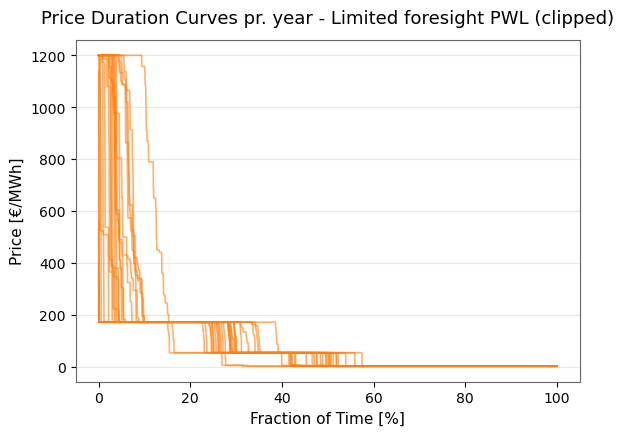

In [70]:
plot_price_duration_curves_all_years_new(
    networks=networks_rh_base_PWL,
    weather_years=weather_years,
    title="Price Duration Curves pr. year - Limited foresight PWL (clipped)",
    figure_size=Figure_size_PDC,
    color = "tab:orange",
    log_y=False,
    clip_upper=1200,
    save=save_plots,
    save_path=Figures_results_path,
    save_name=f"PDC_RH_all_years_clipped_{Test_name_dispatch_PWL}.pdf",
)

(<Figure size 600x450 with 1 Axes>,
 <Axes: title={'center': 'Price duration curve pr year - PWL - Perfect foresight vs Limited foresight'}, xlabel='Fraction of Time [%]', ylabel='Price [€/MWh]'>)

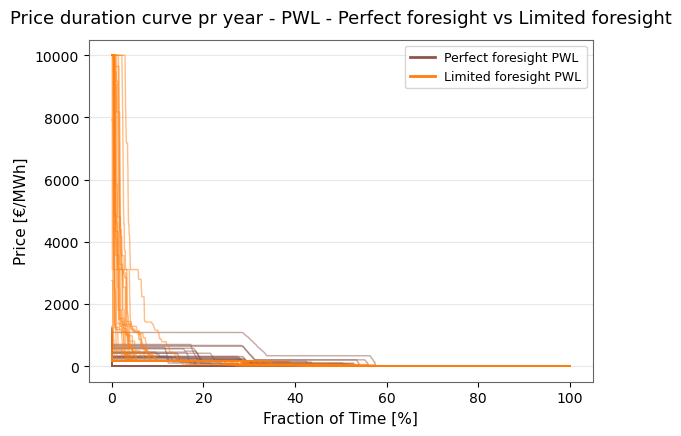

In [71]:
plot_price_duration_curves_two_models(
    networks_a=networks_pf_base_PWL,
    networks_b=networks_rh_base_PWL,
    weather_years=weather_years,
    label_a="Perfect foresight PWL",
    label_b="Limited foresight PWL",
    title="Price duration curve pr year - PWL - Perfect foresight vs Limited foresight",
    log_y=False,
    color_a="tab:brown",
    color_b="tab:orange",
    alpha=0.5,
    linewidth = 1,
    save=False,
    save_path=Figures_results_path,
    save_name=f"PDC_dispatch_models_PWL_all_years_{Test_name_dispatch}.pdf",
    figure_size=Figure_size_PDC
)

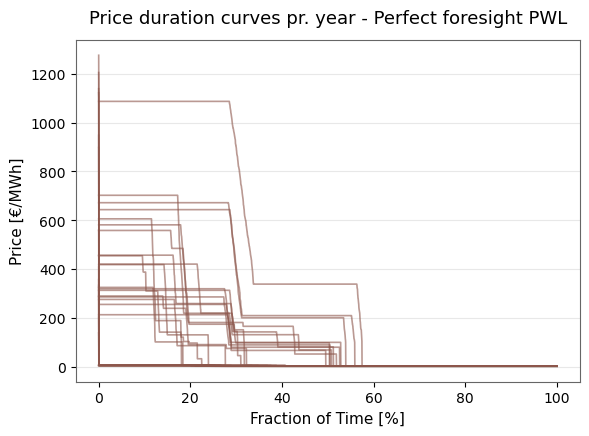

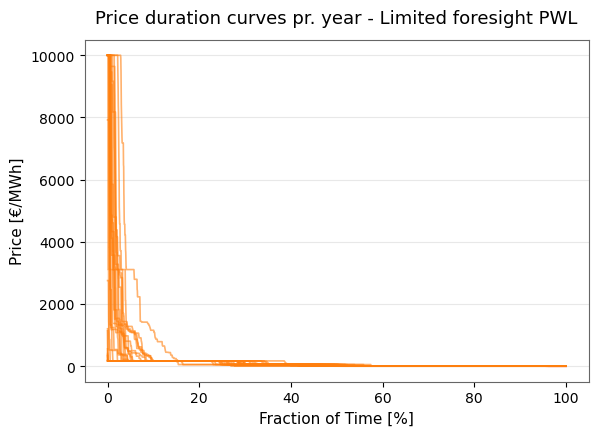

In [72]:
PWL = True
if PWL:
    plot_price_duration_curves_all_years_new(
        networks=networks_pf_base_PWL,
        weather_years=weather_years,
        title="Price duration curves pr. year - Perfect foresight PWL",
        figure_size=Figure_size_PDC,
        color = "tab:brown",
        save=save_plots,
        save_path=Figures_results_path,
        save_name=f"PDC_PF_all_years_{Test_name_dispatch_PWL}.pdf",
    )

    plot_price_duration_curves_all_years_new(
        networks=networks_rh_base_PWL,
        weather_years=weather_years,
        title="Price duration curves pr. year - Limited foresight PWL",
        figure_size=Figure_size_PDC,
        color = "tab:orange",
        log_y=False,
        save=save_plots,
        save_path=Figures_results_path,
        save_name=f"PDC_RH_all_years_{Test_name_dispatch_PWL}.pdf",
    )

### -- Energy balance

In [73]:
test_year = 1997
net = selected_networks_rh_PWL[test_year]

seg_names = [
    "elastic load shedding - segment_1",
    "elastic load shedding - segment_2",
    "elastic load shedding - segment_3",
]

seg_carriers = {
    "elastic load shedding - segment_1": "elastic demand 1",
    "elastic load shedding - segment_2": "elastic demand 2",
    "elastic load shedding - segment_3": "elastic demand 3",
}

seg_colors = {
    "elastic demand 1": "#7b3294",  # muted purple
    "elastic demand 2": "#c2a5cf",  # light lavender
    "elastic demand 3": "#008837",  # teal-green
}


# Assign new carriers to generators
net.generators.loc[seg_names, "carrier"] = [seg_carriers[n] for n in seg_names]

# Ensure carriers exist and have colors
for carrier, color in seg_colors.items():
    if carrier not in net.carriers.index:
        net.add("Carrier", carrier, color=color)
    else:
        net.carriers.loc[carrier, "color"] = color


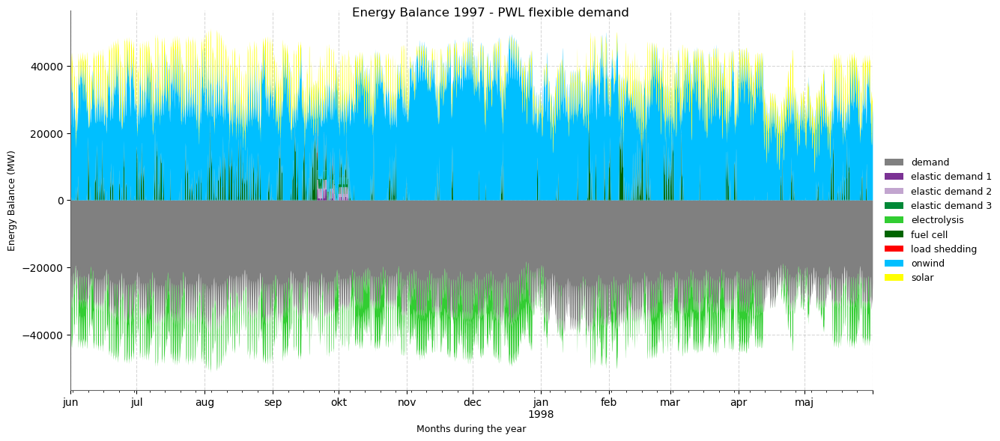

In [74]:
fig, ax, facet_col = selected_networks_rh_PWL[test_year].statistics.energy_balance.plot.area(
    linewidth=0, 
    bus_carrier="electricity",
    figsize=(12,6))
fig.suptitle(f"Energy Balance {test_year} - PWL flexible demand", fontsize=12)
ax.grid(True, alpha=0.5, linestyle="--")
ax.set_xlabel("Months during the year", fontsize=9)
ax.set_ylabel("Energy Balance (MW)", fontsize=9)

if save_plots:
    plt.savefig(
        Figures_results_path / f"energy_balance_flex_de_{Test_name_dispatch_PWL}.pdf",
        bbox_inches="tight",
    )


#### --- Dispatch plot with PWL segements

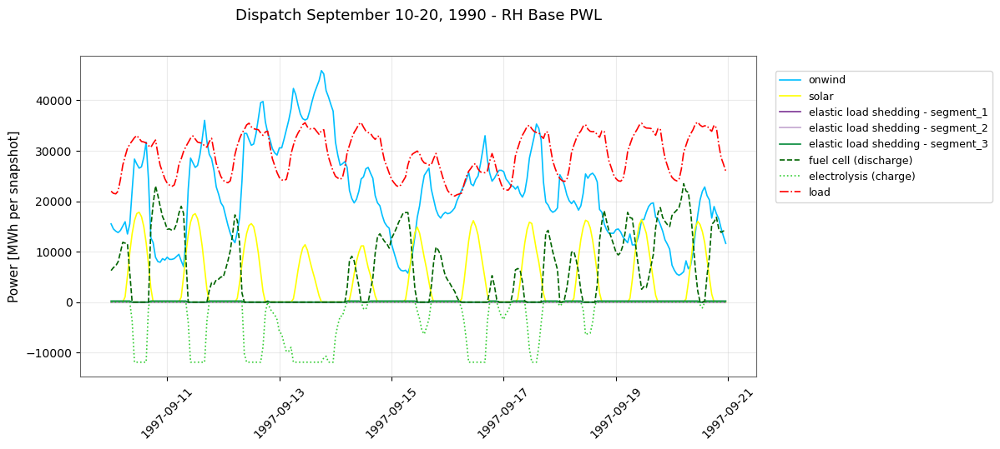

In [75]:
# interval from september 10th to september 20th 1990
interval_dispatch = intervall = (f"{test_year}-09-10", f"{test_year}-09-20")

plot_dispatch_elec_h2_w_PWL(net, 
    interval=interval_dispatch, 
    title="Dispatch September 10-20, 1990 - RH Base PWL", 
    figure_size=(12,5),
    legend_outside=True
)

# Extreme events analysis

## - Event labels, dict and colors  

In [76]:
events_by_key = {
    "CE_SP": ce_events_SP,
    "CE_NL": ce_events_NL,

    "PF_SP": pf_events_SP,
    "PF_LS": pf_events_LS,
    "PF_LS_PWL": pf_events_LS_PWL,
    "PF_SP_PWL": pf_events_SP_PWL,
    "PF_FlexAct_PWL": pf_events_PWL_FlexAct,

    "RH_SP": rh_events_SP,
    "RH_LS": rh_events_LS,
    "RH_LS_PWL": rh_events_LS_PWL,
    "RH_SP_PWL": rh_events_SP_PWL,
    "RH_FlexAct_PWL": rh_events_PWL_FlexAct,
}

model_event_keys = [
    "CE_SP", "CE_NL",

    "PF_SP", "PF_LS", "PF_LS_PWL", "PF_SP_PWL", "PF_FlexAct_PWL",

    "RH_SP", "RH_LS", "RH_LS_PWL", "RH_SP_PWL", "RH_FlexAct_PWL",
]

LABELS_SHORT = {
    "CE_SP": "CE-SP",
    "CE_NL": "CE-NL",

    "PF_SP": "PF-SP",
    "PF_LS": "PF-LS",
    "PF_LS_PWL": "PF-LS (PWL)",
    "PF_SP_PWL": "PF-SP (PWL)",
    "PF_FlexAct_PWL": "PF-Flex (PWL)",

    "RH_SP": "LF-SP",
    "RH_LS": "LF-LS",
    "RH_LS_PWL": "LF-LS (PWL)",
    "RH_SP_PWL": "LF-SP (PWL)",
    "RH_FlexAct_PWL": "LF-Flex (PWL)",
}


LABELS_MEDIUM = {
    "CE_SP": "Capacity expansion - SP",
    "CE_NL": "Capacity expansion - Net load",

    "PF_SP": "Perfect foresight - SP",
    "PF_LS": "Perfect foresight - LS",
    "PF_LS_PWL": "Perfect foresight (PWL) - LS",
    "PF_SP_PWL": "Perfect foresight (PWL) - SP",
    "PF_FlexAct_PWL": "Perfect foresight (PWL) - FlexAct",

    "RH_SP": "Limited foresight - SP",
    "RH_LS": "Limited foresight - LS",
    "RH_LS_PWL": "Limited foresight (PWL) - LS",
    "RH_SP_PWL": "Limited foresight (PWL) - SP",
    "RH_FlexAct_PWL": "Limited foresight (PWL) - FlexAct",
}


LABELS_LONG = {
    "CE_SP": "Capacity expansion - Shadow price events",
    "CE_NL": "Capacity expansion - Net load events",

    "PF_SP": "Perfect foresight - Shadow price events",
    "PF_LS": "Perfect foresight - Load shedding events",
    "PF_LS_PWL": "Perfect foresight with piecewise-linear flexibility - Load shedding events",
    "PF_SP_PWL": "Perfect foresight with piecewise-linear flexibility - Shadow price events",
    "PF_FlexAct_PWL": "Perfect foresight with piecewise-linear flexibility - Flexible demand activation",

    "RH_SP": "Limited foresight - Shadow price events",
    "RH_LS": "Limited foresight - Load shedding events",
    "RH_LS_PWL": "Limited foresight with piecewise-linear flexibility - Load shedding events",
    "RH_SP_PWL": "Limited foresight with piecewise-linear flexibility - Shadow price events",
    "RH_FlexAct_PWL": "Limited foresight with piecewise-linear flexibility - Flexible demand activation",
}

LABEL_SETS = {"short": LABELS_SHORT, "medium": LABELS_MEDIUM, "long": LABELS_LONG}

### -- Event colors 

In [77]:
COLORS_BY_KEY_CBSAFE = {
    "CE_SP": "#000000",        # black
    "CE_NL": "#666666",        # dark grey

    "PF_SP": "#0072B2",        # blue
    "PF_SP_PWL": "#004C7F",    # darker blue (PWL)

    "PF_LS": "#D55E00",        # vermillion
    "PF_LS_PWL": "#8F3B00",    # darker vermillion (PWL)

    "PF_FlexAct_PWL": "#E69F00",  # orange

    "RH_SP": "#009E73",        # bluish green
    "RH_SP_PWL": "#00724F",    # darker green (PWL)

    "RH_LS": "#A6761D",        # brownish red (distinct from PF_LS)
    "RH_LS_PWL": "#6E4A12",    # darker brown-red (PWL)

    "RH_FlexAct_PWL": "#F0E442",  # yellow (high contrast, CB-safe)
}

COLORS_BY_KEY_OVERLAY = {
    # Capacity expansion
    "CE_SP": "#4d4d4d",        # mid grey (NOT black)
    "CE_NL": "#9e9e9e",        # light grey

    # Perfect foresight — blue family
    "PF_SP": "#4c72b0",        # muted blue
    "PF_SP_PWL": "#8da0cb",   # light blue (PWL)

    # Perfect foresight — LS
    "PF_LS": "#e41a1c",        # clear red
    "PF_LS_PWL": "#fb9a99",   # light red (PWL)

    # FlexAct
    "PF_FlexAct_PWL": "#ffb000",  # amber

    # Limited foresight — purple family
    "RH_SP": "#984ea3",        # medium purple
    "RH_SP_PWL": "#cab2d6",    # light purple (PWL)

    "RH_LS": "#f781bf",        # pink (distinct from red)
    "RH_LS_PWL": "#fccde5",    # very light pink

    "RH_FlexAct_PWL": "#ffd92f",  # yellow
}

COLORS_BY_KEY = {
    # Capacity expansion
    "CE_SP": "#000000",        # black (unique, unmistakable)
    "CE_NL": "#7f7f7f",        # medium gray

    # Perfect foresight
    "PF_SP": "#e31a1c",        # strong red
    "PF_LS": "#1f78b4",        # strong blue
    "PF_LS_PWL": "#fb8072",    # salmon
    "PF_SP_PWL": "#33a02c",    # strong green
    "PF_FlexAct_PWL": "#ff7f00",  # orange

    # Limited foresight (LF / RH)
    "RH_SP": "purple",        # deep purple
    "RH_LS": "#b15928",        # brown
    "RH_LS_PWL": "#fdb462",    # light orange
    "RH_SP_PWL": "#17becf",    # cyan / teal
    "RH_FlexAct_PWL": "#ffd92f",  # yellow
}

#COLORS_BY_KEY = COLORS_BY_KEY_OVERLAY

### -- Function for fetching events, labels, and colors

In [78]:
def select_plot_inputs(
    events_by_key: dict,
    keys: list,
    label_style: str = "medium",
    colors_by_key: dict | None = None,
):
    labels = [LABEL_SETS[label_style][k] for k in keys]
    events = [events_by_key[k] for k in keys]
    if colors_by_key is None:
        colors = [color_from_key(k) for k in keys]
    else:
        colors = [colors_by_key[k] for k in keys]
    return events, labels, colors

def select_plot_inputs_filter(
    events_by_key: dict,
    networks_by_key: dict,
    keys: list,
    label_style: str = "medium",
    colors_by_key: dict | None = None,
    year_list: list[int] | None = None,
):
    # labels
    labels = [LABEL_SETS[label_style][k] for k in keys]

    # events
    if year_list is None:
        events = [events_by_key[k] for k in keys]
    else:
        events = [filter_events_by_years(events_by_key[k], year_list) for k in keys]

    # networks
    if year_list is None:
        networks = networks_by_key
    else:
        networks = filter_networks_by_years(networks_by_key, year_list)
        

    # colors
    if colors_by_key is None:
        colors = [color_from_key(k) for k in keys]
    else:
        colors = [colors_by_key[k] for k in keys]

    return events, networks, labels, colors


### -- Generel overview tables

In [79]:
labels = ["CE_SP", "CE_NL", "PF_SP", "PF_LS", "PF_PWL_FlexAct", "RH_SP", "RH_LS", "RH_SP_PWL","RH_PWL_FlexAct"]
events_dict_list = [ce_events_SP, ce_events_NL, pf_events_SP, pf_events_LS,
                    pf_events_PWL_FlexAct, rh_events_SP, rh_events_LS, rh_events_SP_PWL, rh_events_PWL_FlexAct]

event_counts_pr_year = build_event_count_table(labels, events_dict_list)
event_counts_pr_year

,Total of 9,CE_SP,CE_NL,PF_SP,PF_LS,PF_PWL_FlexAct,RH_SP,RH_LS,RH_SP_PWL,RH_PWL_FlexAct
Year,,,,,,,,,,
79/80,10.0,1.0,1.0,0.0,1.0,1.0,2.0,1.0,2.0,1.0
80/81,11.0,1.0,1.0,0.0,1.0,1.0,3.0,1.0,2.0,1.0
81/82,13.0,1.0,1.0,2.0,1.0,1.0,3.0,1.0,2.0,1.0
82/83,9.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,2.0,1.0
83/84,11.0,1.0,1.0,0.0,1.0,1.0,2.0,1.0,3.0,1.0
84/85,3.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
85/86,11.0,1.0,1.0,0.0,1.0,1.0,3.0,1.0,2.0,1.0
86/87,10.0,1.0,1.0,0.0,1.0,1.0,3.0,1.0,1.0,1.0
87/88,4.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0


## - Event overview plots 

### -- filtering events in 3 pieces

In [80]:
# --- Three-part filtered sets by weather year slices ---
filter_years_1 = weather_years[:11]
filter_years_2 = weather_years[11:21]
filter_years_3 = weather_years[21:]

# first filter exp networks
networks_exp_base_filtered_1 = filter_networks_by_years(selected_networks_exp, filter_years_1)
networks_exp_base_filtered_2 = filter_networks_by_years(selected_networks_exp, filter_years_2)
networks_exp_base_filtered_3 = filter_networks_by_years(selected_networks_exp, filter_years_3)

# first filter pf networks
networks_pf_base_filtered_1 = filter_networks_by_years(selected_networks_pf, filter_years_1)
networks_pf_base_filtered_2 = filter_networks_by_years(selected_networks_pf, filter_years_2)
networks_pf_base_filtered_3 = filter_networks_by_years(selected_networks_pf, filter_years_3)

# first filter rh networks
networks_rh_base_filtered_1 = filter_networks_by_years(selected_networks_rh, filter_years_1)
networks_rh_base_filtered_2 = filter_networks_by_years(selected_networks_rh, filter_years_2)
networks_rh_base_filtered_3 = filter_networks_by_years(selected_networks_rh, filter_years_3)


# CE Events
ce_events_SP_filtered_1 = filter_events_by_years(ce_events_SP, filter_years_1)
ce_events_SP_filtered_2 = filter_events_by_years(ce_events_SP, filter_years_2)
ce_events_SP_filtered_3 = filter_events_by_years(ce_events_SP, filter_years_3)

ce_events_NL_filtered_1 = filter_events_by_years(ce_events_NL, filter_years_1)
ce_events_NL_filtered_2 = filter_events_by_years(ce_events_NL, filter_years_2)
ce_events_NL_filtered_3 = filter_events_by_years(ce_events_NL, filter_years_3)

# PF Events
pf_events_SP_filtered_1 = filter_events_by_years(pf_events_SP, filter_years_1)
pf_events_SP_filtered_2 = filter_events_by_years(pf_events_SP, filter_years_2)
pf_events_SP_filtered_3 = filter_events_by_years(pf_events_SP, filter_years_3)

pf_events_LS_filtered_1 = filter_events_by_years(pf_events_LS, filter_years_1)
pf_events_LS_filtered_2 = filter_events_by_years(pf_events_LS, filter_years_2)
pf_events_LS_filtered_3 = filter_events_by_years(pf_events_LS, filter_years_3)

# PF PWL Events
pf_events_SP_PWL_filtered_1 = filter_events_by_years(pf_events_SP_PWL, filter_years_1)
pf_events_SP_PWL_filtered_2 = filter_events_by_years(pf_events_SP_PWL, filter_years_2)
pf_events_SP_PWL_filtered_3 = filter_events_by_years(pf_events_SP_PWL, filter_years_3)

pf_events_LS_PWL_filtered_1 = filter_events_by_years(pf_events_LS_PWL, filter_years_1)
pf_events_LS_PWL_filtered_2 = filter_events_by_years(pf_events_LS_PWL, filter_years_2)
pf_events_LS_PWL_filtered_3 = filter_events_by_years(pf_events_LS_PWL, filter_years_3)

pf_events_PWL_FlexAct_filtered_1 = filter_events_by_years(pf_events_PWL_FlexAct, filter_years_1)
pf_events_PWL_FlexAct_filtered_2 = filter_events_by_years(pf_events_PWL_FlexAct, filter_years_2)
pf_events_PWL_FlexAct_filtered_3 = filter_events_by_years(pf_events_PWL_FlexAct, filter_years_3)

# RH Events
rh_events_SP_filtered_1 = filter_events_by_years(rh_events_SP, filter_years_1)
rh_events_SP_filtered_2 = filter_events_by_years(rh_events_SP, filter_years_2)
rh_events_SP_filtered_3 = filter_events_by_years(rh_events_SP, filter_years_3)

rh_events_LS_filtered_1 = filter_events_by_years(rh_events_LS, filter_years_1)
rh_events_LS_filtered_2 = filter_events_by_years(rh_events_LS, filter_years_2)
rh_events_LS_filtered_3 = filter_events_by_years(rh_events_LS, filter_years_3)

# RH PWL Events
rh_events_SP_PWL_filtered_1 = filter_events_by_years(rh_events_SP_PWL, filter_years_1)
rh_events_SP_PWL_filtered_2 = filter_events_by_years(rh_events_SP_PWL, filter_years_2)
rh_events_SP_PWL_filtered_3 = filter_events_by_years(rh_events_SP_PWL, filter_years_3)

rh_events_LS_PWL_filtered_1 = filter_events_by_years(rh_events_LS_PWL, filter_years_1)
rh_events_LS_PWL_filtered_2 = filter_events_by_years(rh_events_LS_PWL, filter_years_2)
rh_events_LS_PWL_filtered_3 = filter_events_by_years(rh_events_LS_PWL, filter_years_3)

rh_events_PWL_FlexAct_filtered_1 = filter_events_by_years(rh_events_PWL_FlexAct, filter_years_1)
rh_events_PWL_FlexAct_filtered_2 = filter_events_by_years(rh_events_PWL_FlexAct, filter_years_2)
rh_events_PWL_FlexAct_filtered_3 = filter_events_by_years(rh_events_PWL_FlexAct, filter_years_3)

print(f"Created 3-part filtered event sets for weather years:")
print(f"  Part 1: {len(filter_years_1)} years {list(filter_years_1)}")
print(f"  Part 2: {len(filter_years_2)} years {list(filter_years_2)}")
print(f"  Part 3: {len(filter_years_3)} years {list(filter_years_3)}")

Created 3-part filtered event sets for weather years:
  Part 1: 11 years [1979, 1980, 1981, 1982, 1983, 1984, 1985, 1986, 1987, 1988, 1989]
  Part 2: 10 years [1990, 1991, 1992, 1993, 1994, 1995, 1996, 1997, 1998, 1999]
  Part 3: 10 years [2000, 2001, 2002, 2003, 2004, 2005, 2006, 2007, 2008, 2009]


### -- Individual plots 

#### --- Capacity expansion

(<Figure size 800x600 with 1 Axes>,
 <Axes: title={'center': 'Netload events Exp - T=20%'}, xlabel='Demand year 2018/2019', ylabel='Weather year'>)

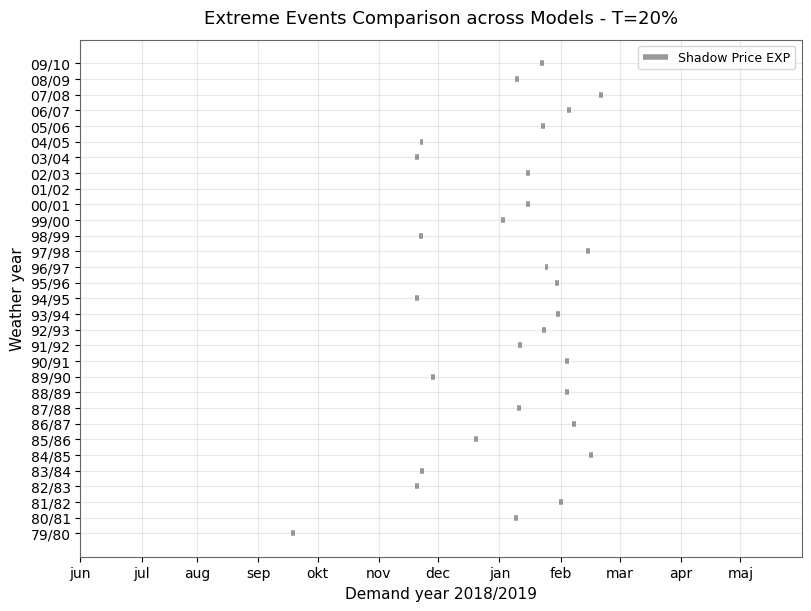

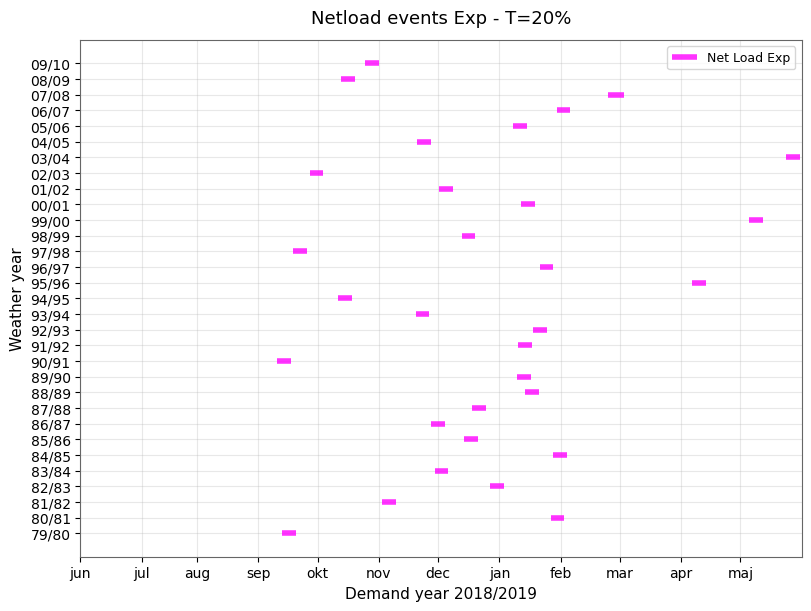

In [81]:
T = beta
plot_all_events(event_dicts=[ce_events_SP],
    labels=["Shadow Price EXP"],
    colors=["grey"],
    standard_year=2018,
    figsize=default_figsize,
    title=f"Extreme Events Comparison across Models - T={T*100:.0f}%",
    offset_step=0.3,
    alpha=0.8,
    linewidth=4)

plot_all_events(event_dicts=[ce_events_NL],
    labels=["Net Load Exp"],
    colors=["magenta"],
    standard_year=2018,
    figsize=default_figsize,
    title=f"Netload events Exp - T={T*100:.0f}%",
    offset_step=0.3,
    alpha=0.8,
    linewidth=4)

#### --- Perfect foresight

(<Figure size 800x600 with 1 Axes>,
 <Axes: title={'center': 'Dispatch netload events - T=20%'}, xlabel='Demand year 2018/2019', ylabel='Weather year'>)

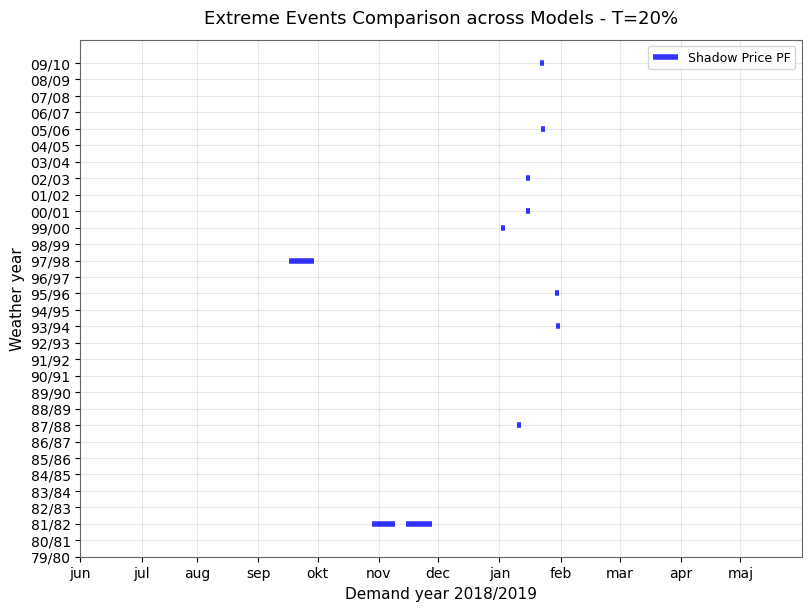

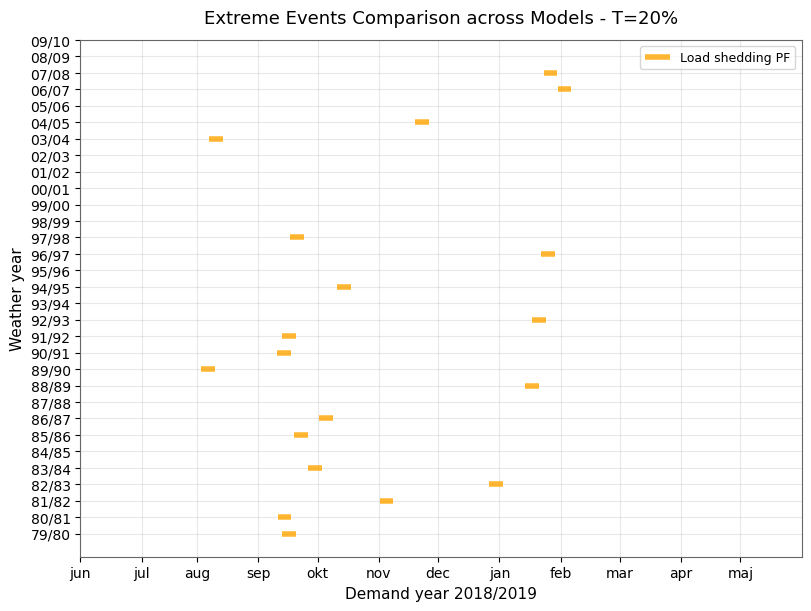

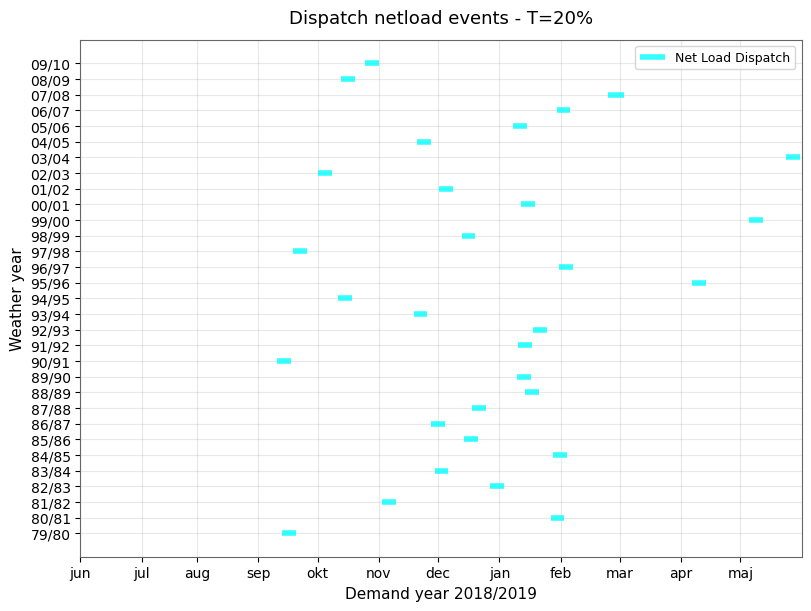

In [82]:
plot_all_events(event_dicts=[pf_events_SP],
    labels=["Shadow Price PF"],
    colors=["blue"],
    standard_year=2018,
    figsize=default_figsize,
    title=f"Extreme Events Comparison across Models - T={T*100:.0f}%",
    offset_step=0.3,
    alpha=0.8,
    linewidth=4
)
plot_all_events(event_dicts=[pf_events_LS],
    labels=["Load shedding PF"],
    colors=["orange"],
    standard_year=2018,
    figsize=default_figsize,
    title=f"Extreme Events Comparison across Models - T={T*100:.0f}%",
    offset_step=0.3,
    alpha=0.8,
    linewidth=4
)
plot_all_events(event_dicts=[dispatch_events_NL],
    labels=["Net Load Dispatch"],
    colors=["cyan"],
    standard_year=2018,
    figsize=default_figsize,
    title=f"Dispatch netload events - T={T*100:.0f}%",
    offset_step=0.3,
    alpha=0.8,
    linewidth=4
)

#### --- Rolling horizon 

(<Figure size 800x600 with 1 Axes>,
 <Axes: title={'center': 'Extreme Events Comparison across Models - T=20%'}, xlabel='Demand year 2018/2019', ylabel='Weather year'>)

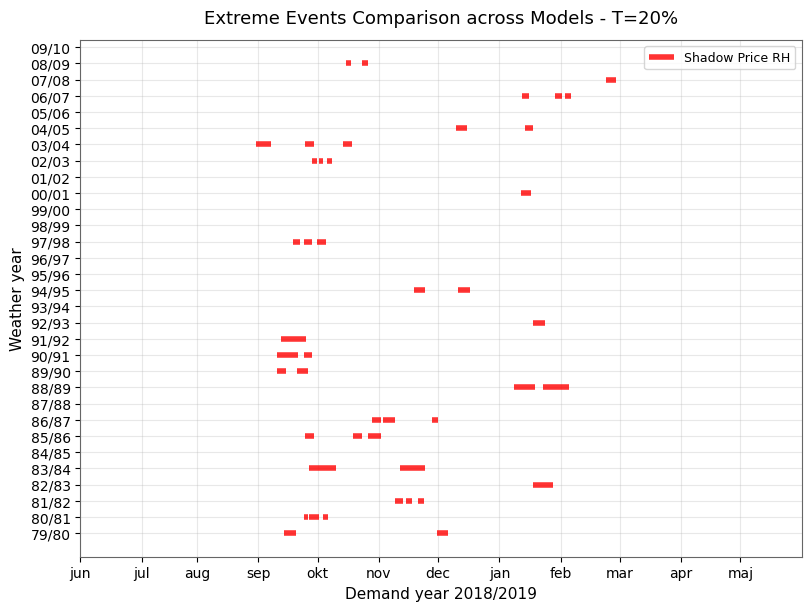

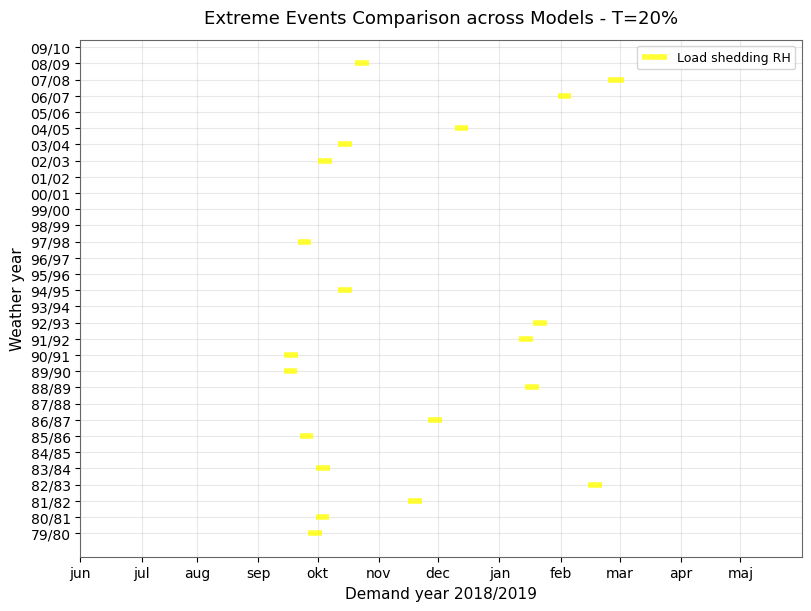

In [83]:
plot_all_events(event_dicts=[rh_events_SP],
    labels=["Shadow Price RH"],
    colors=["red"],
    standard_year=2018,
    figsize=default_figsize,
    title=f"Extreme Events Comparison across Models - T={T*100:.0f}%",
    offset_step=0.3,
    alpha=0.8,
    linewidth=4
)
plot_all_events(event_dicts=[rh_events_LS],
    labels=["Load shedding RH"],
    colors=["yellow"],
    standard_year=2018,
    figsize=default_figsize,
    title=f"Extreme Events Comparison across Models - T={T*100:.0f}%",
    offset_step=0.3,
    alpha=0.8,
    linewidth=4
)

#### --- PWL flexible

(<Figure size 800x600 with 1 Axes>,
 <Axes: title={'center': 'Extreme Events Comparison across Models - T=20%'}, xlabel='Demand year 2018/2019', ylabel='Weather year'>)

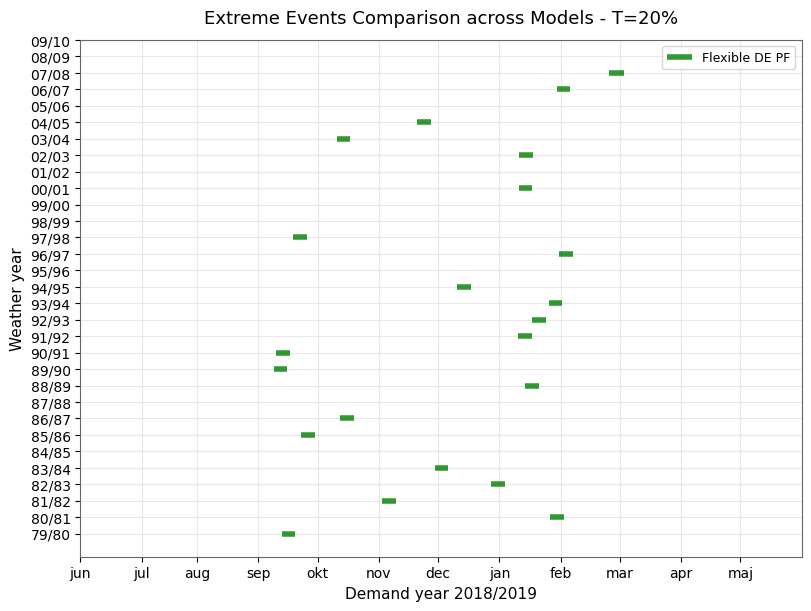

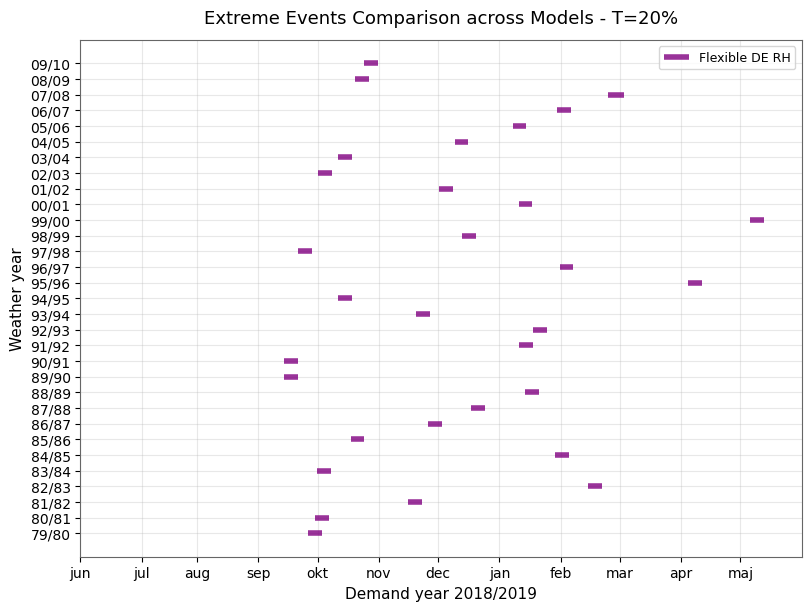

In [84]:
# FLEX ACTIVATION EVENTS
plot_all_events(event_dicts=[pf_events_PWL_FlexAct],
    labels=["Flexible DE PF"],
    colors=["green"],
    standard_year=2018,
    figsize=default_figsize,
    title=f"Extreme Events Comparison across Models - T={T*100:.0f}%",
    offset_step=0.3,
    alpha=0.8,
    linewidth=4
)
plot_all_events(event_dicts=[rh_events_PWL_FlexAct],
    labels=["Flexible DE RH"],
    colors=["purple"],
    standard_year=2018,
    figsize=default_figsize,
    title=f"Extreme Events Comparison across Models - T={T*100:.0f}%",
    offset_step=0.3,
    alpha=0.8,
    linewidth=4
)


### -- Heatmap plots

#### --- Shadow price events 

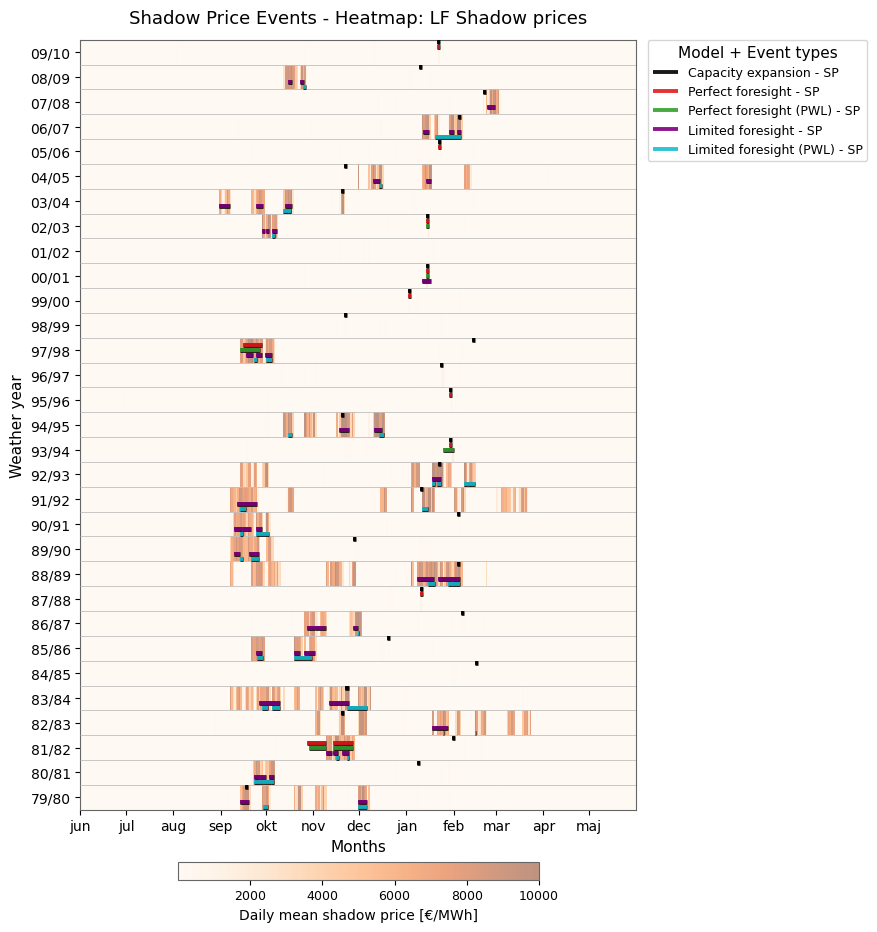

In [85]:
# USED IN THE REPORT
events, labels, colors = select_plot_inputs(
    events_by_key,
    keys=["CE_SP", "PF_SP", "PF_SP_PWL", "RH_SP", "RH_SP_PWL"],
    label_style="medium",
    colors_by_key=COLORS_BY_KEY,)

fig, ax = plot_overview_heatmap(
    selected_networks=selected_networks_rh,
    title= "Shadow Price Events - Heatmap: LF Shadow prices",
    plot_type="SP",
    agg="daily", 
    event_dicts=events,
    event_labels= labels,
    event_colors= colors,
    vmin=0.01,
    vmax=None,
    heatmap_alpha=0.5,
    event_edge_width=0.5,
    figure_size=(8, 10),
    cmap="Oranges",
    start_month=6,)


if save_plots:
    plt.savefig(
        Figures_appendix_path / f"sp_events_all_models_full_{Test_name_dispatch}.pdf",
        bbox_inches="tight",
    )

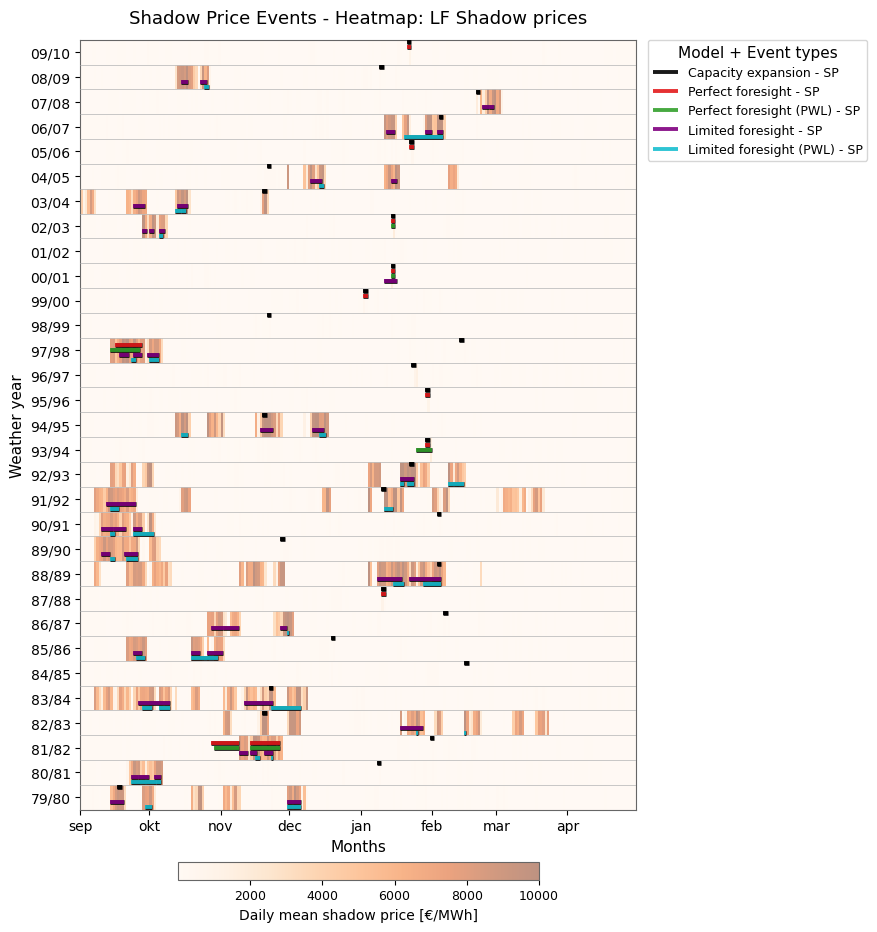

In [86]:
# USED IN THE MAIN REPORT
events, labels, colors = select_plot_inputs(
    events_by_key,
    keys=["CE_SP", "PF_SP", "PF_SP_PWL", "RH_SP", "RH_SP_PWL"],
    label_style="medium",
    colors_by_key=COLORS_BY_KEY,)

fig, ax = plot_overview_heatmap(
    selected_networks=selected_networks_rh,
    title= "Shadow Price Events - Heatmap: LF Shadow prices",
    plot_type="SP",
    agg="daily", 
    event_dicts=events,
    event_labels= labels,
    event_colors= colors,
    vmin=0.01,
    vmax=None,
    heatmap_alpha=0.5,
    event_edge_width=0.5,
    figure_size=(8, 10),
    cmap="Oranges",
    start_month=9,
    end_month=4
)
#save_plots=False
if save_plots:
    plt.savefig(
        Figures_results_path / f"sp_events_all_models_short_{Test_name_dispatch}.pdf",
        bbox_inches="tight",
    )

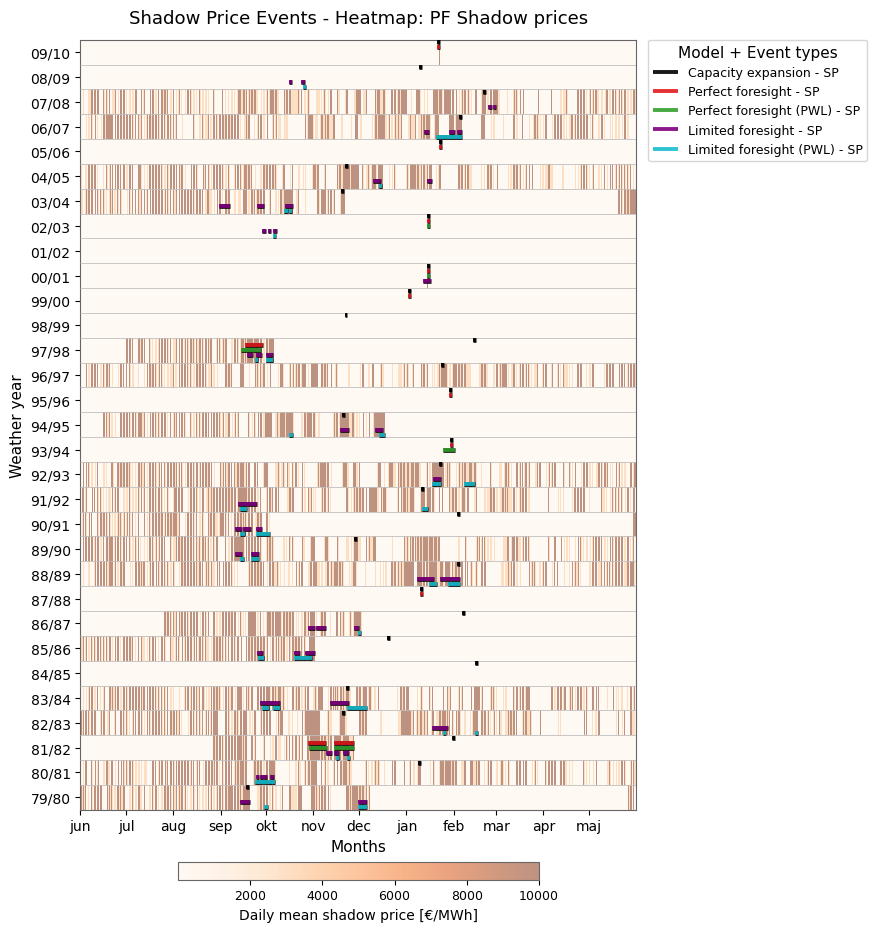

In [87]:
# USED IN THE REPORT 
events, labels, colors = select_plot_inputs(
    events_by_key,
    keys=["CE_SP", "PF_SP", "PF_SP_PWL", "RH_SP", "RH_SP_PWL"],
    label_style="medium",
    colors_by_key=COLORS_BY_KEY,)

fig, ax = plot_overview_heatmap(
    selected_networks=selected_networks_pf,
    title= "Shadow Price Events - Heatmap: PF Shadow prices",
    plot_type="SP",
    agg="hourly", 
    event_dicts=events,
    event_labels= labels,
    event_colors= colors,
    vmin=0.01,
    vmax=None,
    heatmap_alpha=0.5,
    event_edge_width=0.5,
    figure_size=(8, 10),
    cmap="Oranges",
    start_month=6,)

#save_plots=False
if save_plots:
    plt.savefig(
        Figures_appendix_path / f"sp_events_all_models_full_{Test_name_dispatch}_pf_heatmap.pdf",
        bbox_inches="tight",
    )

#### --- Load shedding events

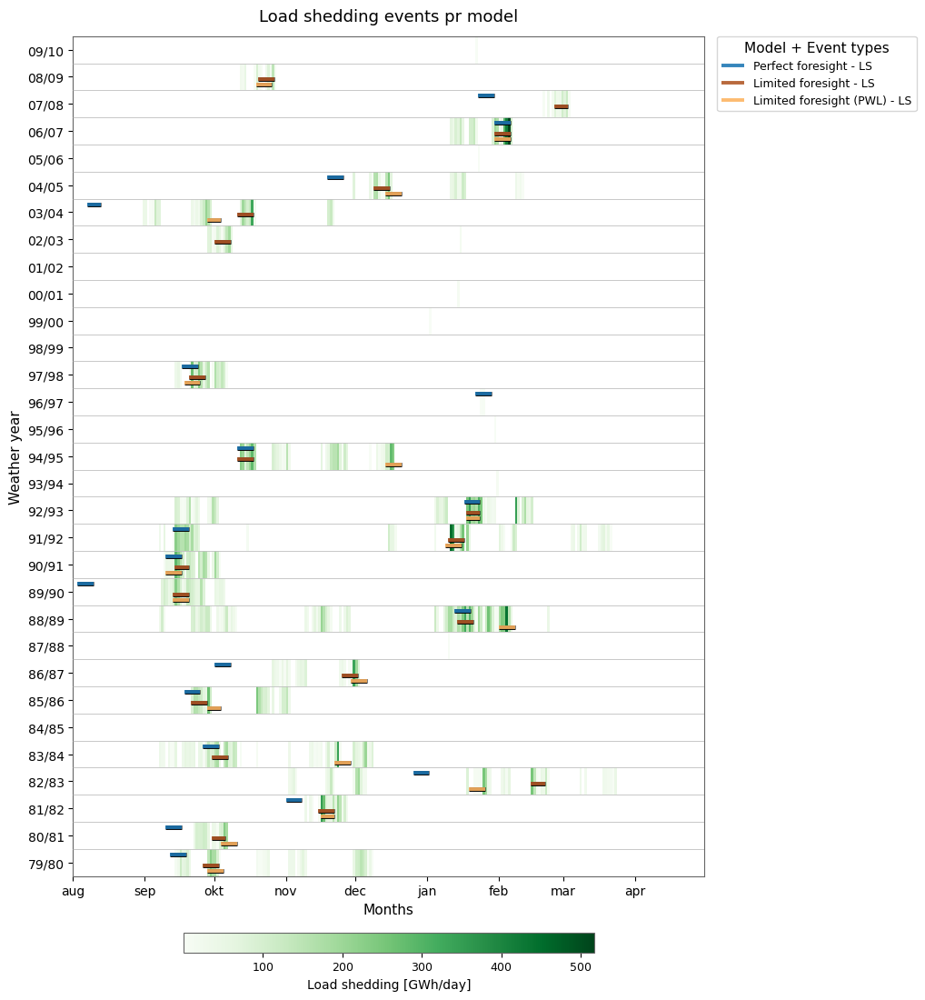

In [88]:
events, labels, colors = select_plot_inputs(
    events_by_key,
    keys=["PF_LS", "PF_LS_PWL", "RH_LS", "RH_LS_PWL"],
    label_style="medium",
    colors_by_key=COLORS_BY_KEY,
)

fig, ax = plot_overview_heatmap(
    selected_networks=selected_networks_rh,
    title= "Load shedding events pr model",
    plot_type="LS",
    agg="daily", 
    event_dicts= events,
    event_labels= labels,
    event_colors= colors,
    vmin=0.01,
    vmax=None,
    heatmap_alpha=1,
    figure_size=(10, 12),
    start_month=8,
    end_month=4
)

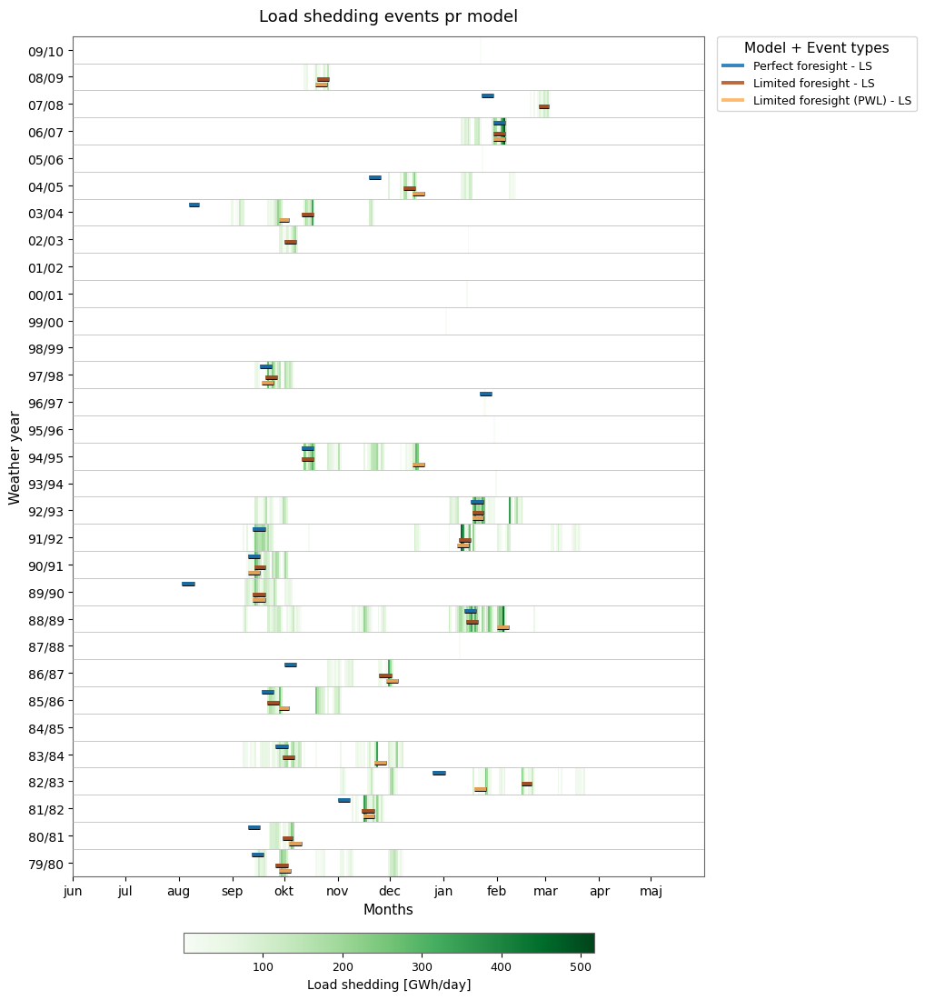

In [89]:
fig, ax = plot_overview_heatmap(
    selected_networks=selected_networks_rh,
    title= "Load shedding events pr model",
    plot_type="LS",
    agg="daily", 
    event_dicts=events,
    event_labels= labels,
    event_colors= colors,
    vmin=0.01,
    vmax=None,
    heatmap_alpha=1,
    figure_size=(10, 12),
    #cmap="Oranges",
)

#### --- Netload events 

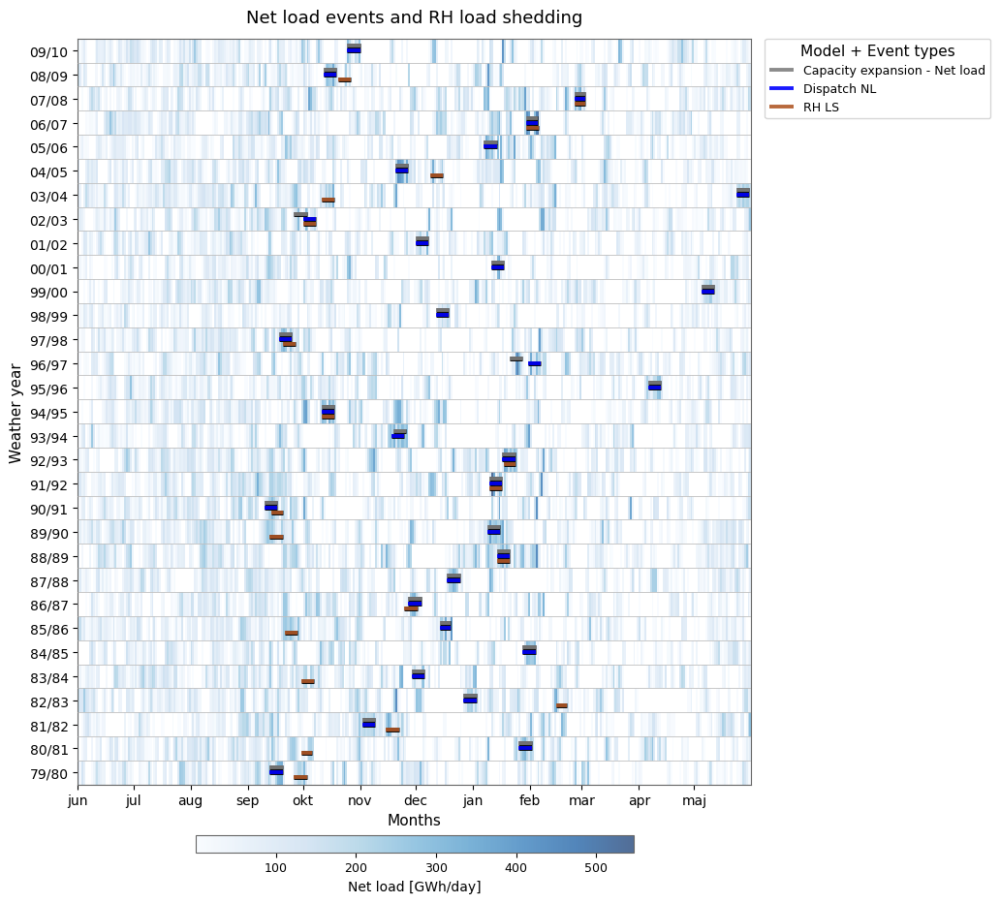

In [90]:
events_to_plot = [ce_events_NL, dispatch_events_NL, rh_events_LS]
labels_overview_plot = ["Capacity expansion - Net load", "Dispatch NL", "RH LS Events"]

fig, ax = plot_overview_heatmap(
    selected_networks=selected_networks_rh,
    title= "Net load events and RH load shedding",
    plot_type="NL",
    agg="daily", 
    event_dicts=events_to_plot,
    event_labels=labels_overview_plot,
    event_colors=[COLORS_BY_KEY['CE_NL'], "blue", COLORS_BY_KEY['RH_LS']],
    vmin=0.01,
    vmax=None,
    heatmap_alpha=0.7,
    figure_size=(10, 10),
    # start_month=8,
    # end_month=4
)


#### --- SUBPLOT / COMBINED PLOT Filtering events by years

##### ---- Plots of limited foresight model with different heatmaps 

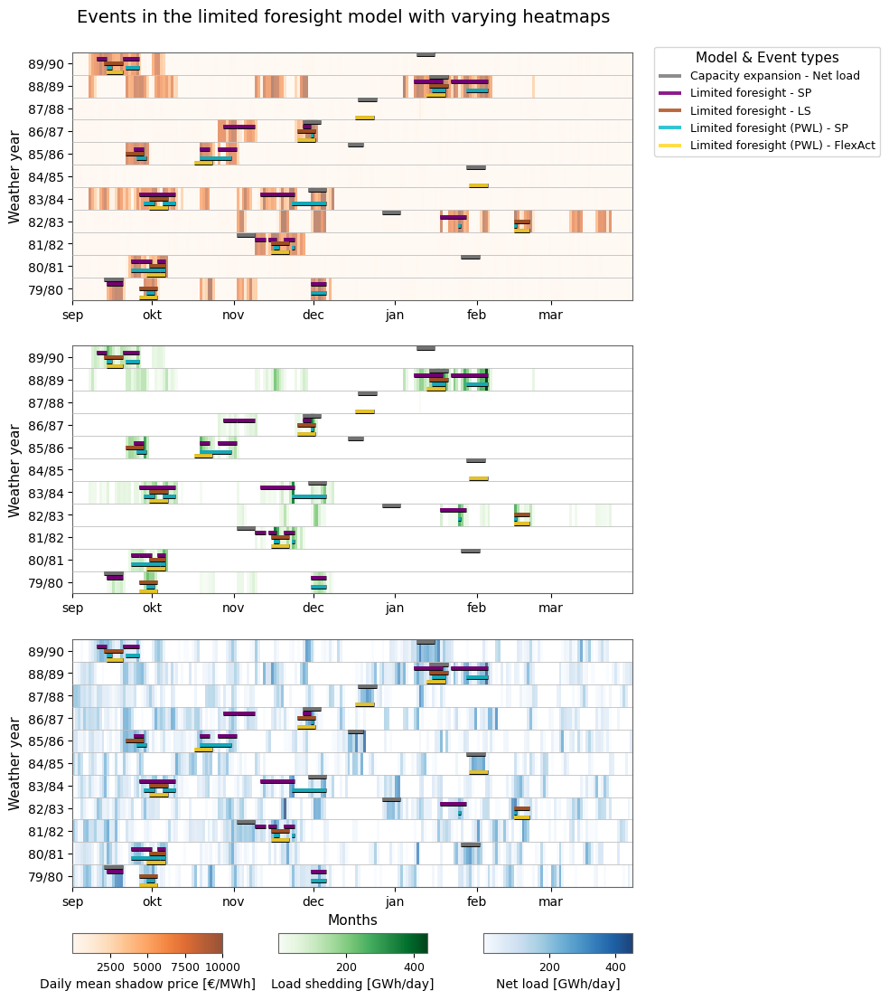

In [91]:
filtered_events = [ce_events_NL_filtered_1, rh_events_SP_filtered_1, rh_events_LS_filtered_1, rh_events_SP_PWL_filtered_1, rh_events_PWL_FlexAct_filtered_1]
events, labels, colors = select_plot_inputs(
    events_by_key,
    keys=["CE_NL", "RH_SP", "RH_LS", "RH_SP_PWL", "RH_FlexAct_PWL"],
    label_style="medium",
    colors_by_key=COLORS_BY_KEY,)

fig, axes = plot_overview_heatmap_combined(
    selected_networks=networks_rh_base_filtered_1,
    event_dicts=filtered_events,
    event_labels=labels,
    event_colors=colors,
    standard_year=2018,
    #start_month=6,
    agg="daily",
    figure_size=(8, 12),
    cmaps={"LS": "Greens", "SP": "Oranges", "NL": "Blues"},
    hspace = 0.24,
    suptitle = "Events in the limited foresight model with varying heatmaps",
    cbar_width_ratios=(0.25, 0.5, 0.25),
    legend_y=0.965,
    end_month=3,
    start_month=9
)            
if save_plots:
    plt.savefig(
        Figures_appendix_path / f"rh_events_all_events_subplot_{Test_name_dispatch}_filter_1.pdf",
        bbox_inches="tight",
    )

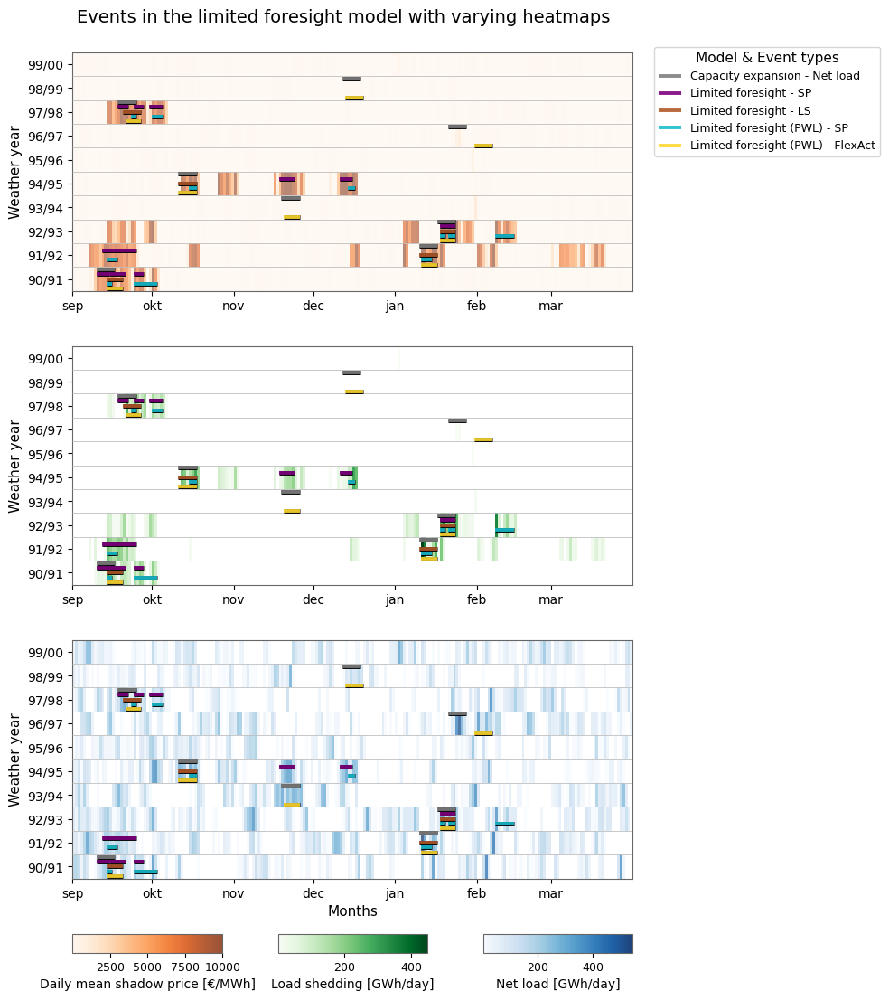

In [92]:
# USED IN THE REPORT
filtered_events_2 = [ce_events_NL_filtered_2, rh_events_SP_filtered_2, rh_events_LS_filtered_2, rh_events_SP_PWL_filtered_2, rh_events_PWL_FlexAct_filtered_2]

fig, axes = plot_overview_heatmap_combined(
    selected_networks=networks_rh_base_filtered_2,
    event_dicts=filtered_events_2,
    event_labels=labels,
    event_colors=colors,
    standard_year=2018,
    #start_month=6,
    agg="daily",
    figure_size=(8, 12),
    cmaps={"LS": "Greens", "SP": "Oranges", "NL": "Blues"},
    hspace = 0.3,
    suptitle = "Events in the limited foresight model with varying heatmaps",
    cbar_width_ratios=(0.25, 0.5, 0.25),
    legend_y=0.965,
    end_month=3,
    start_month=9
)            
if save_plots:
    plt.savefig(
        Figures_results_path / f"rh_events_all_events_subplot_{Test_name_dispatch}_filter_2.pdf",
        bbox_inches="tight",
    )

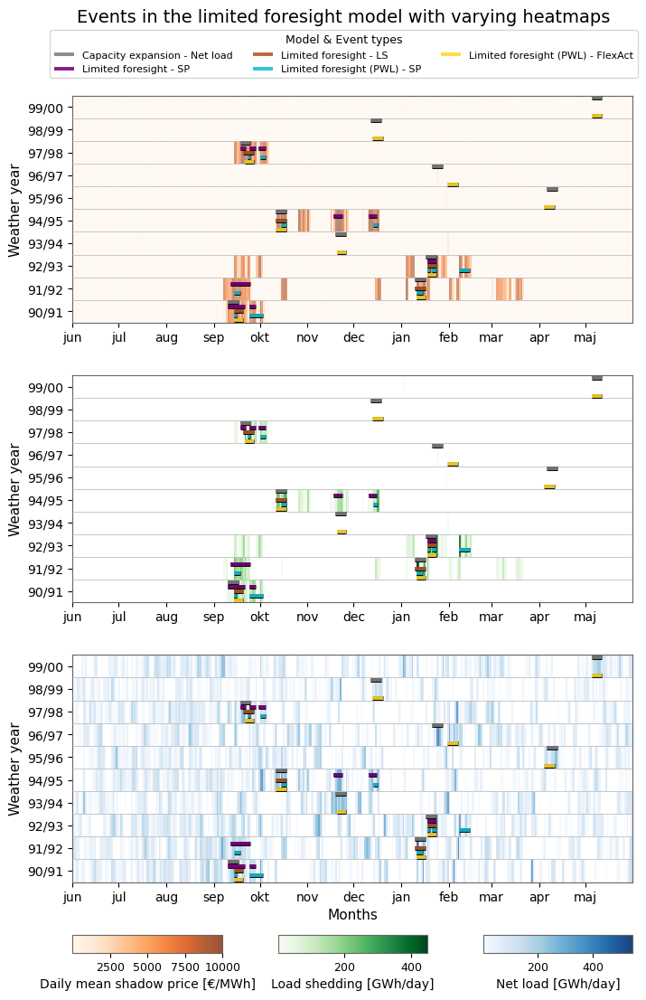

In [93]:
# SHOWING ALL MONTHS
# USED IN THE REPORT
filtered_events_2 = [ce_events_NL_filtered_2, rh_events_SP_filtered_2, rh_events_LS_filtered_2, rh_events_SP_PWL_filtered_2, rh_events_PWL_FlexAct_filtered_2]
events, labels, colors = select_plot_inputs(
    events_by_key,
    keys=["CE_NL", "RH_SP", "RH_LS", "RH_SP_PWL", "RH_FlexAct_PWL"],
    label_style="medium",
    colors_by_key=COLORS_BY_KEY,)


fig, axes = plot_overview_heatmap_combined(
    selected_networks=networks_rh_base_filtered_2,
    event_dicts=filtered_events_2,
    event_labels=labels,
    event_colors=colors,
    standard_year=2018,
    #start_month=6,
    agg="daily",
    figure_size=(8, 12),
    cmaps={"LS": "Greens", "SP": "Oranges", "NL": "Blues"},
    hspace = 0.3,
    suptitle = "Events in the limited foresight model with varying heatmaps",
    cbar_width_ratios=(0.25, 0.5, 0.25),
    legend_y=0.965,
    start_month=6
)            
if save_plots:
    plt.savefig(
        Figures_appendix_path / f"rh_events_all_events_subplot_{Test_name_dispatch}_filter_2_whole_year.pdf",
        bbox_inches="tight",
    )

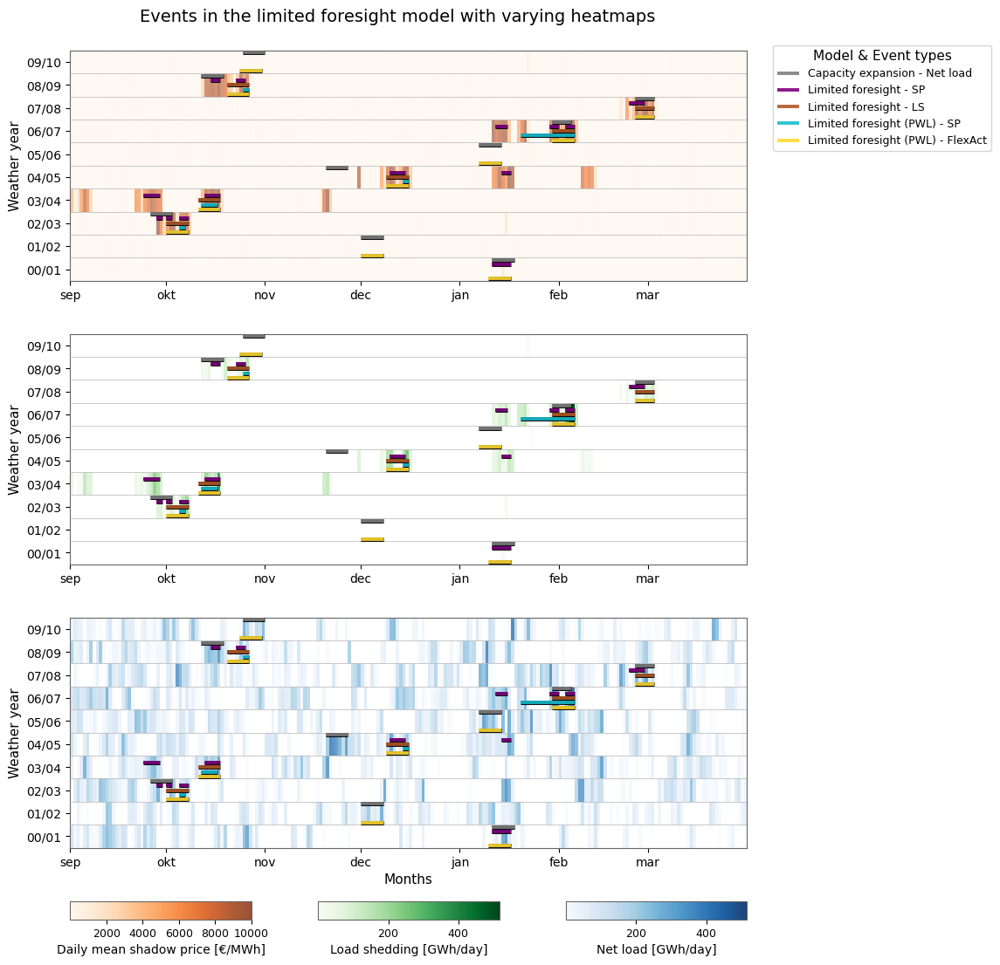

In [94]:
filtered_events_3 = [ce_events_NL_filtered_3, rh_events_SP_filtered_3, rh_events_LS_filtered_3, rh_events_SP_PWL_filtered_3, rh_events_PWL_FlexAct_filtered_3]

fig, axes = plot_overview_heatmap_combined(
    selected_networks=networks_rh_base_filtered_3,
    event_dicts=filtered_events_3,
    event_labels=labels,
    event_colors=colors,
    standard_year=2018,
    #start_month=6,
    agg="daily",
    figure_size=(10, 12),
    cmaps={"LS": "Greens", "SP": "Oranges", "NL": "Blues"},
    hspace = 0.3,
    suptitle = "Events in the limited foresight model with varying heatmaps",
    cbar_width_ratios=(0.25, 0.5, 0.25),
    legend_y=0.965,
    end_month=3,
    start_month=9
)            
if save_plots:
    plt.savefig(
        Figures_appendix_path / f"rh_events_all_events_subplot_{Test_name_dispatch}_filter_3.pdf",
        bbox_inches="tight",
    )

### -- Problem years combined subplot

##### ---- Filtering on problem years

In [95]:
problem_years_rh = [1979, 1981, 1983, 1988, 1990, 1992, 1997, 2002, 2004, 2006, 2008]

# Networks filtered to problem years
networks_rh_base_filtered_problems = filter_networks_by_years(selected_networks_rh, problem_years_rh)

# CE Events filtered to problem years
ce_events_NL_filtered_problems = filter_events_by_years(ce_events_NL, problem_years_rh)
ce_events_SP_filtered_problems = filter_events_by_years(ce_events_SP, problem_years_rh)

# PF Events filtered to problem years
pf_events_SP_filtered_problems = filter_events_by_years(pf_events_SP, problem_years_rh)
pf_events_LS_filtered_problems = filter_events_by_years(pf_events_LS, problem_years_rh)

# PF PWL Events filtered to problem years
pf_events_SP_PWL_filtered_problems = filter_events_by_years(pf_events_SP_PWL, problem_years_rh)
pf_events_LS_PWL_filtered_problems = filter_events_by_years(pf_events_LS_PWL, problem_years_rh)
pf_events_PWL_FlexAct_filtered_problems = filter_events_by_years(pf_events_PWL_FlexAct, problem_years_rh)

# RH Events filtered to problem years
rh_events_SP_filtered_problems = filter_events_by_years(rh_events_SP, problem_years_rh)
rh_events_LS_filtered_problems = filter_events_by_years(rh_events_LS, problem_years_rh)

# RH PWL Events filtered to problem years
rh_events_SP_PWL_filtered_problems = filter_events_by_years(rh_events_SP_PWL, problem_years_rh)
rh_events_LS_PWL_filtered_problems = filter_events_by_years(rh_events_LS_PWL, problem_years_rh)
rh_events_PWL_FlexAct_filtered_problems = filter_events_by_years(rh_events_PWL_FlexAct, problem_years_rh)

# Compile event lists for problem years. without flex activation
event_list_problems_new = [
    ce_events_SP_filtered_problems,
    ce_events_NL_filtered_problems,
    pf_events_SP_filtered_problems,
    pf_events_LS_filtered_problems,
    pf_events_SP_PWL_filtered_problems,
    pf_events_PWL_FlexAct_filtered_problems,
    rh_events_SP_filtered_problems,
    rh_events_LS_filtered_problems,
    rh_events_SP_PWL_filtered_problems,
    rh_events_LS_PWL_filtered_problems,
    rh_events_PWL_FlexAct_filtered_problems,
]


labels_problem_years_new = [
    "CE_SP",
    "CE_NL",
    "PF_SP",
    "PF_LS",
    "PF_SP_PWL",
    "PF_PWL_FlexAct",
    "LF_SP",
    "LF_LS",
    "LF_SP_PWL",
    "LF_LS_PWL",
    "LF_PWL_FlexAct",
]



##### ---- The plot using general Problem Years

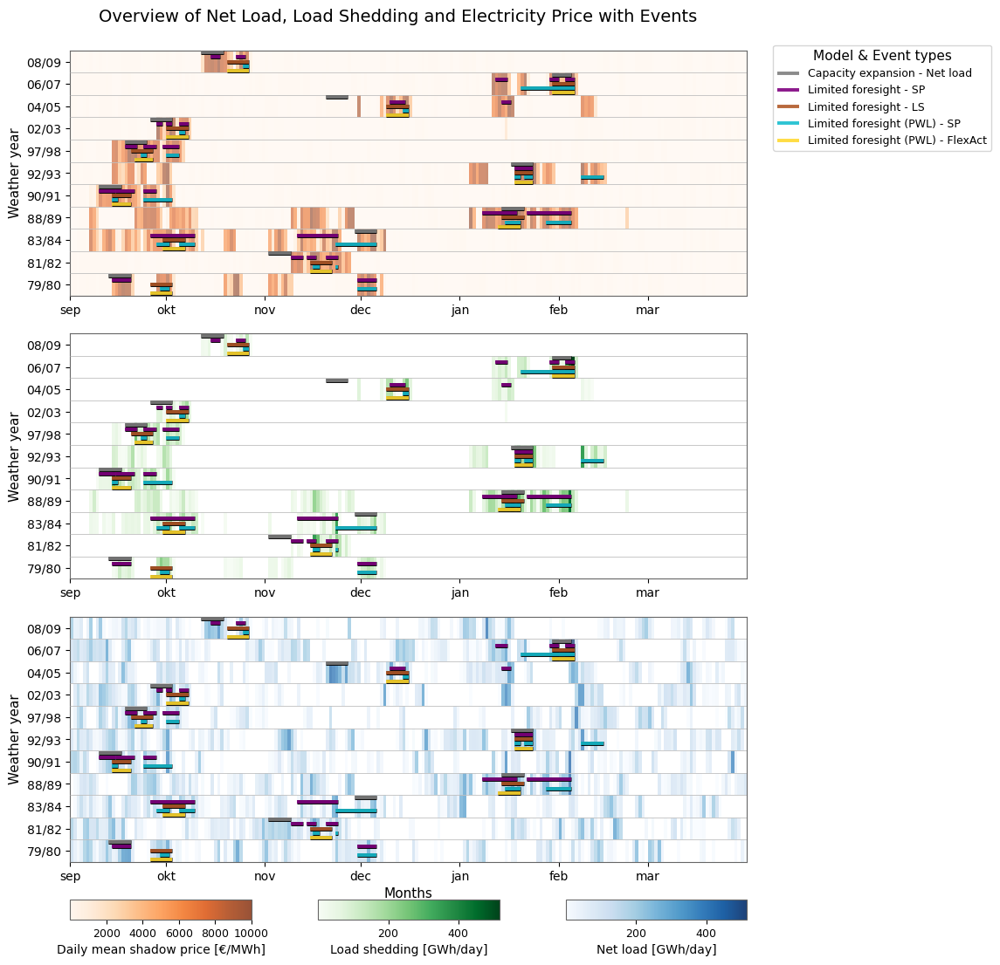

In [96]:
problem_years_events_new = [ce_events_NL_filtered_problems, rh_events_SP_filtered_problems, rh_events_LS_filtered_problems, rh_events_SP_PWL_filtered_problems, rh_events_PWL_FlexAct_filtered_problems]
events, labels, colors = select_plot_inputs(
    events_by_key,
    keys=["CE_NL", "RH_SP", "RH_LS", "RH_SP_PWL", "RH_FlexAct_PWL"],
    label_style="medium",
    colors_by_key=COLORS_BY_KEY,)

fig, axes = plot_overview_heatmap_combined(
    selected_networks=networks_rh_base_filtered_problems,
    event_dicts=problem_years_events_new,
    event_labels=labels,
    event_colors=colors,
    standard_year=2018,
    #start_month=6,
    agg="daily",
    figure_size=(10, 12),
    cmaps={"LS": "Greens", "SP": "Oranges", "NL": "Blues"},
    hspace = 0.2,
    suptitle = "Overview of Net Load, Load Shedding and Electricity Price with Events",
    cbar_width_ratios=(0.25, 0.5, 0.25),
    legend_y=0.965,
    end_month=3,
    start_month=9
)            

In [97]:
labels_problem_years = ["CE_SP", "CE_NL", "PF_SP", "PF_LS", "PF_SP_PWL", "PF_PWL_FlexAct", "RH_SP", "RH_LS", "RH_SP_PWL","RH_PWL_FlexAct"]

# CE Events filtered to problem years
ce_events_NL_filtered_problems = filter_events_by_years(ce_events_NL, problem_years_rh)
ce_events_SP_filtered_problems = filter_events_by_years(ce_events_SP, problem_years_rh)

# PF Events filtered to problem years
pf_events_SP_filtered_problems = filter_events_by_years(pf_events_SP, problem_years_rh)
pf_events_LS_filtered_problems = filter_events_by_years(pf_events_LS, problem_years_rh)

# PF PWL Events filtered to problem years
pf_events_SP_PWL_filtered_problems = filter_events_by_years(pf_events_SP_PWL, problem_years_rh)
pf_events_LS_PWL_filtered_problems = filter_events_by_years(pf_events_LS_PWL, problem_years_rh)
pf_events_PWL_FlexAct_filtered_problems = filter_events_by_years(pf_events_PWL_FlexAct, problem_years_rh)

# RH Events filtered to problem years
rh_events_SP_filtered_problems = filter_events_by_years(rh_events_SP, problem_years_rh)
rh_events_LS_filtered_problems = filter_events_by_years(rh_events_LS, problem_years_rh)

# RH PWL Events filtered to problem years
rh_events_SP_PWL_filtered_problems = filter_events_by_years(rh_events_SP_PWL, problem_years_rh)
rh_events_LS_PWL_filtered_problems = filter_events_by_years(rh_events_LS_PWL, problem_years_rh)
rh_events_PWL_FlexAct_filtered_problems = filter_events_by_years(rh_events_PWL_FlexAct, problem_years_rh)



In [98]:
overlap_matrix_problem_new = compute_event_overlap_matrix(
    event_dicts=problem_years_events_new,
    labels=labels
)
overlap_matrix_problem_new

,Capacity expansion - Net load,Limited foresight - SP,Limited foresight - LS,Limited foresight (PWL) - SP,Limited foresight (PWL) - FlexAct
Capacity expansion - Net load,1.000,0.818,0.545,0.545,0.545
Limited foresight - SP,0.500,1.000,0.577,0.692,0.577
Limited foresight - LS,0.545,0.909,1.000,1.000,1.000
Limited foresight (PWL) - SP,0.350,0.900,0.650,1.000,0.650
Limited foresight (PWL) - FlexAct,0.545,0.909,1.000,1.000,1.000


(<Figure size 1000x1000 with 2 Axes>,
 <Axes: title={'center': 'Event overlap probability matrix - problem years only'}>)

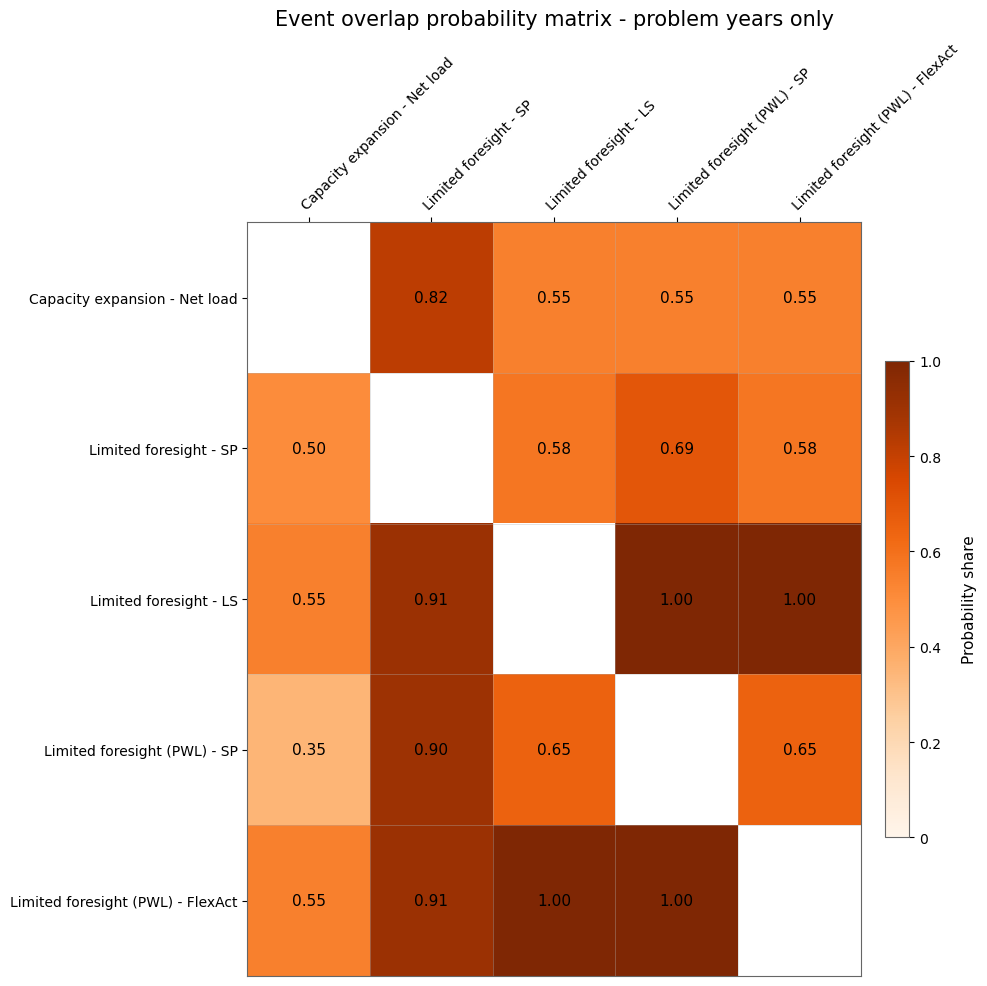

In [99]:
plot_overlap_matrix_heatmap(
    M=overlap_matrix_problem_new, 
    title="Event overlap probability matrix - problem years only",
    highlight_from=0.01,
    figure_size=(10, 10),
    annotation_fmt=".2f",
    cmap = "Oranges"
)

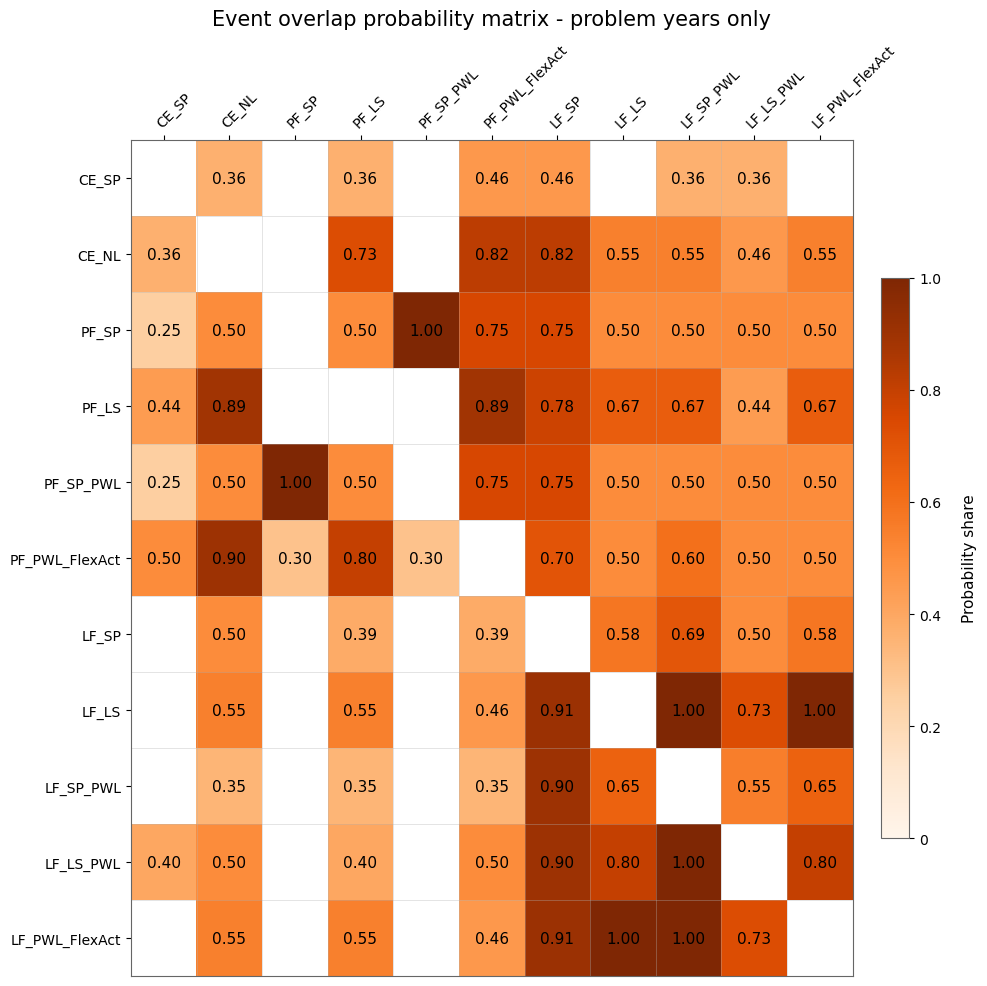

In [100]:
overlap_matrix_problem_new_full = compute_event_overlap_matrix(
    event_dicts=event_list_problems_new,
    labels=labels_problem_years_new)

plot_overlap_matrix_heatmap(
    M=overlap_matrix_problem_new_full, 
    title="Event overlap probability matrix - problem years only",
    highlight_from=0.25,
    figure_size=(10, 10),
    annotation_fmt=".2f",
    cmap = "Oranges"
)

if save_plots:
    plt.savefig(
        Figures_results_path / f"correlation_matrix_full_problem_years_{Test_name_dispatch}.pdf",
        bbox_inches="tight",
    )

##### ---- problem years from most events pr year count 

In [101]:
problem_years_rh = [1979, 1980, 1981, 1983, 1985, 1986, 1988, 1989, 1990, 1992, 1994, 1997, 2002, 2003, 2004, 2006]

# Networks filtered to problem years
networks_rh_base_filtered_problems = filter_networks_by_years(selected_networks_rh, problem_years_rh)

# CE Events filtered to problem years
ce_events_NL_filtered_problems = filter_events_by_years(ce_events_NL, problem_years_rh)
ce_events_SP_filtered_problems = filter_events_by_years(ce_events_SP, problem_years_rh)

# PF Events filtered to problem years
pf_events_SP_filtered_problems = filter_events_by_years(pf_events_SP, problem_years_rh)
pf_events_LS_filtered_problems = filter_events_by_years(pf_events_LS, problem_years_rh)

# PF PWL Events filtered to problem years
pf_events_SP_PWL_filtered_problems = filter_events_by_years(pf_events_SP_PWL, problem_years_rh)
pf_events_LS_PWL_filtered_problems = filter_events_by_years(pf_events_LS_PWL, problem_years_rh)
pf_events_PWL_FlexAct_filtered_problems = filter_events_by_years(pf_events_PWL_FlexAct, problem_years_rh)

# RH Events filtered to problem years
rh_events_SP_filtered_problems = filter_events_by_years(rh_events_SP, problem_years_rh)
rh_events_LS_filtered_problems = filter_events_by_years(rh_events_LS, problem_years_rh)

# RH PWL Events filtered to problem years
rh_events_SP_PWL_filtered_problems = filter_events_by_years(rh_events_SP_PWL, problem_years_rh)
rh_events_LS_PWL_filtered_problems = filter_events_by_years(rh_events_LS_PWL, problem_years_rh)
rh_events_PWL_FlexAct_filtered_problems = filter_events_by_years(rh_events_PWL_FlexAct, problem_years_rh)



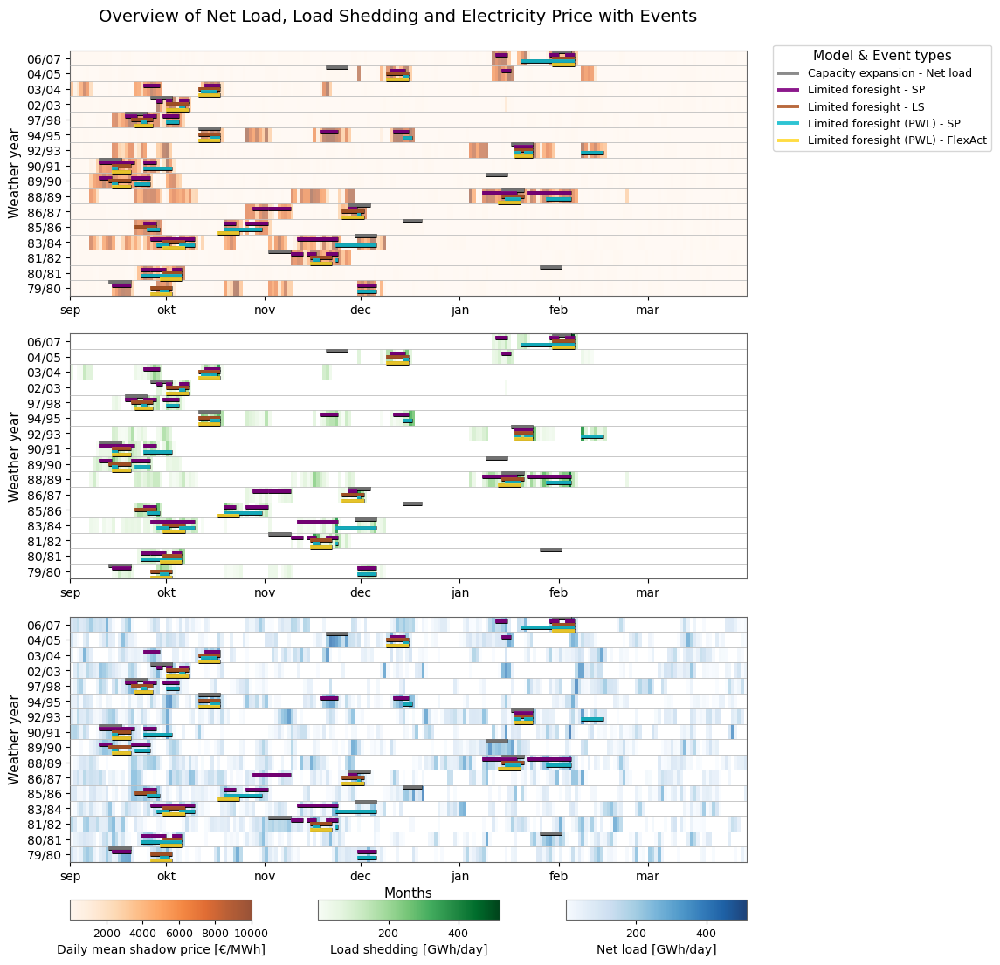

In [102]:
filtered_events = [ce_events_NL_filtered_problems, rh_events_SP_filtered_problems, rh_events_LS_filtered_problems, rh_events_SP_PWL_filtered_problems, rh_events_PWL_FlexAct_filtered_problems]
events, labels, colors = select_plot_inputs(
    events_by_key,
    keys=["CE_NL", "RH_SP", "RH_LS", "RH_SP_PWL", "RH_FlexAct_PWL"],
    label_style="medium",
    colors_by_key=COLORS_BY_KEY,)

fig, axes = plot_overview_heatmap_combined(
    selected_networks=networks_rh_base_filtered_problems,
    event_dicts=filtered_events,
    event_labels=labels,
    event_colors=colors,
    standard_year=2018,
    #start_month=6,
    agg="daily",
    figure_size=(10, 12),
    cmaps={"LS": "Greens", "SP": "Oranges", "NL": "Blues"},
    hspace = 0.2,
    suptitle = "Overview of Net Load, Load Shedding and Electricity Price with Events",
    cbar_width_ratios=(0.25, 0.5, 0.25),
    legend_y=0.965,
    end_month=3,
    start_month=9
)            

### -- Plots across events types

#### --- SP and LS 

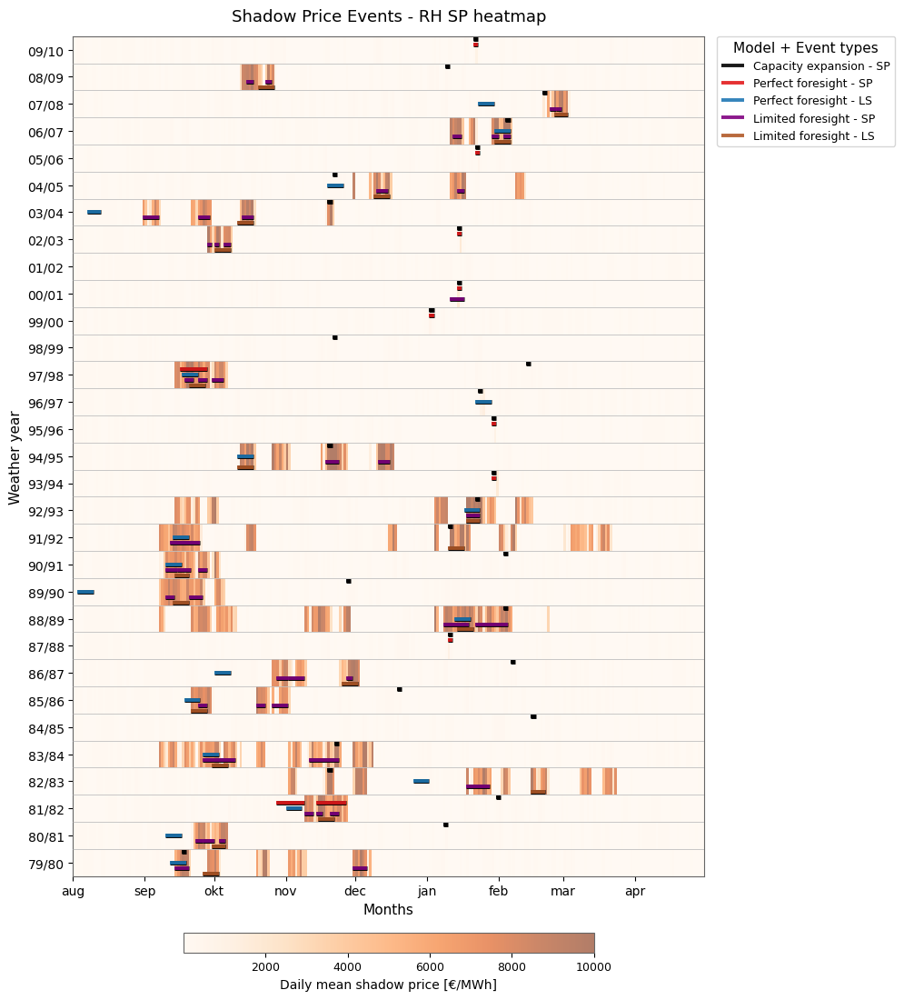

In [103]:
events, labels, colors = select_plot_inputs(
    events_by_key,
    keys=["CE_SP", "PF_SP", "PF_LS", "RH_SP", "RH_LS"],
    label_style="medium",
    colors_by_key=COLORS_BY_KEY,
)

fig, ax = plot_overview_heatmap(
    selected_networks=selected_networks_rh,
    title= "Shadow Price Events - RH SP heatmap",
    plot_type="SP",
    agg="daily", 
    event_dicts=events,
    event_labels= labels,
    event_colors= colors,
    vmin=0.01,
    vmax=None,
    heatmap_alpha=0.6,
    figure_size=(10, 12),
    log_scale=False,
    cmap="Oranges",
    start_month=8,
    end_month=4,
)

#### --- FLEX act and LS - Kan godt bruge til appendix

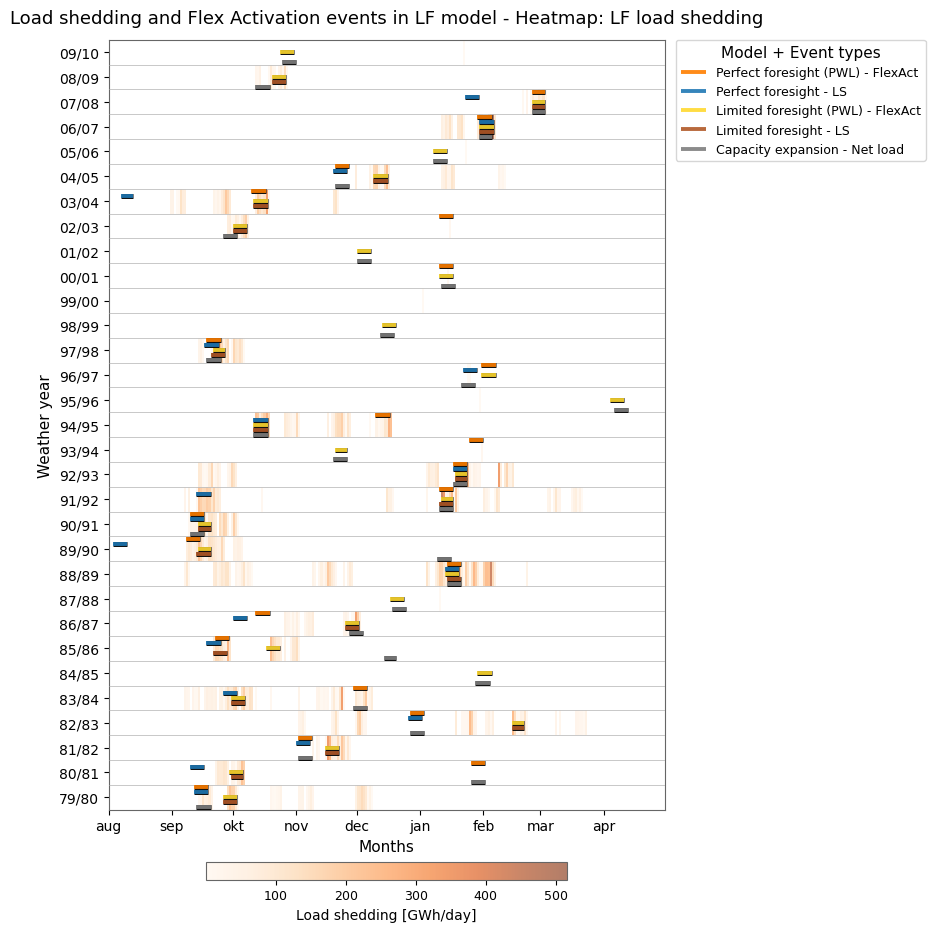

In [104]:
events, labels, colors = select_plot_inputs(
    events_by_key,
    keys=["PF_FlexAct_PWL", "PF_LS", "RH_FlexAct_PWL", "RH_LS", "CE_NL"],
    label_style="medium",
    colors_by_key=COLORS_BY_KEY,
)

fig, ax = plot_overview_heatmap(
    selected_networks=selected_networks_rh,
    title= "Load shedding and Flex Activation events in LF model - Heatmap: LF load shedding",
    plot_type="LS",
    agg="daily", 
    event_dicts=events,
    event_labels= labels,
    event_colors= colors,
    vmin=0.01,
    vmax=None,
    heatmap_alpha=0.6,
    figure_size=(8, 10),
    log_scale=False,
    cmap="Oranges",
    start_month=8,
    end_month=4,
)
if save_plots:
    plt.savefig(
        Figures_appendix_path / f"LS_vs_FlexAct_LF_heatmap_{Test_name_dispatch}.pdf",
        bbox_inches="tight",
    )


#### --- Load shedding 

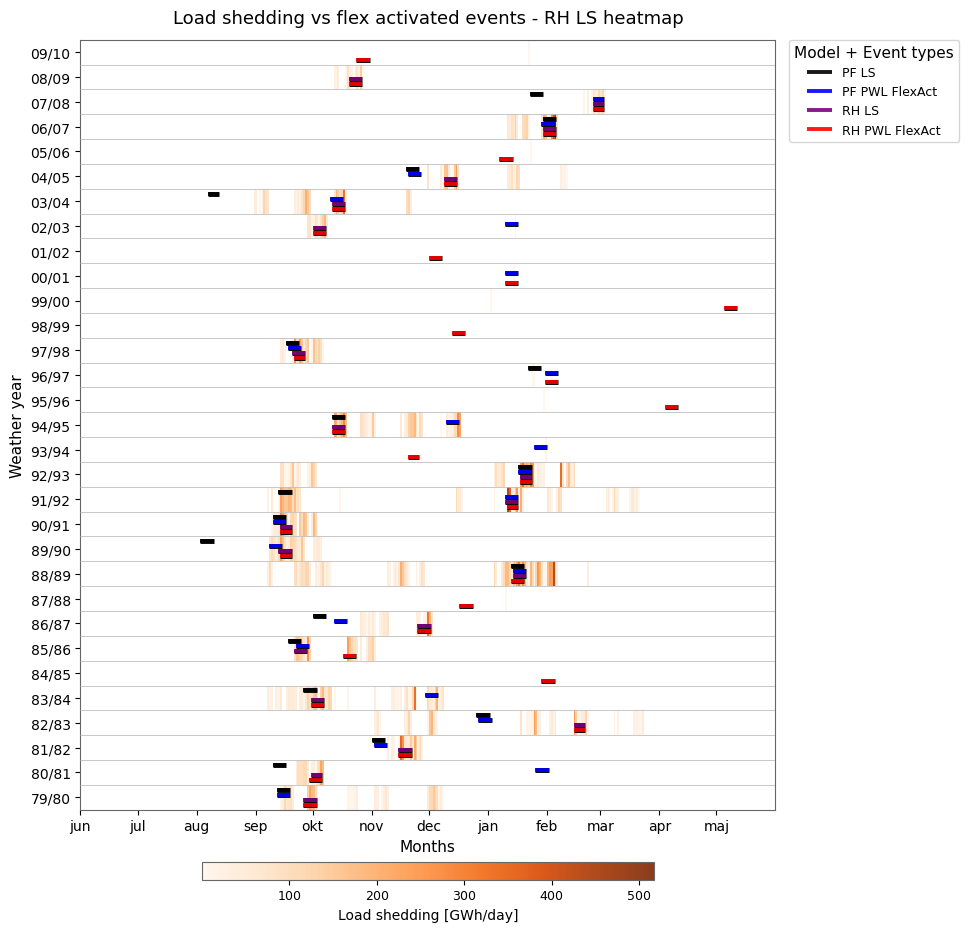

In [105]:
# LS VS PWL flex activated events comparison
events_to_plot = [pf_events_LS, pf_events_PWL_FlexAct, rh_events_LS, rh_events_PWL_FlexAct]
labels_overview_plot = ["PF LS Events", "PF PWL FlexAct Events", "RH LS Events", "RH PWL FlexAct Events"]
fig, ax = plot_overview_heatmap(
    selected_networks=selected_networks_rh,
    title= "Load shedding vs flex activated events - RH LS heatmap",
    plot_type="LS",
    show_heatmap=True,
    agg="daily", 
    event_dicts=events_to_plot,
    event_labels=labels_overview_plot,
    event_colors=["black", "blue", "purple", "red", "green"],
    vmax=None,
    heatmap_alpha=0.9,
    figure_size=(10, 10),
    cmap="Oranges",
)

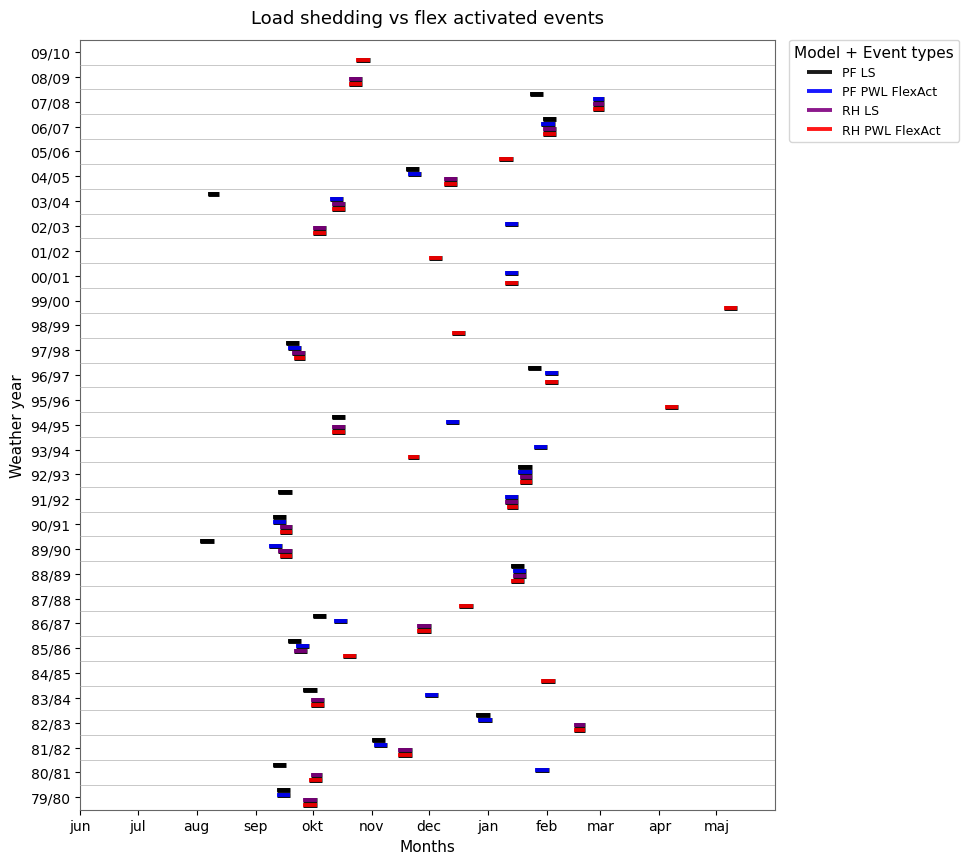

In [106]:
# LS VS PWL flex activated events comparison
events_to_plot = [pf_events_LS, pf_events_PWL_FlexAct, rh_events_LS, rh_events_PWL_FlexAct]
labels_overview_plot = ["PF LS Events", "PF PWL FlexAct Events", "RH LS Events", "RH PWL FlexAct Events"]
fig, ax = plot_overview_heatmap(
    selected_networks=selected_networks_rh,
    title= "Load shedding vs flex activated events",
    plot_type="LS",
    show_heatmap=False,
    agg="daily", 
    event_dicts=events_to_plot,
    event_labels=labels_overview_plot,
    event_colors=["black", "blue", "purple", "red", "green"],
    vmax=None,
    heatmap_alpha=0.9,
    figure_size=(10, 10),
    cmap="Oranges",
)

#### --- Net load

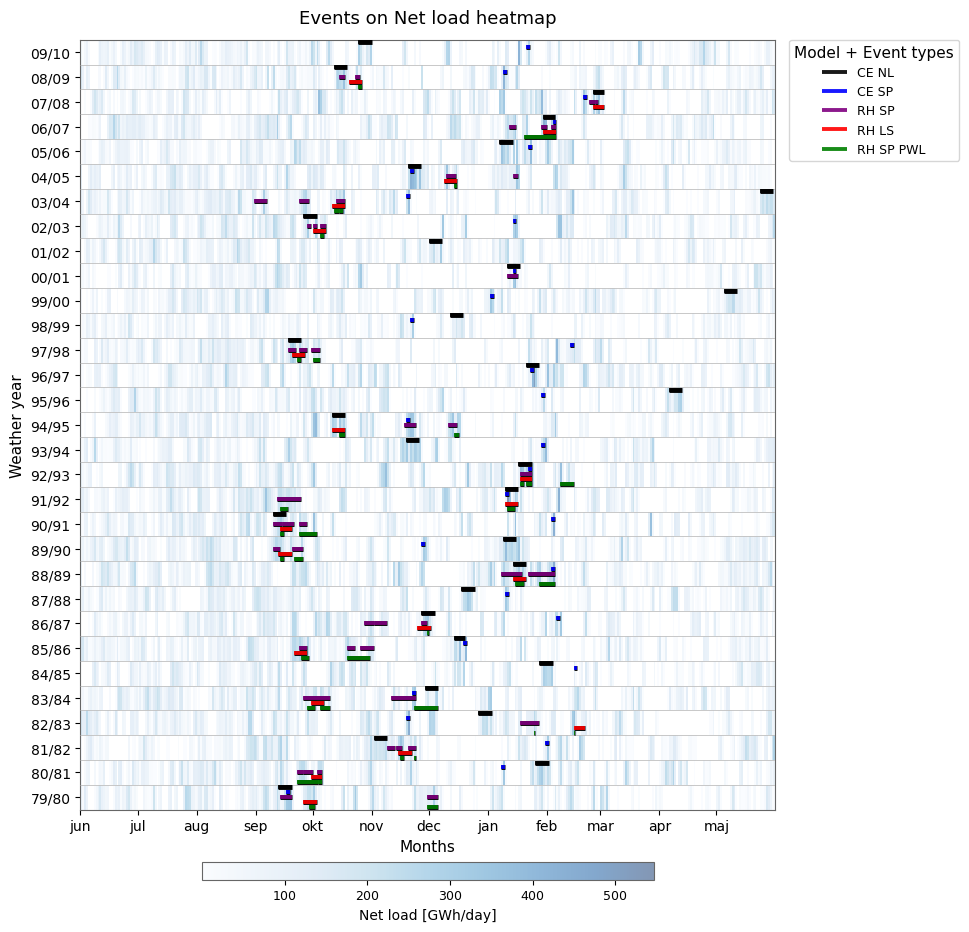

In [107]:
# LS VS PWL flex activated events comparison
events_to_plot = [ce_events_NL, ce_events_SP, rh_events_SP, rh_events_LS, rh_events_SP_PWL]
labels_overview_plot = ["CE NL Events", "CE SP Events",  "RH SP Events", "RH LS Events", "RH SP PWL Events"]
fig, ax = plot_overview_heatmap(
    selected_networks=selected_networks_rh,
    title= "Events on Net load heatmap",
    plot_type="NL",
    show_heatmap=True,
    agg="daily", 
    event_dicts=events_to_plot,
    event_labels=labels_overview_plot,
    event_colors=["black", "blue", "purple", "red", "green"],
    vmax=None,
    heatmap_alpha=0.5,
    figure_size=(10, 10),
    cmap="Blues",
)

#### --- PWL SP 

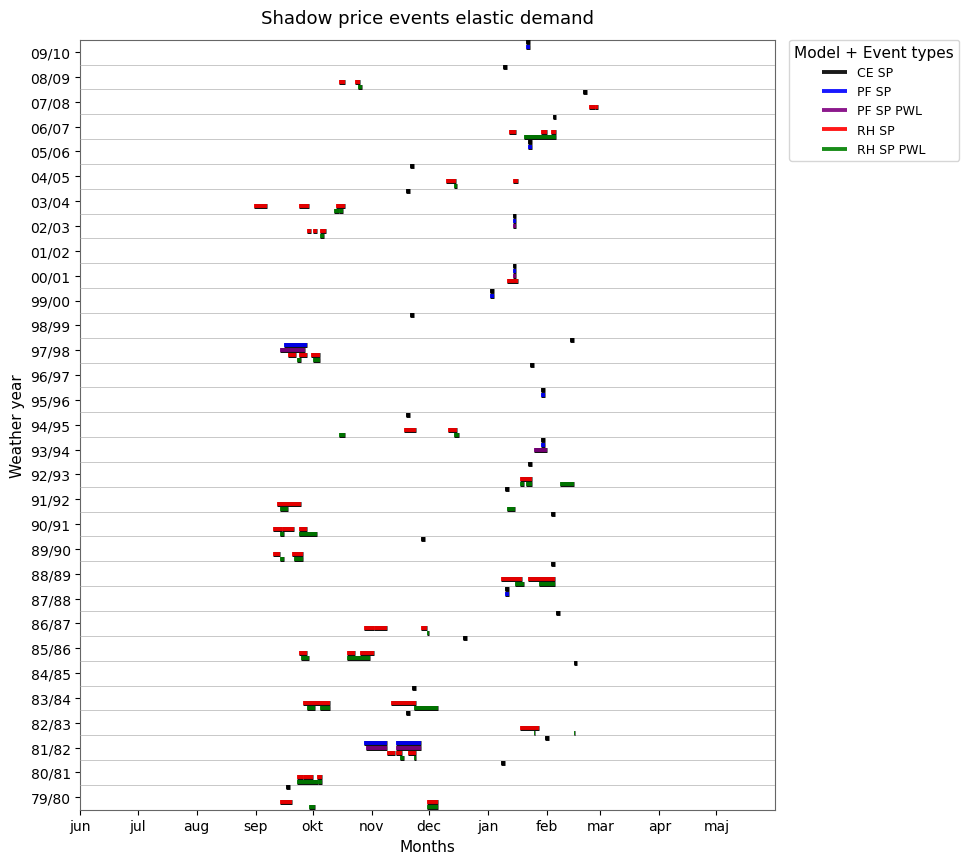

In [108]:
events_to_plot = [ce_events_SP, pf_events_SP, pf_events_SP_PWL, rh_events_SP, rh_events_SP_PWL]
labels_overview_plot = ["CE SP Events", "PF SP Events", "PF SP PWL Events", "RH SP Events", "RH SP PWL Events"]
fig, ax = plot_overview_heatmap(
    selected_networks=selected_networks_rh,
    title= "Shadow price events elastic demand",
    plot_type="SP",
    show_heatmap=False,
    agg="daily", 
    event_dicts=events_to_plot,
    event_labels=labels_overview_plot,
    event_colors=["black", "blue", "purple", "red", "green"],
    vmax=None,
    heatmap_alpha=0.9,
    figure_size=(10, 10),
    cmap="Oranges",
)

### -- Aligned plot

In [109]:
import locale

try:
    locale.setlocale(locale.LC_TIME, "en_US.UTF-8")
except locale.Error:
    locale.setlocale(locale.LC_TIME, "C")

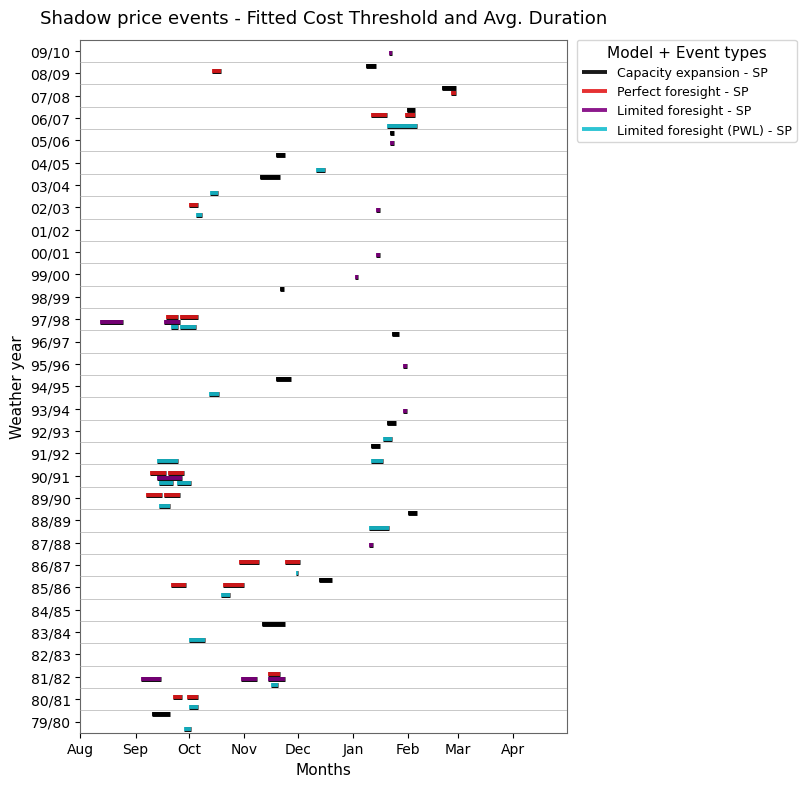

In [110]:
events, labels, colors = select_plot_inputs(
    events_by_key,
    keys=["CE_SP", "PF_SP", "RH_SP", "RH_SP_PWL"],
    label_style="medium",
    colors_by_key=COLORS_BY_KEY)

fig, ax = plot_overview_heatmap(
    selected_networks=selected_networks_rh,
    plot_type="NL",
    agg="daily", 
    title = "Shadow price events - Fitted Cost Threshold and Avg. Duration",
    event_dicts=[CE_events_SP_alligned, RH_events_SP_alligned, PF_events_SP_alligned, RH_events_SP_PWL_alligned],
    event_labels=labels,
    event_colors=colors,
    vmax=None,
    figure_size=(7, 9),
    show_heatmap=False,
    heatmap_alpha = 0.4,
    offset_step=0.23,
    start_month=8,
    end_month=4,
)

if save_plots:
    plt.savefig(
        Figures_results_path / "fitted_threshold_duration_T35_PFt15_v1.pdf",
        bbox_inches="tight",
    )

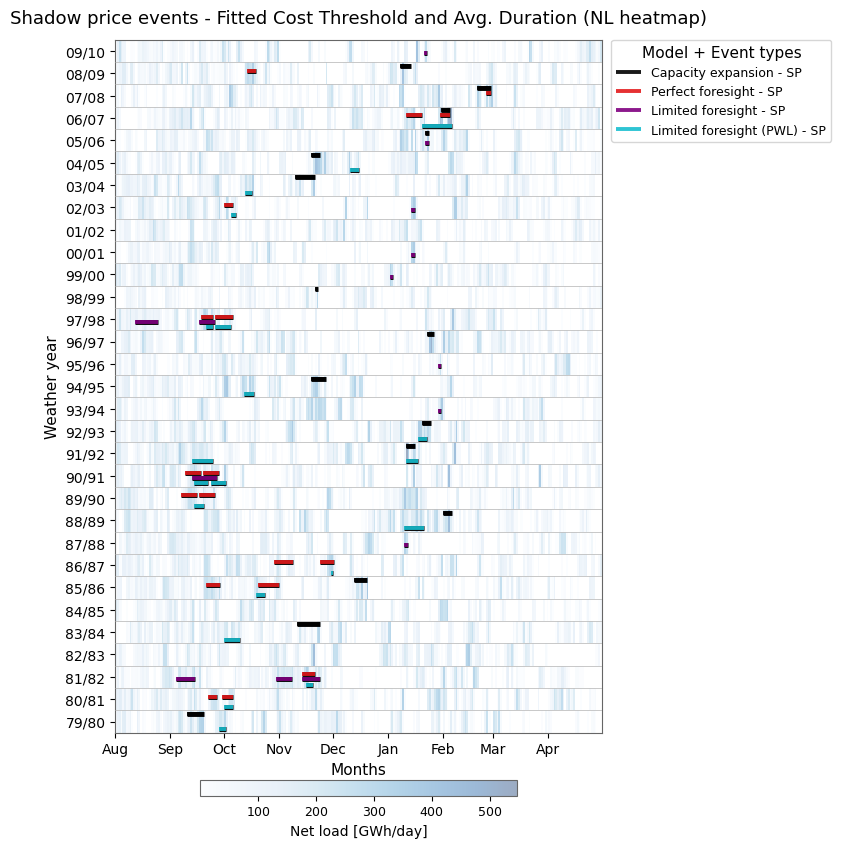

In [111]:
events, labels, colors = select_plot_inputs(
    events_by_key,
    keys=["CE_SP", "PF_SP", "RH_SP", "RH_SP_PWL"],
    label_style="medium",
    colors_by_key=COLORS_BY_KEY)

fig, ax = plot_overview_heatmap(
    selected_networks=selected_networks_rh,
    plot_type="NL",
    agg="daily", 
    title = "Shadow price events - Fitted Cost Threshold and Avg. Duration (NL heatmap)",
    event_dicts=[CE_events_SP_alligned, RH_events_SP_alligned, PF_events_SP_alligned, RH_events_SP_PWL_alligned],
    event_labels=labels,
    event_colors=colors,
    vmax=None,
    figure_size=(7, 9),
    show_heatmap=True,
    heatmap_alpha = 0.4,
    offset_step=0.23,
    start_month=8,
    end_month=4,
)

# save_plots=False
if save_plots:
    plt.savefig(
        Figures_results_path / "fitted_threshold_duration_T35_PFt15_v2.pdf",
        bbox_inches="tight",
    )


### -- Aligned matrix and plot

#### --- the matrix

In [112]:
event_dicts_alligned=[CE_events_SP_alligned, RH_events_SP_alligned, PF_events_SP_alligned, PF_events_SP_PWL_alligned, RH_events_SP_PWL_alligned, RH_events_LS_alligned]
event_labels_alligned=["CE SP Events", "RH SP Events", "PF SP Events", "PF SP PWL Events", "RH SP PWL Events", "RH LS Events"]

# Gather events for overlap matrix computation
labels_overlap = ["CE_SP", "CE_NL", "PF_SP", "PF_LS", "PF_SP_PWL", "PF_FlexAct_PWL", "RH_SP", "RH_LS", "RH_SP_PWL","RH_FlexAct_PWL"]
events_overlap_list = [ce_events_SP, ce_events_NL, pf_events_SP, pf_events_LS, pf_events_SP_PWL, 
                    pf_events_PWL_FlexAct, rh_events_SP, rh_events_LS, rh_events_SP_PWL, rh_events_PWL_FlexAct]

overlap_matrix_alligned = compute_event_overlap_matrix(
    event_dicts=event_dicts_alligned,
    labels=event_labels_alligned
)
overlap_matrix_alligned

,CE SP Events,RH SP Events,PF SP Events,PF SP PWL Events,RH SP PWL Events,RH LS Events
CE SP Events,1.000,0.133,0.067,0.000,0.200,0.267
RH SP Events,0.111,1.000,0.222,0.222,0.667,0.722
PF SP Events,0.071,0.214,1.000,0.643,0.214,0.214
PF SP PWL Events,0.000,0.273,0.818,1.000,0.273,0.273
RH SP PWL Events,0.150,0.550,0.250,0.200,1.000,0.850
RH LS Events,0.200,0.500,0.150,0.150,0.800,1.000


#### --- Probability plot 

(<Figure size 1000x1000 with 2 Axes>,
 <Axes: title={'center': 'Event overlap probability matrix - Aligned events'}>)

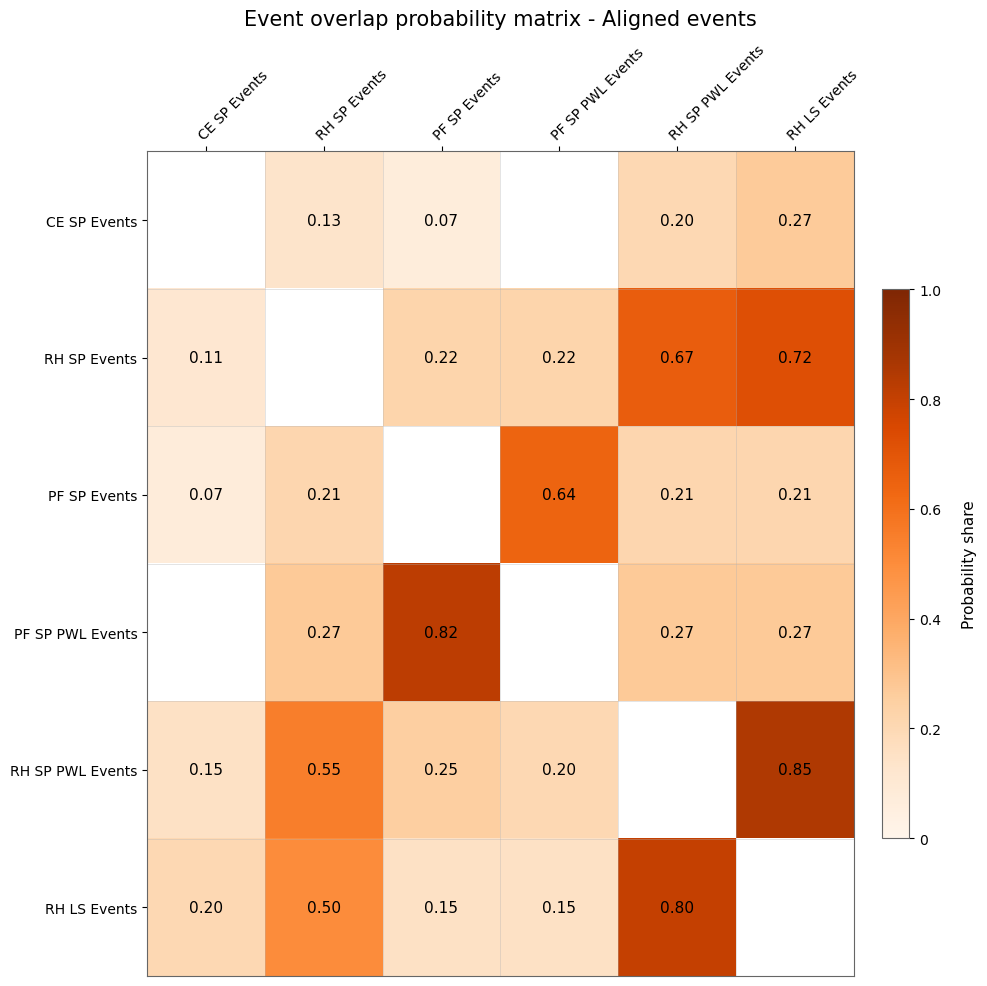

In [113]:
plot_overlap_matrix_heatmap(
    M=overlap_matrix_alligned, 
    title="Event overlap probability matrix - Aligned events",
    highlight_from=0.01,
    figure_size=(10, 10),
    annotation_fmt=".2f",
    cmap = "Oranges"
)

## - Event overlap correlation analysis

### -- Creating the matrix

In [114]:
# Gather events for overlap matrix computation
labels_overlap = [
    "CE_SP",
    "CE_NL",
    "PF_SP",
    "PF_LS",
    "PF_SP_PWL",
    "PF_FlexAct_PWL",
    "LF_SP",
    "LF_LS",
    "LF_SP_PWL",
    "LF_LS_PWL",
    "LF_FlexAct_PWL",]
    
events_overlap_list = [
    ce_events_SP,
    ce_events_NL,
    pf_events_SP,
    pf_events_LS,
    pf_events_SP_PWL,
    pf_events_PWL_FlexAct,
    rh_events_SP,
    rh_events_LS,
    rh_events_SP_PWL,
    rh_events_LS_PWL,
    rh_events_PWL_FlexAct,
]

overlap_matrix = compute_event_overlap_matrix(
    event_dicts=events_overlap_list,
    labels=labels_overlap
)
overlap_matrix

,CE_SP,CE_NL,PF_SP,PF_LS,PF_SP_PWL,PF_FlexAct_PWL,LF_SP,LF_LS,LF_SP_PWL,LF_LS_PWL,LF_FlexAct_PWL
CE_SP,1.000,0.267,0.267,0.167,0.100,0.267,0.233,0.100,0.167,0.167,0.133
CE_NL,0.258,1.000,0.097,0.355,0.097,0.452,0.387,0.323,0.290,0.226,0.645
PF_SP,0.727,0.273,1.000,0.182,0.545,0.455,0.364,0.182,0.182,0.182,0.273
PF_LS,0.263,0.579,0.105,1.000,0.105,0.526,0.474,0.421,0.474,0.211,0.368
PF_SP_PWL,0.500,0.500,1.000,0.333,1.000,0.833,0.667,0.333,0.333,0.333,0.500
PF_FlexAct_PWL,0.364,0.636,0.227,0.455,0.227,1.000,0.591,0.455,0.500,0.409,0.500
LF_SP,0.149,0.362,0.128,0.255,0.128,0.362,1.000,0.511,0.660,0.426,0.532
LF_LS,0.150,0.500,0.100,0.400,0.100,0.500,0.800,1.000,0.950,0.650,0.950
LF_SP_PWL,0.143,0.286,0.086,0.286,0.086,0.371,0.857,0.657,1.000,0.514,0.657
LF_LS_PWL,0.278,0.389,0.111,0.222,0.111,0.500,0.889,0.722,0.944,1.000,0.667


### -- Plot Probability matrix (with heatmap)

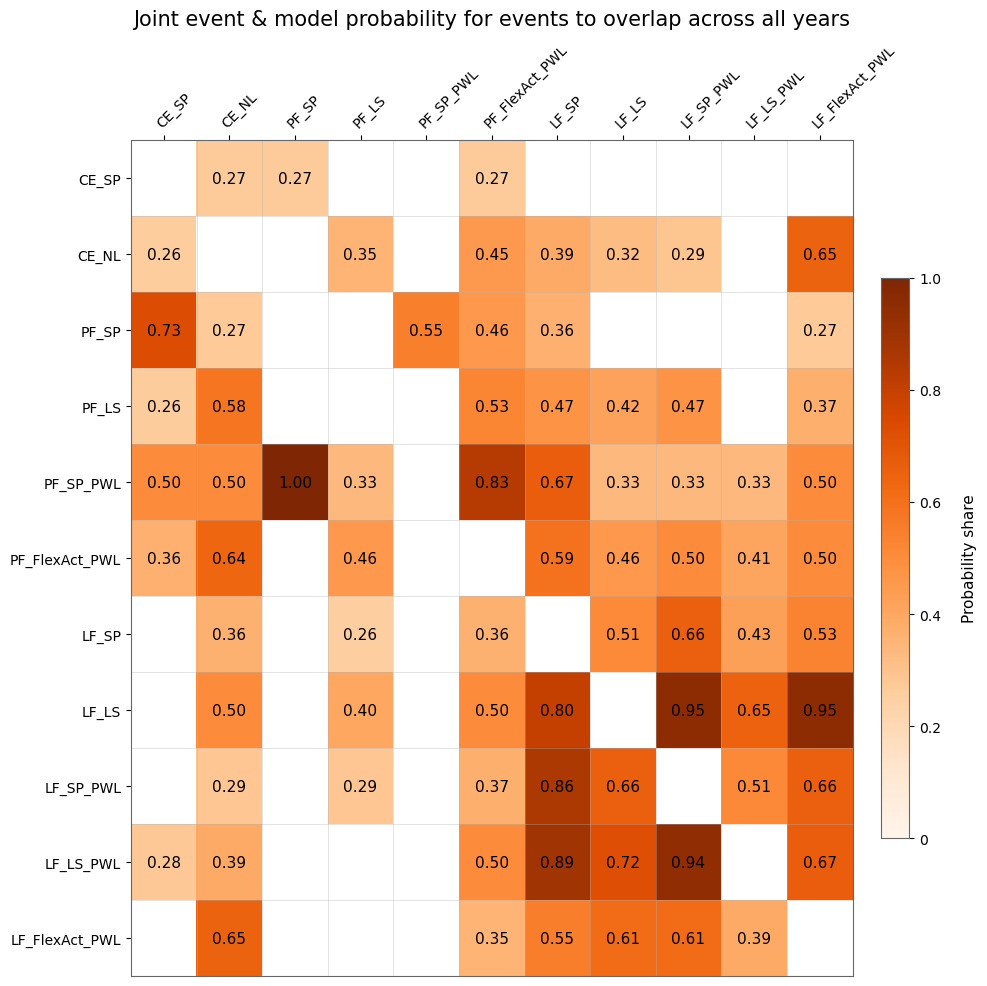

In [115]:
plot_overlap_matrix_heatmap(
    overlap_matrix,
    title="Joint event & model probability for events to overlap across all years",
    highlight_from=0.25,
    figure_size=(10, 10),
    annotation_fmt=".2f",
    cmap = "Oranges"
)

if save_plots:
    plt.savefig(
        Figures_results_path / f"correlation_matrix_full_{Test_name_dispatch}.pdf",
        bbox_inches="tight",
    )

In [116]:
def plot_overlap_matrix_heatmap(
    M: pd.DataFrame,
    title: str,
    figure_size: Tuple[float, float] = (10, 8),
    cmap: str = "Oranges",
    highlight_from: float = 0.6,
    annotation_fmt: str = ".2f",
    rotate_xticks: int = 45,
    savepath: Optional[str] = None
) -> Tuple[plt.Figure, plt.Axes]:
    """
    Heatmap for asymmetric event overlap matrix.
    Diagonal (self-overlap) is removed (white, no annotation).
    """

    A = M.to_numpy().copy()

    diag_mask = np.eye(A.shape[0], dtype=bool)
    low_mask = A < highlight_from

    A_plot = A.copy()
    A_plot[low_mask] = np.nan
    A_plot[diag_mask] = np.nan

    fig, ax = plt.subplots(figsize=figure_size)

    cm = mpl.colormaps.get_cmap(cmap).copy()
    cm.set_bad("white")

    norm = Normalize(vmin=0.0, vmax=1.0, clip=False)

    im = ax.imshow(
        A_plot,
        cmap=cm,
        norm=norm,
        interpolation="nearest",
        aspect="auto"
    )

    ax.set_title(title, fontsize=FIGURE_TITLE_FONTSIZE)
    ax.set_xticks(np.arange(M.shape[1]))
    ax.set_yticks(np.arange(M.shape[0]))
    ax.set_xticklabels(M.columns)
    ax.set_yticklabels(M.index)

    ax.tick_params(top=True, bottom=False, labeltop=True, labelbottom=False)
    plt.setp(
        ax.get_xticklabels(),
        rotation=rotate_xticks,
        ha="left",
        rotation_mode="anchor"
    )

    cbar = fig.colorbar(im, ax=ax, fraction=0.034, pad=0.037)
    cbar.set_label("Probability share", labelpad=15)
    cbar.set_ticks([0, 0.2, 0.4, 0.6, 0.8, 1.0])
    cbar.ax.set_yticklabels(['0', '0.2', '0.4', '0.6', '0.8', '1.0'])

    # annotate only non-diagonal, non-masked values
    for i in range(M.shape[0]):
        for j in range(M.shape[1]):
            if diag_mask[i, j]:
                continue
            v = M.iat[i, j]
            if v >= highlight_from:
                ax.text(j, i, format(v, annotation_fmt), ha="center", va="center")

    # grid between cells
    ax.set_xticks(np.arange(M.shape[1] + 1) - 0.5, minor=True)
    ax.set_yticks(np.arange(M.shape[0] + 1) - 0.5, minor=True)
    ax.grid(which="minor", linestyle="-", linewidth=0.5)
    ax.tick_params(which="minor", bottom=False, left=False)

    # KEEP outer frame
    for spine in ax.spines.values():
        spine.set_visible(True)
        spine.set_linewidth(0.8)

    fig.tight_layout()

    if savepath is not None:
        fig.savefig(savepath, bbox_inches="tight")

    return fig, ax

### -- Problematic years from max yearly event numbers

### -- Tabels for analysing problematic years

In [117]:
# Filtered
no_of_tot_events_filter = 8 
event_counts_pr_year[event_counts_pr_year.iloc[:,0]>=no_of_tot_events_filter]

problem_years = weather_years[event_counts_pr_year.iloc[:,0]>=no_of_tot_events_filter].to_list()

no_of_tot_events_filter_2 = 10 
event_counts_pr_year[event_counts_pr_year.iloc[:,0]>=no_of_tot_events_filter_2]

problem_years_2 = weather_years[event_counts_pr_year.iloc[:,0]>=no_of_tot_events_filter_2].to_list()

### -- Filtering events on problematic years

In [118]:
labels_problem_y = ["CE_SP", "CE_NL", "PF_SP", "PF_LS", "PF_SP_PWL", "PF_PWL_FlexAct", "RH_SP", "RH_LS", "RH_SP_PWL","RH_PWL_FlexAct"]
events_list = [ce_events_SP, ce_events_NL, pf_events_SP, pf_events_LS, pf_events_SP_PWL, 
                    pf_events_PWL_FlexAct, rh_events_SP, rh_events_LS, rh_events_SP_PWL, rh_events_PWL_FlexAct]

ce_events_SP_problem = filter_events_by_years(ce_events_SP, problem_years)
ce_events_NL_problem = filter_events_by_years(ce_events_NL, problem_years)

pf_events_SP_problem = filter_events_by_years(pf_events_SP, problem_years)
pf_events_LS_problem = filter_events_by_years(pf_events_LS, problem_years)
pf_events_PWL_FlexAct_problem = filter_events_by_years(pf_events_PWL_FlexAct, problem_years)

rh_events_SP_problem = filter_events_by_years(rh_events_SP, problem_years)
rh_events_LS_problem = filter_events_by_years(rh_events_LS, problem_years)
rh_events_SP_PWL_problem = filter_events_by_years(rh_events_SP_PWL, problem_years)
rh_events_PWL_FlexAct_problem = filter_events_by_years(rh_events_PWL_FlexAct, problem_years)

event_problem_dict_list = [
    filter_events_by_years(d, problem_years)
    for d in events_list
]

### -- Probability plot for problematic years

In [119]:
overlap_matrix_problem = compute_event_overlap_matrix(
    event_dicts=event_problem_dict_list,
    labels=labels_problem_y
)
overlap_matrix_problem

,CE_SP,CE_NL,PF_SP,PF_LS,PF_SP_PWL,PF_PWL_FlexAct,RH_SP,RH_LS,RH_SP_PWL,RH_PWL_FlexAct
CE_SP,1.000,0.316,0.053,0.211,0.053,0.316,0.316,0.158,0.263,0.158
CE_NL,0.316,1.000,0.105,0.526,0.105,0.684,0.526,0.526,0.474,0.526
PF_SP,0.250,0.500,1.000,0.500,1.000,0.750,0.750,0.500,0.500,0.500
PF_LS,0.222,0.556,0.111,1.000,0.111,0.556,0.500,0.444,0.500,0.389
PF_SP_PWL,0.250,0.500,1.000,0.500,1.000,0.750,0.750,0.500,0.500,0.500
PF_PWL_FlexAct,0.316,0.684,0.158,0.526,0.158,1.000,0.632,0.526,0.579,0.474
RH_SP,0.136,0.341,0.114,0.273,0.114,0.364,1.000,0.523,0.682,0.523
RH_LS,0.158,0.526,0.105,0.421,0.105,0.526,0.789,1.000,0.947,0.947
RH_SP_PWL,0.147,0.294,0.088,0.294,0.088,0.382,0.853,0.647,1.000,0.647
RH_PWL_FlexAct,0.158,0.526,0.105,0.368,0.105,0.474,0.789,0.947,0.947,1.000


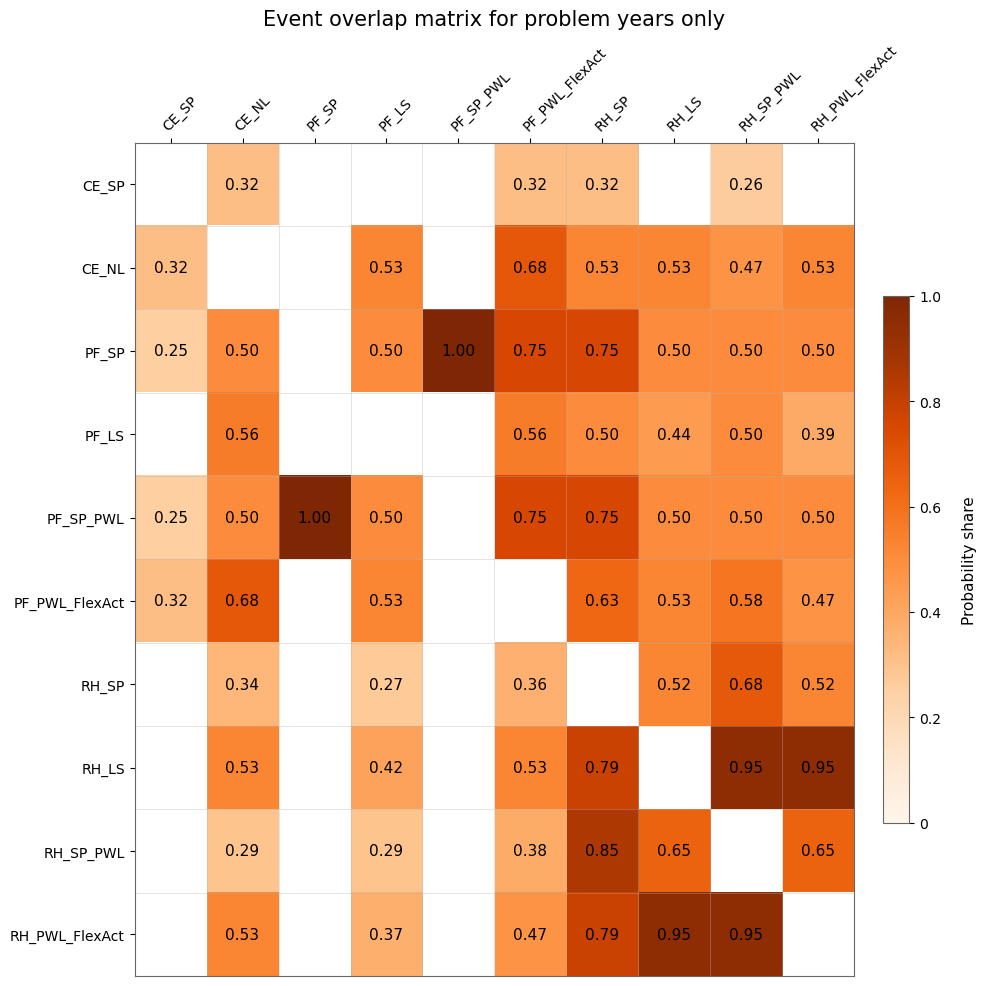

In [120]:
plot_overlap_matrix_heatmap(
    overlap_matrix_problem,
    title="Event overlap matrix for problem years only",
    highlight_from=0.25,
    figure_size=(10, 10),
    annotation_fmt=".2f",
    cmap = "Oranges"
)


if save_plots:
    plt.savefig(
        Figures_results_path / f"correlation_matrix_full_{Test_name_dispatch}.pdf",
        bbox_inches="tight",
    )

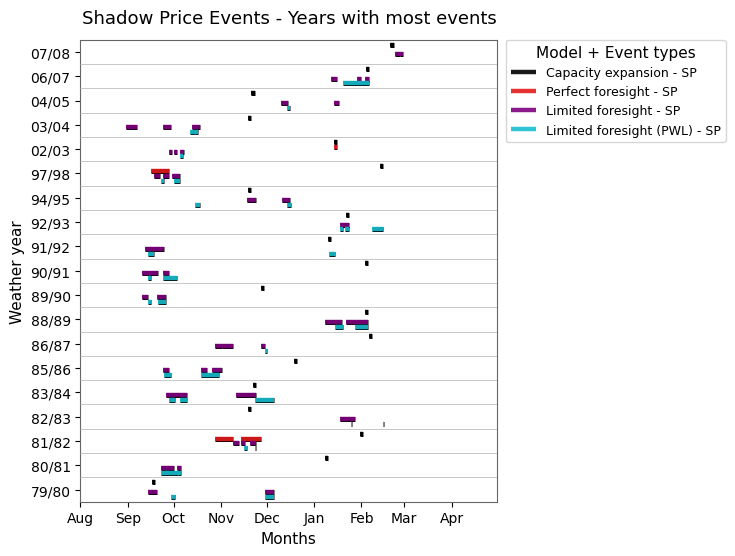

In [121]:
events, networks, labels, colors = select_plot_inputs_filter(
    events_by_key=events_by_key,
    networks_by_key=networks_rh_base,
    keys=["CE_SP", "PF_SP", "RH_SP", "RH_SP_PWL"],
    label_style="medium",
    colors_by_key=COLORS_BY_KEY,
    year_list=problem_years,
)

fig, ax = plot_overview_heatmap(
    selected_networks=networks,
    title= "Shadow Price Events - Years with most events",
    plot_type="SP",
    agg="daily", 
    event_dicts=events,
    event_labels= labels,
    event_colors= colors,
    vmin=0.01,
    vmax=None,
    event_linewidth=3.2,
    event_edge_width=0.4,
    show_heatmap=False,
    heatmap_alpha=0.6,
    figure_size=(6, 6),
    log_scale=False,
    cmap="Oranges",
    start_month=8,
    end_month=4
)

# Combined analysis LDES, flexible demand and extreme events

## - Storage operation plots 

#### --- SOC operation all years 

In [122]:
# Making sure date formatting is english
import locale

try:
    locale.setlocale(locale.LC_TIME, "en_US.UTF-8")
except locale.Error:
    locale.setlocale(locale.LC_TIME, "C")

c:\Users\jonat\OneDrive - Danmarks Tekniske Universitet\Skrivebord\Speciale\Master-Thesis-Jonathan-Gadfelt\functions_plots.py:2296: UserWarning:

This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.

c:\Users\jonat\OneDrive - Danmarks Tekniske Universitet\Skrivebord\Speciale\Master-Thesis-Jonathan-Gadfelt\functions_plots.py:2311: UserWarning:

The figure layout has changed to tight



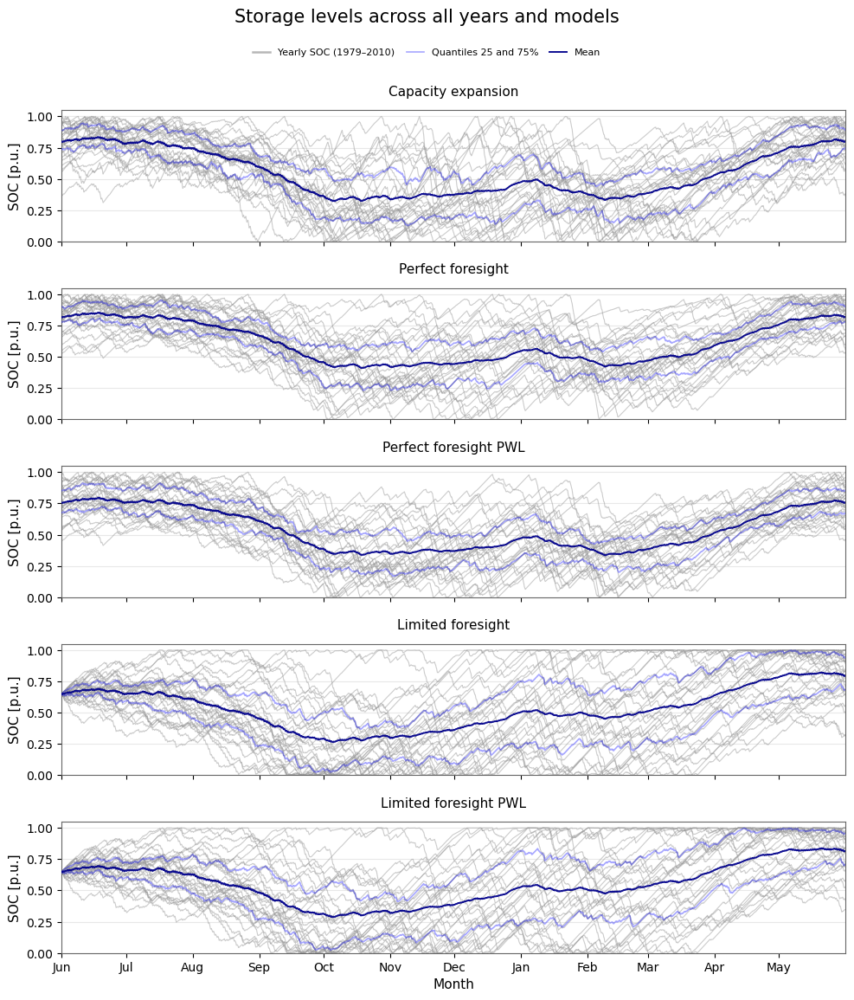

In [124]:
groups = [
    {"networks": networks_exp_base, "title": "Capacity expansion"},
    {"networks": networks_pf_base, "title": "Perfect foresight"},
    {"networks": networks_pf_base_PWL, "title": "Perfect foresight PWL"},
    {"networks": networks_rh_base, "title": "Limited foresight"},
    {"networks": networks_rh_base_PWL, "title": "Limited foresight PWL"},
]

fig, axes = plot_store_operation_groups(
    groups,
    mode="stacked",
    carrier="hydrogen storage",
    normalized=True,
    plot_mean=True,
    plot_quantiles=True,
    color_yearly_soc="0.6",
    q_low=0.25,
    q_high=0.75,
    alpha=0.5,
    mean_alpha=0.95,
    legend_yearly_label="Yearly SOC (1979–2010)",
    legend_mean_label="Mean",
    figure_size=(10, 12),
    figure_title="Storage levels across all years and models",
    legend_loc="upper",
    legend_ncol=3,
    color_quantiles="blue",
    quantile_alpha= 0.35,
    linewidth=0.8,
    mean_linewidth=1.4,
    quantile_linewidth= 1.2,
)
if save_plots:
    plt.savefig(
        Figures_results_path / f"SOC_operation_all_models_{Test_name_dispatch}.pdf",
        bbox_inches="tight",
    )



##### ---- problem years event number >=8

c:\Users\jonat\OneDrive - Danmarks Tekniske Universitet\Skrivebord\Speciale\Master-Thesis-Jonathan-Gadfelt\functions_plots.py:2296: UserWarning:

This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.

c:\Users\jonat\OneDrive - Danmarks Tekniske Universitet\Skrivebord\Speciale\Master-Thesis-Jonathan-Gadfelt\functions_plots.py:2311: UserWarning:

The figure layout has changed to tight



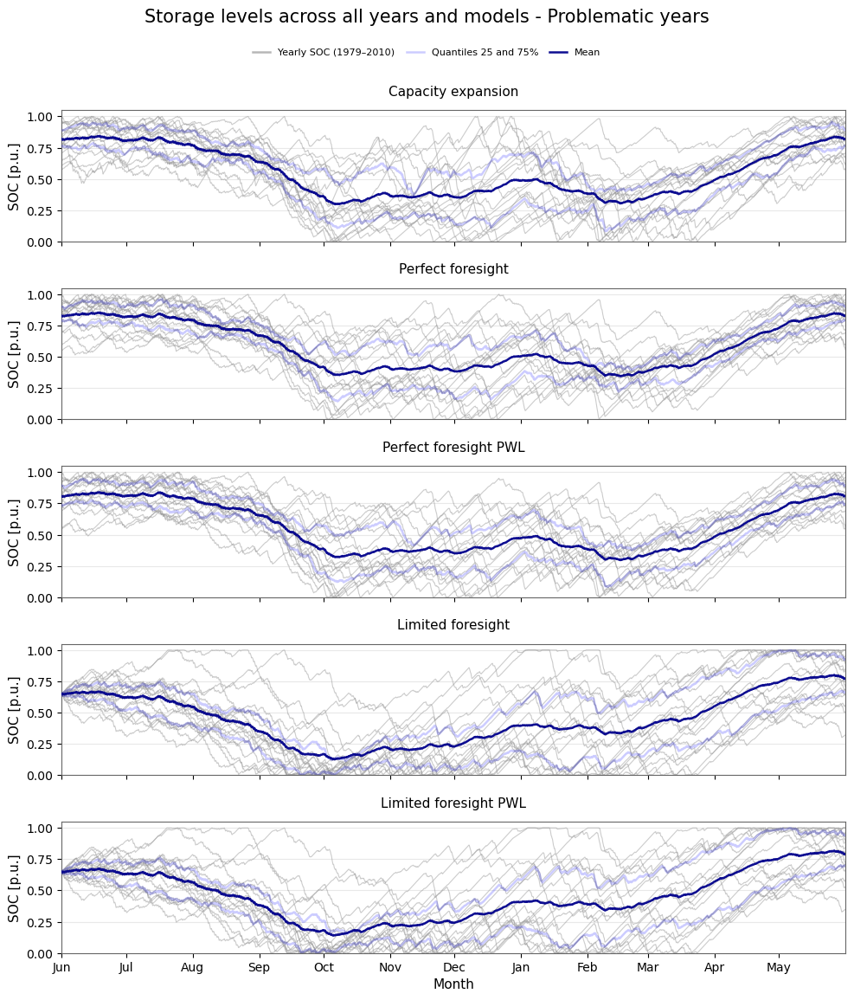

In [125]:
no_of_tot_events_filter = 8 
event_counts_pr_year[event_counts_pr_year.iloc[:,0]>=no_of_tot_events_filter]

problem_years = weather_years[event_counts_pr_year.iloc[:,0]>=no_of_tot_events_filter].to_list()

# Networks filtered to problem years 
groups = [
    {"networks": filter_networks_by_years(networks_exp_base, problem_years), "title": "Capacity expansion"},
    {"networks": filter_networks_by_years(networks_pf_base, problem_years), "title": "Perfect foresight"},
    {"networks": filter_networks_by_years(networks_pf_base_PWL, problem_years), "title": "Perfect foresight PWL"},
    {"networks": filter_networks_by_years(selected_networks_rh, problem_years), "title": "Limited foresight"},
    {"networks": filter_networks_by_years(networks_rh_base_PWL, problem_years), "title": "Limited foresight PWL"},
]

fig, axes = plot_store_operation_groups(
    groups,
    mode="stacked",
    carrier="hydrogen storage",
    normalized=True,
    plot_mean=True,
    plot_quantiles=True,
    color_yearly_soc="0.6",
    quantile_alpha= 0.2,
    q_low=0.25,
    q_high=0.75,
    alpha=0.5,
    mean_alpha=0.95,
    legend_yearly_label="Yearly SOC (1979–2010)",
    legend_mean_label="Mean",
    figure_size=(10, 12),
    figure_title="Storage levels across all years and models - Problematic years",
    legend_loc="upper",
    legend_ncol=3,
    linewidth=0.8,
    mean_linewidth=1.8,
)

##### ---- problem years 2 - events >= 10 

c:\Users\jonat\OneDrive - Danmarks Tekniske Universitet\Skrivebord\Speciale\Master-Thesis-Jonathan-Gadfelt\functions_plots.py:2296: UserWarning:

This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.

c:\Users\jonat\OneDrive - Danmarks Tekniske Universitet\Skrivebord\Speciale\Master-Thesis-Jonathan-Gadfelt\functions_plots.py:2311: UserWarning:

The figure layout has changed to tight



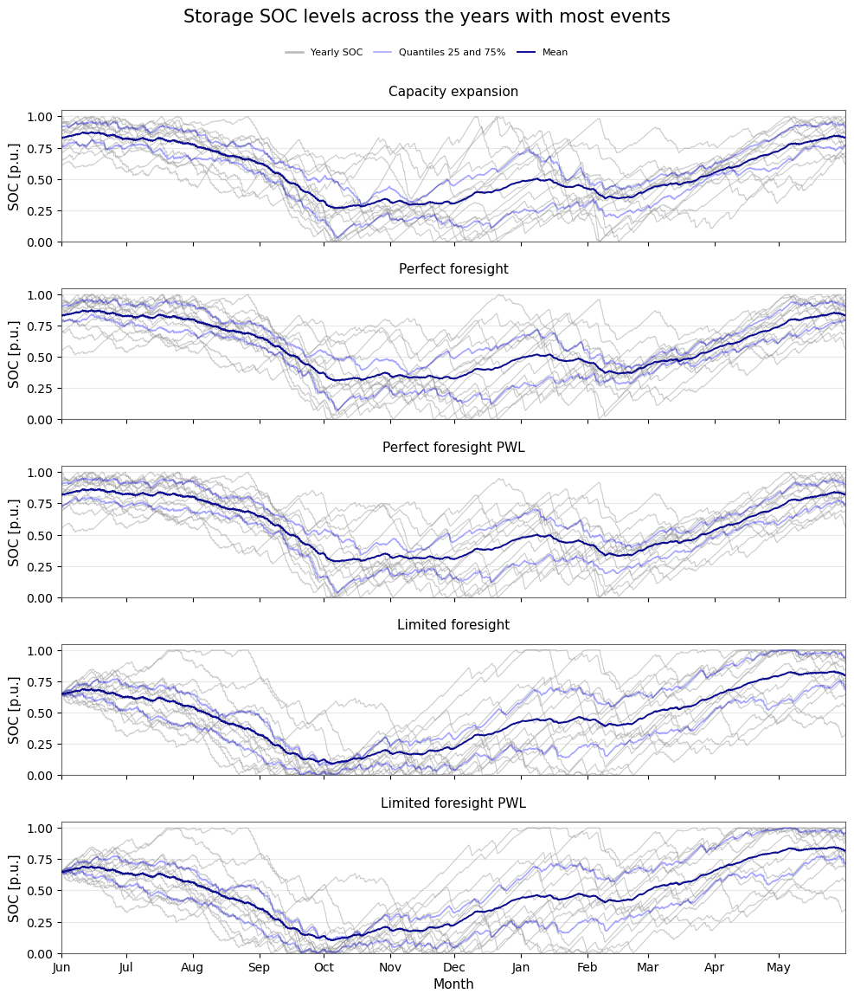

In [126]:
no_of_tot_events_filter_2 = 10 
event_counts_pr_year[event_counts_pr_year.iloc[:,0]>=no_of_tot_events_filter_2]

problem_years_2 = weather_years[event_counts_pr_year.iloc[:,0]>=no_of_tot_events_filter_2].to_list()

# Networks filtered to problem years 
groups = [
    {"networks": filter_networks_by_years(networks_exp_base, problem_years_2), "title": "Capacity expansion"},
    {"networks": filter_networks_by_years(networks_pf_base, problem_years_2), "title": "Perfect foresight"},
    {"networks": filter_networks_by_years(networks_pf_base_PWL, problem_years_2), "title": "Perfect foresight PWL"},
    {"networks": filter_networks_by_years(selected_networks_rh, problem_years_2), "title": "Limited foresight"},
    {"networks": filter_networks_by_years(networks_rh_base_PWL, problem_years_2), "title": "Limited foresight PWL"},
]

fig, axes = plot_store_operation_groups(
    groups,
    mode="stacked",
    carrier="hydrogen storage",
    normalized=True,
    plot_mean=True,
    plot_quantiles=True,
    color_yearly_soc="0.6",
    q_low=0.25,
    q_high=0.75,
    alpha=0.5,
    mean_alpha=0.95,
    legend_yearly_label="Yearly SOC",
    legend_mean_label="Mean",
    figure_size=(10, 12),
    figure_title="Storage SOC levels across the years with most events",
    legend_loc="upper",
    legend_ncol=3,
    color_quantiles="blue",
    quantile_alpha= 0.35,
    linewidth=0.8,
    mean_linewidth=1.4,
    quantile_linewidth= 1.2,
)

# plt.savefig(
#     Figures_results_path / f"SOC_operation_all_models_problem_years_{Test_name_dispatch}.pdf",
#     bbox_inches="tight",
# )

if save_plots:
    plt.savefig(
        Figures_results_path / f"SOC_operation_all_models_problem_years_{Test_name_dispatch}.pdf",
        bbox_inches="tight",
    )

### -- On year across all models, also showing chargeing/discharging 

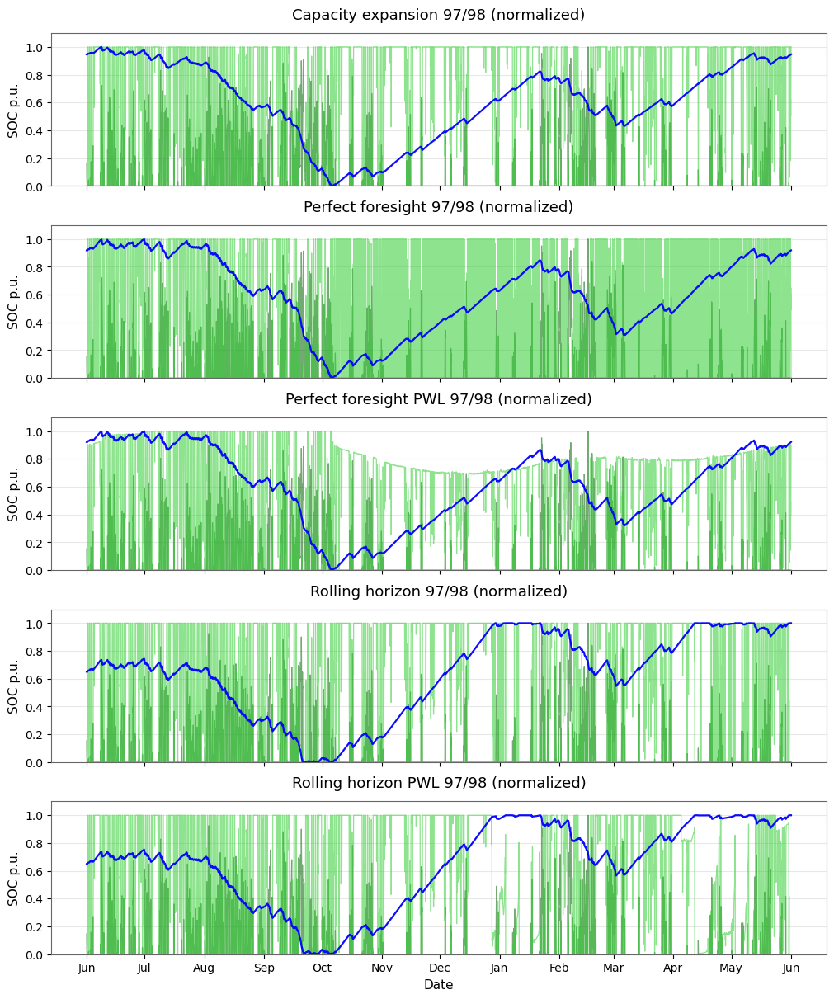

In [127]:
Year = 1997

groups = [
    {"networks": networks_exp_base[Year], "title": "Capacity expansion"},
    {"networks": networks_pf_base[Year], "title": "Perfect foresight"},
    {"networks": networks_pf_base_PWL[Year], "title": "Perfect foresight PWL"},
    {"networks": networks_rh_base[Year], "title": "Rolling horizon"},
    {"networks": networks_rh_base_PWL[Year], "title": "Rolling horizon PWL"},
]

fig, axes = plot_h2_multi(Year, groups, show_links=True, show_soc=True, same_axes=False,
    figure_size = (10, 12)
)


## - SOC + event plot

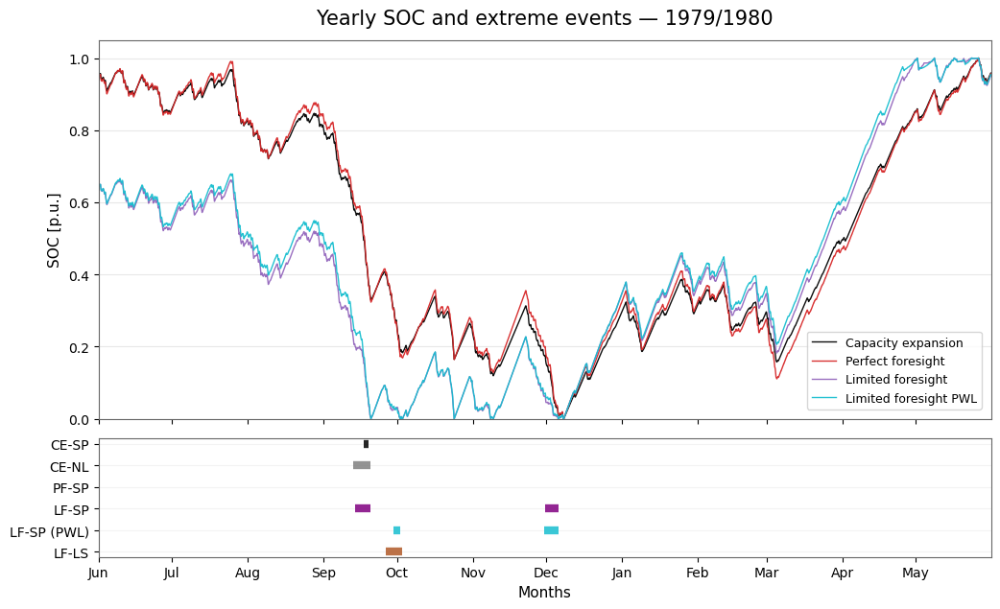

In [128]:
events, labels, colors = select_plot_inputs(
    events_by_key,
    keys=["CE_SP", "CE_NL", "PF_SP", "RH_SP", "RH_SP_PWL", "RH_LS"],
    label_style="short",
    colors_by_key=COLORS_BY_KEY,)

year = 1979

networks = {
    "Capacity expansion": networks_exp_base[year],
    "Perfect foresight": networks_pf_base[year],
    "Limited foresight": networks_rh_base[year],
    "Limited foresight PWL": networks_rh_base_PWL[year],
}

fig, (ax_soc, ax_evt) = plot_soc_and_events_single_year(
    year=year,
    networks=networks,
    event_dicts= events,
    event_labels= labels,
    event_colors= colors,
    carrier="hydrogen storage",
    normalized=True,
    soc_linewidth=1.0,
    start_month=6,
    title=f"Yearly SOC and extreme events — {str(year)}/{str(year + 1)}",
    soc_colors={
        "Capacity expansion": "black",
        "Perfect foresight": "tab:red",
        "Limited foresight": "tab:purple",
        "Limited foresight PWL": "tab:cyan",
    },
    figure_size=(12, 7),
)


In [129]:
# save_plots=False

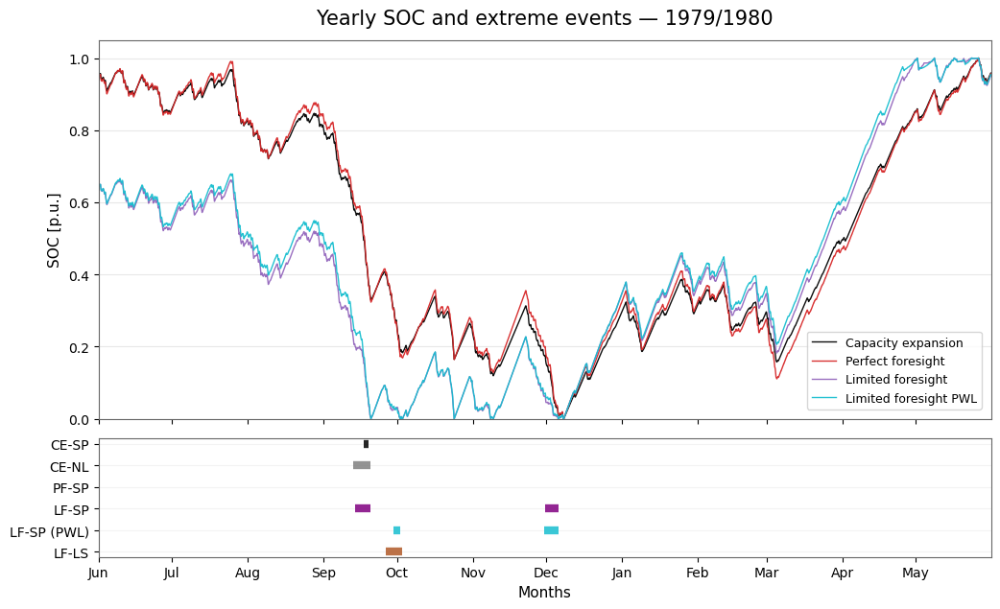

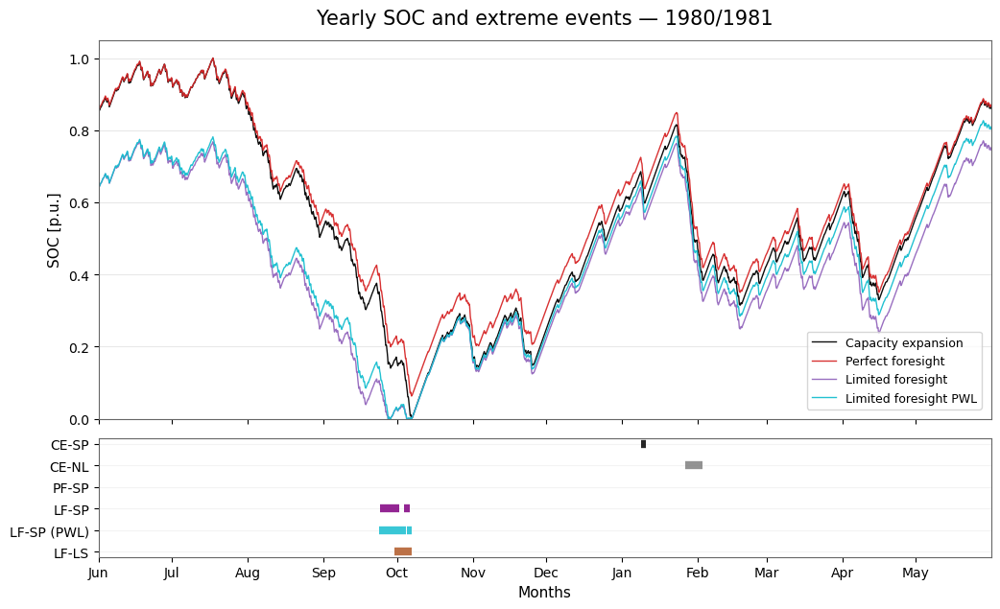

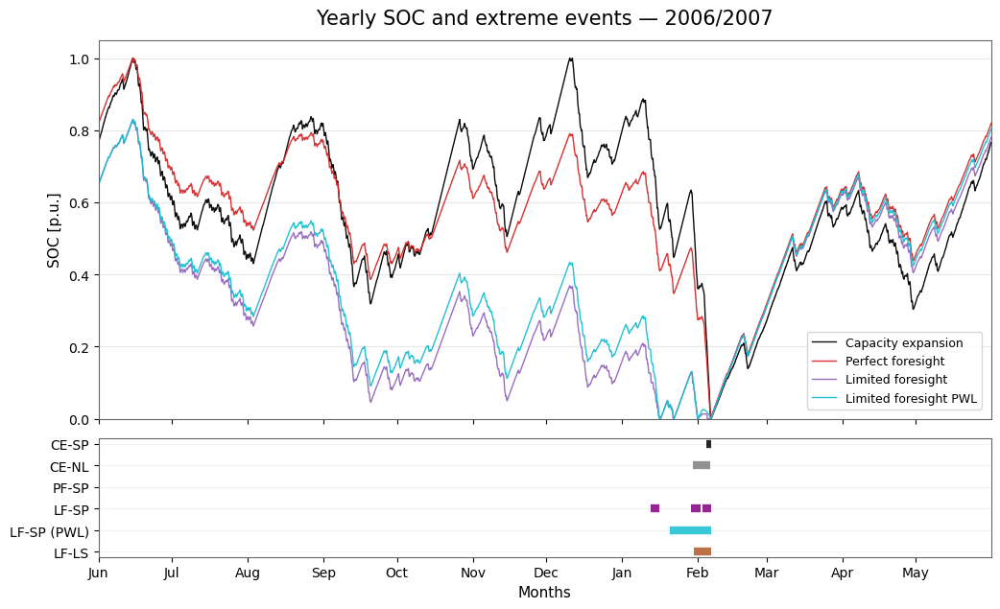

In [130]:
# Selected years used in the report
for year in [1979, 1980, 2006]:
    networks = {
        "Capacity expansion": networks_exp_base[year],
        "Perfect foresight": networks_pf_base[year],
        "Limited foresight": networks_rh_base[year],
        "Limited foresight PWL": networks_rh_base_PWL[year],
    }

    fig, (ax_soc, ax_evt) = plot_soc_and_events_single_year(
        year=year,
        networks=networks,
        event_dicts= events,
        event_labels= labels,
        event_colors= colors,
        carrier="hydrogen storage",
        normalized=True,
        soc_linewidth=1.0,
        start_month=6,
        title=f"Yearly SOC and extreme events — {str(year)}/{str(year + 1)}",
        soc_colors={
            "Capacity expansion": "black",
            "Perfect foresight": "tab:red",
            "Limited foresight": "tab:purple",
            "Limited foresight PWL": "tab:cyan",
        },
        figure_size=(12, 7),
    )

    if save_plots:
        plt.savefig(
            Figures_results_path / f"SOC_and_events_{year}_{Test_name_dispatch}.pdf",
            bbox_inches="tight",
        )
    

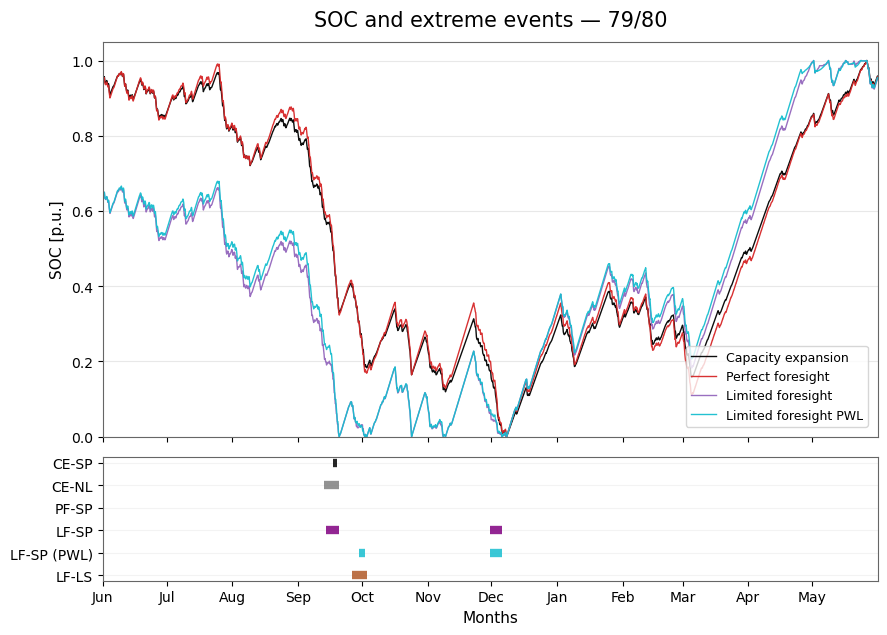

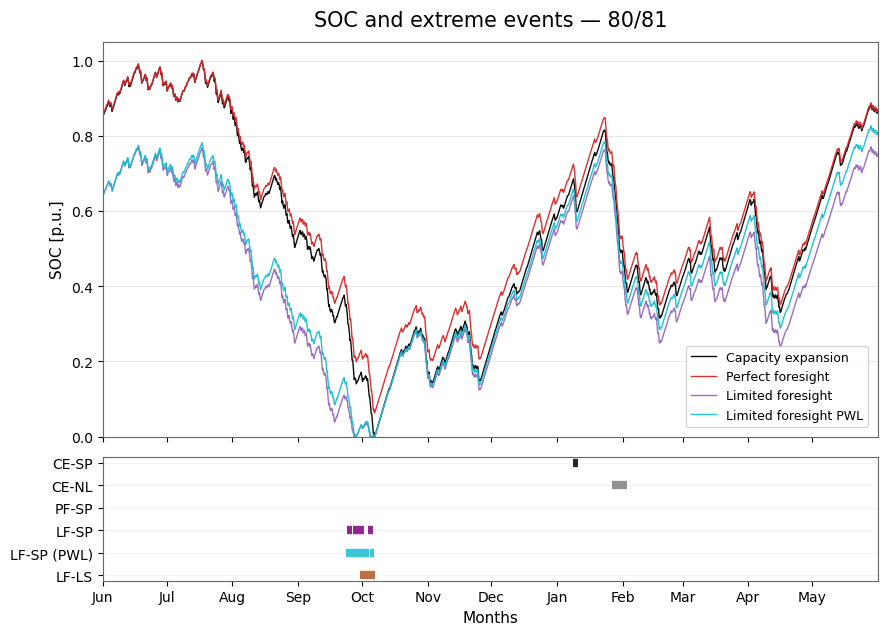

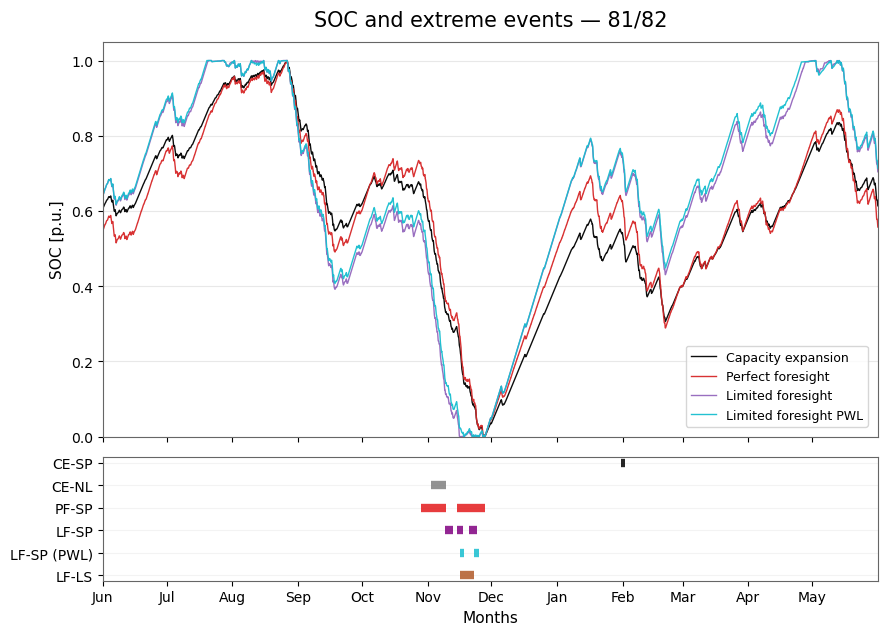

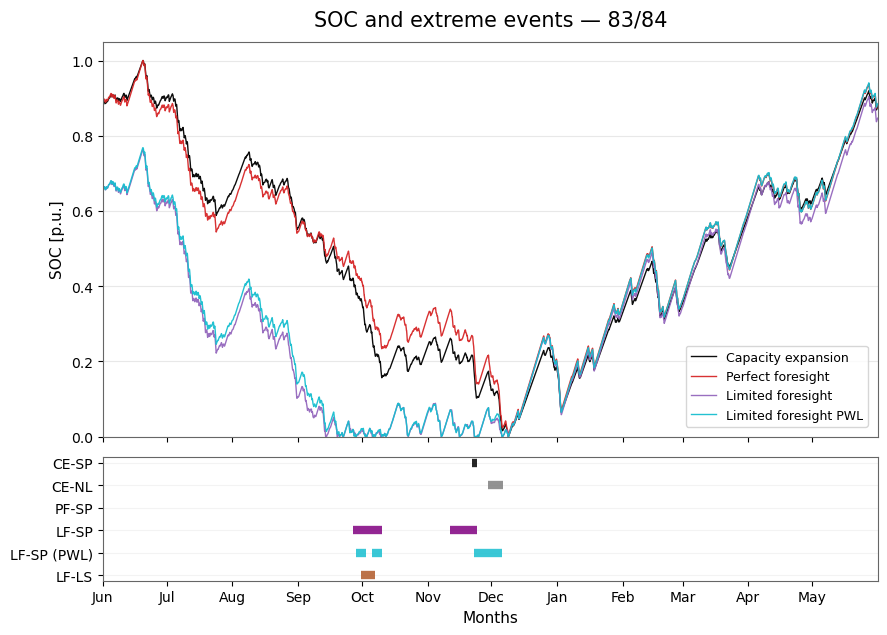

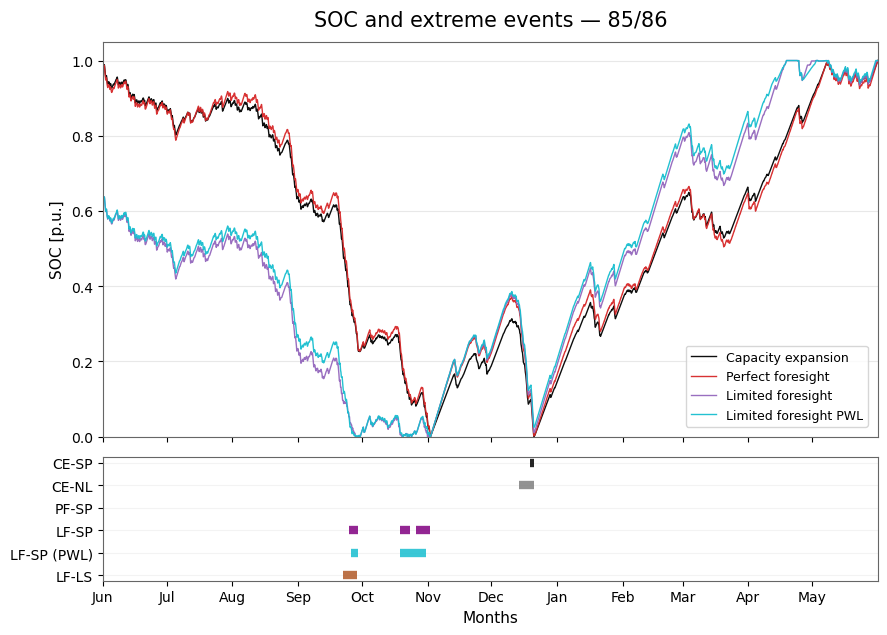

...

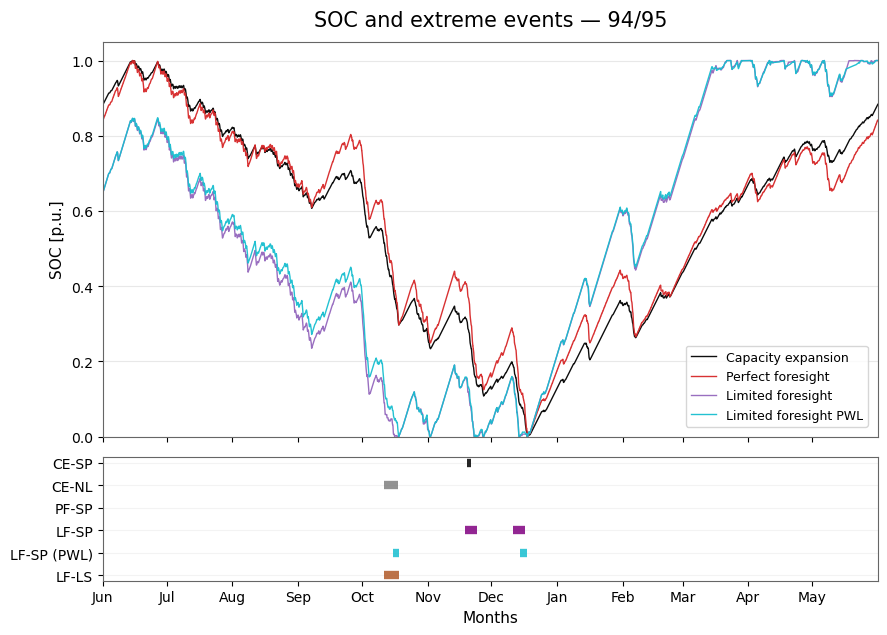

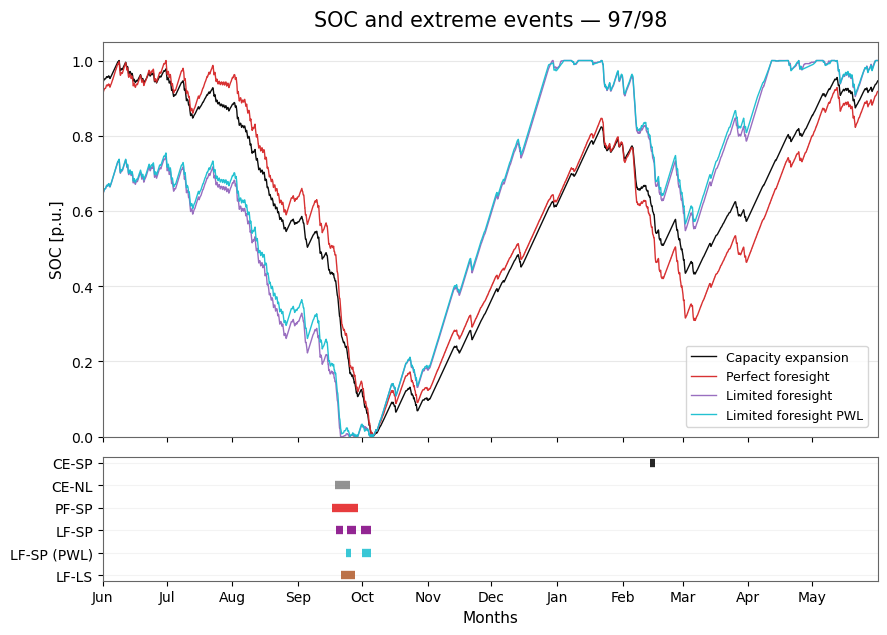

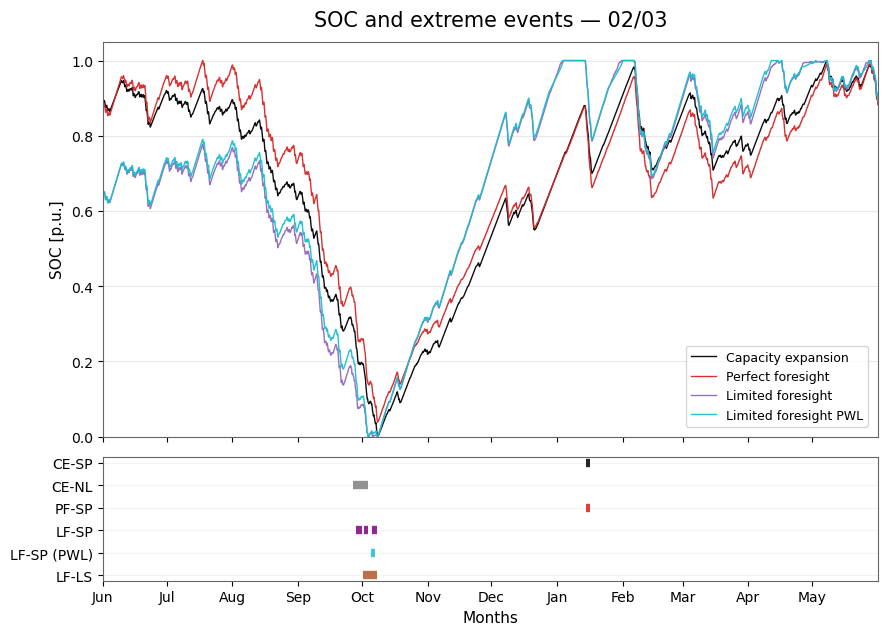

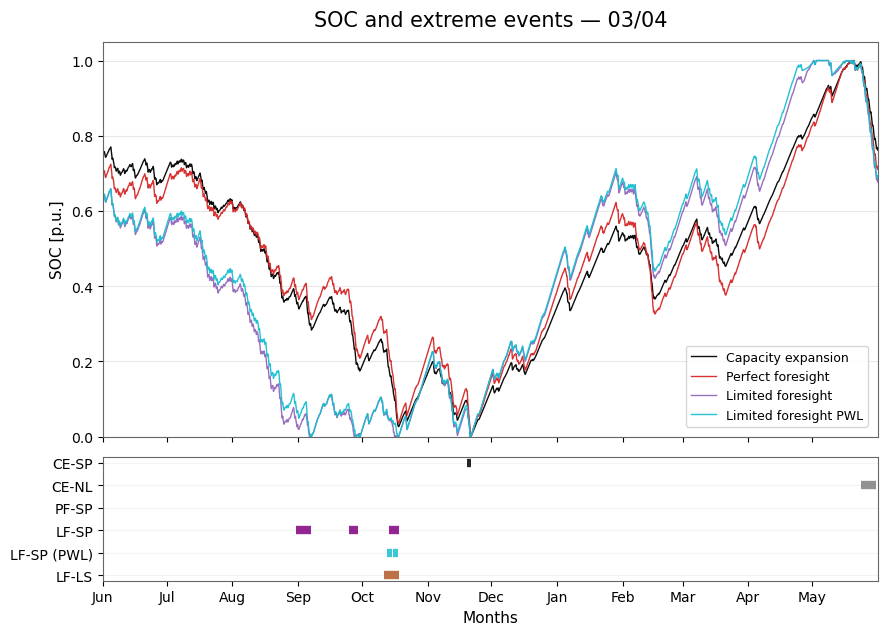

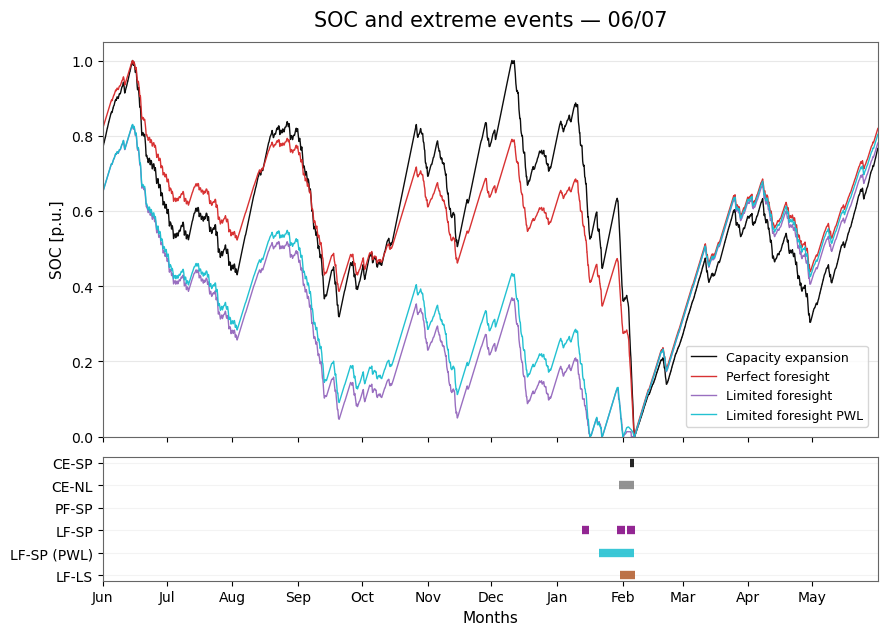

In [131]:
for year in problem_years_2:
#for year in [1979, 1980, 2006]:
    networks = {
        "Capacity expansion": networks_exp_base[year],
        "Perfect foresight": networks_pf_base[year],
        "Limited foresight": networks_rh_base[year],
        "Limited foresight PWL": networks_rh_base_PWL[year],
    }

    fig, (ax_soc, ax_evt) = plot_soc_and_events_single_year(
        year=year,
        networks=networks,
        event_dicts= events,
        event_labels= labels,
        event_colors= colors,
        carrier="hydrogen storage",
        normalized=True,
        soc_linewidth=1.0,
        start_month=6,
        soc_colors={
            "Capacity expansion": "black",
            "Perfect foresight": "tab:red",
            "Limited foresight": "tab:purple",
            "Limited foresight PWL": "tab:cyan",
        },
        figure_size=(10, 7),
    )

    

## - Overview table

### -- loop to create table

In [132]:

# Initialize dictionary to store results
models_data = {}

# Define the 5 models and their network dictionaries
models = {
    'Capacity Expansion': networks_exp_base,
    'Perfect Foresight': networks_pf_base,
    'Limited Foresight': networks_rh_base,
    'Perfect Foresight PWL': networks_pf_base_PWL,
    'Limited Foresight PWL': networks_rh_base_PWL
}

# Extract metrics for each model
for model_name, network_dict in models.items():
    
    mean_prices_yearly = []
    max_prices_yearly = []
    unique_prices_counts = []
    ens_yearly = []
    lolh_yearly = []
    
    # Iterate through all years
    for year in weather_years:
        net = network_dict[year]
        
        # Get shadow prices for this year
        prices = net.buses_t.marginal_price["electricity bus"]
        
        # 1. Mean price (average of all hourly prices in the year)
        mean_prices_yearly.append(prices.mean())
        
        # 2. Max price (collect all prices for later global max)
        max_prices_yearly.append(prices.max())
        
        # 3. Unique prices count (using the unique_prices function on network)
        unique_count = len(unique_prices(net))
        unique_prices_counts.append(unique_count)
        
        # 4. ENS (Energy Not Served) in GWh/year
        # Check if load shedding exists in the network
        if "load shedding" in net.generators.index:
            load_shedding = net.generators_t.p["load shedding"]
            ens_mwh = load_shedding.sum()
            ens_gwh = ens_mwh / 1000  # Convert MWh to GWh
        else:
            ens_gwh = 0  # No load shedding in this network
        ens_yearly.append(ens_gwh)
        
        # 5. LOLH (Loss of Load Hours)
        # Check if load shedding exists in the network
        # Use threshold of 0.01 MW to ignore numerical noise from solver
        if "load shedding" in net.generators.index:
            load_shedding = net.generators_t.p["load shedding"]
            lolh_hours = (load_shedding > 0.01).sum()
        else:
            lolh_hours = 0  # No load shedding in this network
        lolh_yearly.append(lolh_hours)
    
    # Calculate aggregated metrics
    models_data[model_name] = {
        'Mean Price': np.mean(mean_prices_yearly),
        'Max Price': np.max(max_prices_yearly),  # Max across all years
        'Unique Prices': np.mean(unique_prices_counts),  # Average across years
        'ENS': np.mean(ens_yearly),  # Average across years
        'LOLH': np.mean(lolh_yearly),  # Average across years
        'Max LOLH': np.max(lolh_yearly)  # Max across all years
    }

# Create DataFrame
model_results_df = pd.DataFrame(models_data).T

# Round all values to 0 decimals
model_results_df = model_results_df.round(0)

# Add a "unit" row with the units for each metric
units_row = pd.DataFrame({
    'Mean Price': '€/MWh',
    'Max Price': '€/MWh',
    'Unique Prices': '[]',
    'ENS': 'GWh/year',
    'LOLH': 'hours',
    'Max LOLH': 'hours'
}, index=['unit'])

model_results_df = pd.concat([units_row, model_results_df])

print(model_results_df)


                      Mean Price Max Price Unique Prices       ENS   LOLH  \
unit                       €/MWh     €/MWh            []  GWh/year  hours   
Capacity Expansion          99.0  224374.0           8.0       0.0    0.0   
Perfect Foresight         1820.0   10000.0           3.0    1374.0  222.0   
Limited Foresight          422.0   10000.0           5.0    1582.0  180.0   
Perfect Foresight PWL       82.0    1276.0          93.0       0.0    0.0   
Limited Foresight PWL      158.0   10000.0          97.0     147.0   40.0   

                      Max LOLH  
unit                     hours  
Capacity Expansion         0.0  
Perfect Foresight       1105.0  
Limited Foresight        762.0  
Perfect Foresight PWL      0.0  
Limited Foresight PWL    250.0  


### -- print table to latex 

In [133]:
print(df_to_latex_table(
    model_results_df,
    caption="Comparison of average key metrics across the model",
    label="tab:model_comparison_avg_metrics",
    float_fmt="{:.0f}",
    index=True,
    note = "ENS = Energy not Served, LOLH = Loss of Load Hours"
))

\begin{table}[ht]
\centering
\small
\caption{Comparison of average key metrics across the model}
\label{tab:model_comparison_avg_metrics}
\begin{threeparttable}
\begin{tabular}{lllllll}
\toprule
 & Mean Price & Max Price & Unique Prices & ENS & LOLH & Max LOLH \\
\midrule
unit & €/MWh & €/MWh & [] & GWh/year & hours & hours \\
Capacity Expansion & 99 & 224374 & 8 & 0 & 0 & 0 \\
Perfect Foresight & 1820 & 10000 & 3 & 1374 & 222 & 1105 \\
Limited Foresight & 422 & 10000 & 5 & 1582 & 180 & 762 \\
Perfect Foresight PWL & 82 & 1276 & 93 & 0 & 0 & 0 \\
Limited Foresight PWL & 158 & 10000 & 97 & 147 & 40 & 250 \\
\bottomrule
\end{tabular}
\begin{tablenotes}[flushleft]
\footnotesize \item ENS = Energy not Served, LOLH = Loss of Load Hours
\end{tablenotes}
\end{threeparttable}
\end{table}


# Sensitivity analysis

## - Varying threshold and capacities for SP method 

#### --- Creating loading events to create sensitivity tables  

In [134]:
sensitivity_analysis=False
beta_list = [0.10, 0.15, 0.20, 0.25, 0.30, 0.35, 0.40]

if sensitivity_analysis:
    new_events=False
    df_event_mean, df_avg_yearly_mean, df_avg_dur_mean = build_event_tables_for_beta_list(
        beta_list=beta_list,
        Test_name_exp=Test_name_exp,
        Test_name_dispatch=Test_name_dispatch,
        Test_name_dispatch_PWL=Test_name_dispatch_PWL,
        selected_networks_exp=selected_networks_exp,
        selected_networks_pf=selected_networks_pf,
        selected_networks_pf_PWL=selected_networks_pf_PWL,
        selected_networks_rh=selected_networks_rh,
        selected_networks_rh_PWL=selected_networks_rh_PWL,
        years=weather_years,
        length=length,
        new_events=new_events,
    )



In [135]:
if sensitivity_analysis:
    selected_networks_pf = networks_pf_base_q75
    selected_networks_rh = networks_rh_base_q75
    selected_networks_exp = networks_exp_base
    selected_networks_pf_PWL = networks_pf_base_PWL_q75
    selected_networks_rh_PWL = networks_rh_base_PWL_q75
    
    new_events=False
    df_event_q75, df_avg_yearly_q75, df_avg_dur_q75 = build_event_tables_for_beta_list(
        beta_list=beta_list,
        Test_name_exp=Test_name_exp,
        Test_name_dispatch=Test_name_dispatch_q75,
        Test_name_dispatch_PWL=Test_name_dispatch_PWL_q75,
        selected_networks_exp=selected_networks_exp,
        selected_networks_pf=selected_networks_pf,
        selected_networks_pf_PWL=selected_networks_pf_PWL,
        selected_networks_rh=selected_networks_rh,
        selected_networks_rh_PWL=selected_networks_rh_PWL,
        years=weather_years,
        length=length,
        new_events=new_events,
    )

In [136]:
if sensitivity_analysis:
    # select q35 networks
    selected_networks_pf = networks_pf_base_q35
    selected_networks_rh = networks_rh_base_q35
    selected_networks_exp = networks_exp_base
    selected_networks_pf_PWL = networks_pf_base_PWL_q35
    selected_networks_rh_PWL = networks_rh_base_PWL_q35

    new_events=False
    df_event_q35, df_avg_yearly_q35, df_avg_dur_q35 = build_event_tables_for_beta_list(
        beta_list=beta_list,
        Test_name_exp=Test_name_exp,
        Test_name_dispatch=Test_name_dispatch_q35,
        Test_name_dispatch_PWL=Test_name_dispatch_PWL_q35,
        selected_networks_exp=selected_networks_exp,
        selected_networks_pf=selected_networks_pf,
        selected_networks_pf_PWL=selected_networks_pf_PWL,
        selected_networks_rh=selected_networks_rh,
        selected_networks_rh_PWL=selected_networks_rh_PWL,
        years=weather_years,
        length=length,
        new_events=new_events,
    )

In [137]:
if sensitivity_analysis:
    table_path = Results_path
    df_event_q75.to_csv(table_path/f"Event_counts_SP_all_models_{Test_name_dispatch_q75}.csv")
    df_avg_yearly_q75.to_csv(table_path/f"Avg_yearly_events_SP_all_models_{Test_name_dispatch_q75}.csv")
    df_avg_dur_q75.to_csv(table_path/f"Avg_duration_SP_all_models_{Test_name_dispatch_q75}.csv")


#### --- Plotting for sensitivity of beta 

In [139]:
if sensitivity_analysis:
    labels = [
        "Capacity expansion",
        "Perfect foresight",
        "Perfect foresight PWL",
        "Limited foresight",
        "Limited foresight PWL",
    ]

    fig, ax = plot_avg_yearly_events_vs_threshold(
        df_event_mean,
        title=r"Average yearly number of extreme events vs cost threshold $\beta$",
        figure_size=(7,6),
        file_name=f"avg_yearly_events_vs_T_{Test_name_dispatch}.pdf",
        labels=labels,
    )
    fig, ax = plot_avg_event_duration_vs_threshold(
        df_avg_dur_mean,
        title=r"Average event duration vs cost threshold $\beta$",
        file_name=f"avg_event_duration_vs_T_{Test_name_dispatch}.pdf",
        labels=labels,
        figure_size=(7,6),
    )

#### --- Plotting for capacity sensitivity

In [140]:
if sensitivity_analysis:
    tables_by_cap_avg_duration = {
        "Mean": df_avg_dur_mean,
        "35th Quantile": df_avg_dur_q35,
        "75th Quantile": df_avg_dur_q75,
    }

    tables_by_cap_avg_yearly_events = {
        "Mean": df_avg_yearly_mean,
        "35th Quantile": df_avg_yearly_q35,
        "75th Quantile": df_avg_yearly_q75,
    }



In [141]:
if sensitivity_analysis:
    beta_star = 0.20
    model_cols = [
        "Capacity expansion",
        "Perfect foresight",
        "Perfect foresight PWL",
        "Limited foresight",
        "Limited foresight PWL",
    ]

    bars_events = rows_at_threshold_beta(tables_by_cap_avg_yearly_events, beta_star, model_cols)
    fig, ax = plot_capacity_sensitivity_bars(
        bars_events,
        model_cols=model_cols,
        ylabel="Events per year []",
        title = rf"Avg. events per year sensitivity to capacities for $\beta={beta_star:.2f}$",
        file_name=f"sensitivity_capacities_avg_events_beta_{int(beta_star*100)}.pdf",
    )
    

    bars_dur = rows_at_threshold_beta(tables_by_cap_avg_duration, beta_star, model_cols)
    fig, ax = plot_capacity_sensitivity_bars(
        bars_dur,
        model_cols=model_cols,
        ylabel="Average event duration [days]",
        title = rf"Avg. event duration sensitivity to capacities for $\beta={beta_star:.2f}$",
        file_name=f"sensitivity_capacities_avg_duration_beta_{int(beta_star*100)}.pdf",
    )


#### --- Showing the tables and print to latex

In [142]:
create_tables = False
if create_tables:    
    print("Total event number pr model across all 32 years:")
    print(df_table_event_pr_model)
    #print(f"\nFrom test: {Test_name_dispatch}")

    print("Yearly avg event number pr model:")
    print(df_table_avg_yearly_event_pr_model)
    #print(f"\nFrom test: {Test_name_dispatch}")

    print("Avg event duration (days) pr model:")
    print(df_table_avg_event_duration_pr_model)
    print(f"\nFrom test: {Test_name_dispatch}")

In [143]:
if create_tables:
    print(df_to_latex_table(
        df = df_table_event_pr_model,
        caption = f"Total number of extreme events identified for each model across all years. Sce {Test_name_dispatch}",
        label = f"tab:total_extreme_events_{Test_name_dispatch}",
        index = False,
        placement = "H",
    ))
    print("")
    print(df_to_latex_table(
        df = df_table_avg_yearly_event_pr_model,
        caption = f"Average yearly number of extreme events identified for each model. Sce {Test_name_dispatch}",
        label = f"tab:avg_yearly_extreme_events_{Test_name_dispatch}",
        index = False,
        placement = "H",
    ))
    print("")
    print(df_to_latex_table(
        df = df_table_avg_event_duration_pr_model,
        caption = f"Average duration of extreme events (in days) for each model. Sce {Test_name_dispatch}",
        label = f"tab:avg_event_duration_{Test_name_dispatch}",
        index = False,
        placement = "H",
    ))